<a href="https://colab.research.google.com/github/code1wan/extreme-weather-prediction/blob/main/Early_Warning_Extreme_Weather_Prediction_With_Windowing_Method.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Early Warning Extreme Weather Prediction With Windowing Method

## A. Data Preprocesing

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df=pd.read_csv('/content/drive/MyDrive/dataset-4/train.csv')
pd.set_option('display.max_columns', None)

In [ ]:
df.head()

,id,date,Iws,Ir,pm2.5,PRES,cbwd,DEWP,Temperature
0,0,2016-07-01 00:00:00,5.827,2.009,1.599,0.462,4.203,1.340,30.531000
1,1,2016-07-01 00:15:00,5.760,2.076,1.492,0.426,4.264,1.401,30.459999
2,2,2016-07-01 00:30:00,5.760,1.942,1.492,0.391,4.234,1.310,30.038000
3,3,2016-07-01 00:45:00,5.760,1.942,1.492,0.426,4.234,1.310,27.013000
4,4,2016-07-01 01:00:00,5.693,2.076,1.492,0.426,4.142,1.371,27.787001


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64320 entries, 0 to 64319
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   id           64320 non-null  int64  
 1   date         64320 non-null  object 
 2   Iws          64320 non-null  float64
 3   Ir           64320 non-null  float64
 4   pm2.5        64320 non-null  float64
 5   PRES         64320 non-null  float64
 6   cbwd         64320 non-null  float64
 7   DEWP         64320 non-null  float64
 8   Temperature  64320 non-null  float64
dtypes: float64(7), int64(1), object(1)
memory usage: 4.4+ MB


### Missing Value

---



In [ ]:
df.isna().sum()

id             0
date           0
Iws            0
Ir             0
pm2.5          0
PRES           0
cbwd           0
DEWP           0
Temperature    0
dtype: int64

### Outlier

---



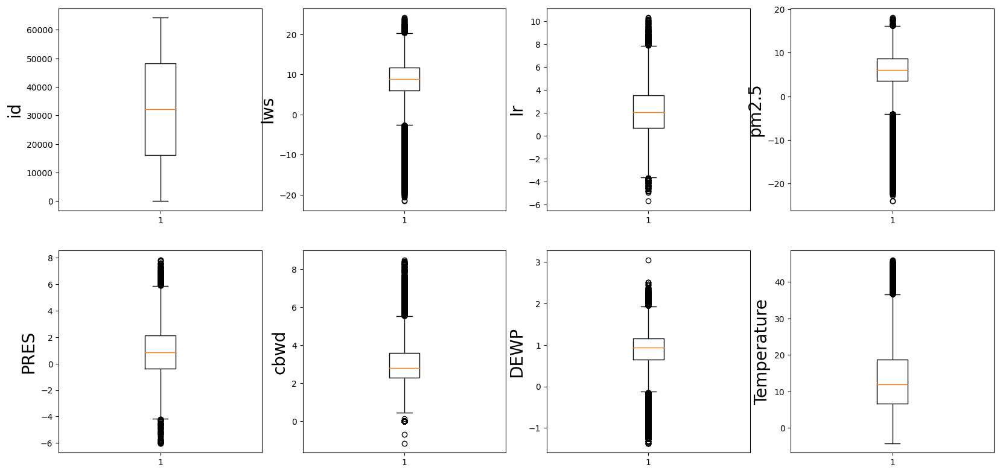

In [ ]:
temp=df
plt.figure(figsize=(20,20), facecolor='white')
plotnumber=1
for column in temp.select_dtypes(include=['float64', 'int64']).columns:
    if plotnumber<15 :
        plt.subplot(4,4,plotnumber)
        plt.boxplot(temp[column])
        plt.ylabel(column,fontsize=20)
    plotnumber+=1
plt.show()

<Axes: >

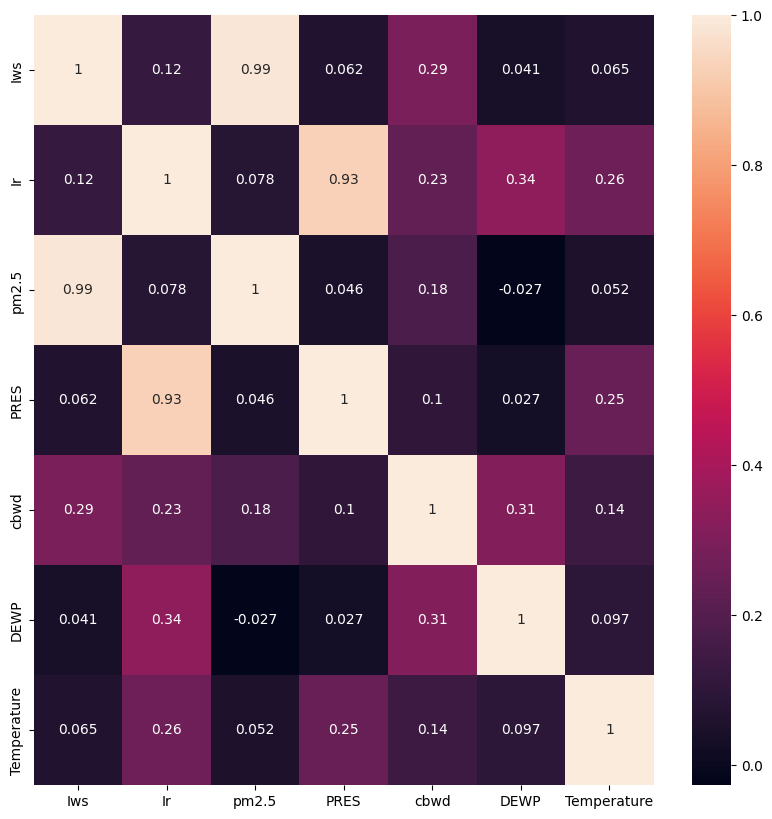

In [ ]:
temp['date'] = pd.to_datetime(temp['date'])
temp = temp.drop(columns = ['id', 'date'], axis=1)
plt.figure(figsize=(10, 10))
corr = temp.corr()
sns.heatmap(corr, annot=True)

### Feature Enhancement
---



In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64320 entries, 0 to 64319
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   id           64320 non-null  int64         
 1   date         64320 non-null  datetime64[ns]
 2   Iws          64320 non-null  float64       
 3   Ir           64320 non-null  float64       
 4   pm2.5        64320 non-null  float64       
 5   PRES         64320 non-null  float64       
 6   cbwd         64320 non-null  float64       
 7   DEWP         64320 non-null  float64       
 8   Temperature  64320 non-null  float64       
dtypes: datetime64[ns](1), float64(7), int64(1)
memory usage: 4.4 MB


In [ ]:
#Cek value dibawah 0 pada beberapa kolom
df[df['Iws']<0]['Iws'].count()

8093

In [ ]:
df[df['Ir']<0]['Ir'].count()

9148

In [ ]:
df[df['pm2.5']<0]['pm2.5'].count()

10249

In [ ]:
df[df['PRES']<0]['PRES'].count()

19339

In [ ]:
df[df['cbwd']<0]['cbwd'].count()

2

In [ ]:
#Ubah nilai dibawah kolom kedalam bentuk nilai mutlak
df[['Iws','Ir','pm2.5','PRES', 'cbwd']] = df[['Iws','Ir','pm2.5','PRES', 'cbwd']].abs()

In [ ]:
#Menghapus nilai 0 menjadi NaN
df[['Iws','Ir','pm2.5','PRES', 'cbwd', 'DEWP', 'Temperature']] = df[['Iws','Ir','pm2.5','PRES', 'cbwd', 'DEWP', 'Temperature']].replace(0, np.nan)

#Mengisi nilai NaN dengan nilai yang berdekatan dengan interpolate linear
df[['Iws','Ir','pm2.5','PRES', 'cbwd', 'DEWP','Temperature']] = df[['Iws','Ir','pm2.5','PRES', 'cbwd','DEWP', 'Temperature']].interpolate(method='linear')

In [ ]:
#Cek value 0 pada beberapa kolom
df[df[['Iws','Ir','pm2.5','PRES', 'cbwd']]==0].count()

id             0
date           0
Iws            0
Ir             0
pm2.5          0
PRES           0
cbwd           0
DEWP           0
Temperature    0
dtype: int64

In [ ]:
#Mengubah kolom cbwd (arah angin) kedalam bentuk interger
df['cbwd'] = df['cbwd'].astype('int64')

In [ ]:
df

,id,date,Iws,Ir,pm2.5,PRES,cbwd,DEWP,Temperature
0,0,2016-07-01 00:00:00,5.827,2.009,1.599,0.462,4,1.340,30.531000
1,1,2016-07-01 00:15:00,5.760,2.076,1.492,0.426,4,1.401,30.459999
2,2,2016-07-01 00:30:00,5.760,1.942,1.492,0.391,4,1.310,30.038000
3,3,2016-07-01 00:45:00,5.760,1.942,1.492,0.426,4,1.310,27.013000
4,4,2016-07-01 01:00:00,5.693,2.076,1.492,0.426,4,1.371,27.787001
...,...,...,...,...,...,...,...,...,...
64315,64315,2018-05-01 22:45:00,12.458,1.407,7.889,0.746,4,1.523,10.622000
64316,64316,2018-05-01 23:00:00,14.200,1.541,9.310,0.284,4,1.249,10.482000
64317,64317,2018-05-01 23:15:00,12.659,1.474,7.924,0.959,4,1.310,10.271000
64318,64318,2018-05-01 23:30:00,13.329,1.541,8.671,0.533,4,1.371,10.341000


In [ ]:
df['date'] = df['date'].astype('datetime64[s]')
df['date_only'] = df['date'].dt.date
df['time_only'] = df['date'].dt.time
df['date'] = pd.to_datetime(df['date'])
df['tahun'] = df['date'].dt.year
df['bulan'] = df['date'].dt.month
df['hari'] = df['date'].dt.day
df['jam'] = df['date'].dt.hour
df['menit'] = df['date'].dt.minute

In [ ]:
df.describe()

,id,date,Iws,Ir,pm2.5,PRES,cbwd,DEWP,Temperature,tahun,bulan,hari,jam,menit
count,64320.000000,64320,64320.000000,64320.000000,64320.000000,64320.000000,64320.000000,64320.000000,64320.000000,64320.000000,64320.000000,64320.000000,64320.00000,64320.00000
mean,32159.500000,2017-05-31 23:52:30,9.390951,2.418520,7.205069,1.637907,2.552876,0.835492,13.611735,2016.905970,6.617910,15.695522,11.50000,22.50000
min,0.000000,2016-07-01 00:00:00,0.067000,0.067000,0.036000,0.036000,0.000000,-1.371000,-4.221000,2016.000000,1.000000,1.000000,0.00000,0.00000
25%,16079.750000,2016-12-15 11:56:15,6.765000,1.072000,4.691000,0.711000,2.000000,0.670000,6.753000,2016.000000,3.000000,8.000000,5.75000,11.25000
50%,32159.500000,2017-05-31 23:52:30,9.310000,2.143000,6.894000,1.492000,2.000000,0.944000,11.959000,2017.000000,7.000000,16.000000,11.50000,22.50000
75%,48239.250000,2017-11-15 11:48:45,12.056000,3.550000,9.346000,2.345000,3.000000,1.188000,18.712000,2017.000000,10.000000,23.000000,17.25000,33.75000
max,64319.000000,2018-05-01 23:45:00,24.180000,10.315000,23.986000,7.853000,8.000000,3.046000,46.007000,2018.000000,12.000000,31.000000,23.00000,45.00000
std,18567.728994,NaN,4.028937,1.686503,3.559787,1.141204,1.197463,0.598274,8.825864,0.668124,3.581528,8.807112,6.92224,16.77064


#### Iws_change

---



 Iws_change : perubahan kecepatan angin dalam selang waktu 15 menit

In [ ]:
df['Iws_change'] = df['Iws'].diff().round(2)
df

,id,date,Iws,Ir,pm2.5,PRES,cbwd,DEWP,Temperature,date_only,time_only,tahun,bulan,hari,jam,menit,Iws_change
0,0,2016-07-01 00:00:00,5.827,2.009,1.599,0.462,4,1.340,30.531000,2016-07-01,00:00:00,2016,7,1,0,0,NaN
1,1,2016-07-01 00:15:00,5.760,2.076,1.492,0.426,4,1.401,30.459999,2016-07-01,00:15:00,2016,7,1,0,15,-0.07
2,2,2016-07-01 00:30:00,5.760,1.942,1.492,0.391,4,1.310,30.038000,2016-07-01,00:30:00,2016,7,1,0,30,0.00
3,3,2016-07-01 00:45:00,5.760,1.942,1.492,0.426,4,1.310,27.013000,2016-07-01,00:45:00,2016,7,1,0,45,0.00
4,4,2016-07-01 01:00:00,5.693,2.076,1.492,0.426,4,1.371,27.787001,2016-07-01,01:00:00,2016,7,1,1,0,-0.07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64315,64315,2018-05-01 22:45:00,12.458,1.407,7.889,0.746,4,1.523,10.622000,2018-05-01,22:45:00,2018,5,1,22,45,0.54
64316,64316,2018-05-01 23:00:00,14.200,1.541,9.310,0.284,4,1.249,10.482000,2018-05-01,23:00:00,2018,5,1,23,0,1.74
64317,64317,2018-05-01 23:15:00,12.659,1.474,7.924,0.959,4,1.310,10.271000,2018-05-01,23:15:00,2018,5,1,23,15,-1.54
64318,64318,2018-05-01 23:30:00,13.329,1.541,8.671,0.533,4,1.371,10.341000,2018-05-01,23:30:00,2018,5,1,23,30,0.67


#### Ir_intensity

---



Ir_intensity : intensitas kumulatif hujan

In [ ]:
df['Ir_intensity'] = df.groupby('date_only')['Ir'].cumsum().round(2)
df

,id,date,Iws,Ir,pm2.5,PRES,cbwd,DEWP,Temperature,date_only,time_only,tahun,bulan,hari,jam,menit,Iws_change,Ir_intensity
0,0,2016-07-01 00:00:00,5.827,2.009,1.599,0.462,4,1.340,30.531000,2016-07-01,00:00:00,2016,7,1,0,0,NaN,2.01
1,1,2016-07-01 00:15:00,5.760,2.076,1.492,0.426,4,1.401,30.459999,2016-07-01,00:15:00,2016,7,1,0,15,-0.07,4.09
2,2,2016-07-01 00:30:00,5.760,1.942,1.492,0.391,4,1.310,30.038000,2016-07-01,00:30:00,2016,7,1,0,30,0.00,6.03
3,3,2016-07-01 00:45:00,5.760,1.942,1.492,0.426,4,1.310,27.013000,2016-07-01,00:45:00,2016,7,1,0,45,0.00,7.97
4,4,2016-07-01 01:00:00,5.693,2.076,1.492,0.426,4,1.371,27.787001,2016-07-01,01:00:00,2016,7,1,1,0,-0.07,10.05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64315,64315,2018-05-01 22:45:00,12.458,1.407,7.889,0.746,4,1.523,10.622000,2018-05-01,22:45:00,2018,5,1,22,45,0.54,114.57
64316,64316,2018-05-01 23:00:00,14.200,1.541,9.310,0.284,4,1.249,10.482000,2018-05-01,23:00:00,2018,5,1,23,0,1.74,116.11
64317,64317,2018-05-01 23:15:00,12.659,1.474,7.924,0.959,4,1.310,10.271000,2018-05-01,23:15:00,2018,5,1,23,15,-1.54,117.59
64318,64318,2018-05-01 23:30:00,13.329,1.541,8.671,0.533,4,1.371,10.341000,2018-05-01,23:30:00,2018,5,1,23,30,0.67,119.13


#### Pres_change

---



Pres_change : perubahan tekanan udara dalam selang waktu 15 menit

In [ ]:
df['pres_change'] = df['PRES'].diff().round(2)
df

,id,date,Iws,Ir,pm2.5,PRES,cbwd,DEWP,Temperature,date_only,time_only,tahun,bulan,hari,jam,menit,Iws_change,Ir_intensity,pres_change
0,0,2016-07-01 00:00:00,5.827,2.009,1.599,0.462,4,1.340,30.531000,2016-07-01,00:00:00,2016,7,1,0,0,NaN,2.01,NaN
1,1,2016-07-01 00:15:00,5.760,2.076,1.492,0.426,4,1.401,30.459999,2016-07-01,00:15:00,2016,7,1,0,15,-0.07,4.09,-0.04
2,2,2016-07-01 00:30:00,5.760,1.942,1.492,0.391,4,1.310,30.038000,2016-07-01,00:30:00,2016,7,1,0,30,0.00,6.03,-0.03
3,3,2016-07-01 00:45:00,5.760,1.942,1.492,0.426,4,1.310,27.013000,2016-07-01,00:45:00,2016,7,1,0,45,0.00,7.97,0.03
4,4,2016-07-01 01:00:00,5.693,2.076,1.492,0.426,4,1.371,27.787001,2016-07-01,01:00:00,2016,7,1,1,0,-0.07,10.05,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64315,64315,2018-05-01 22:45:00,12.458,1.407,7.889,0.746,4,1.523,10.622000,2018-05-01,22:45:00,2018,5,1,22,45,0.54,114.57,-0.57
64316,64316,2018-05-01 23:00:00,14.200,1.541,9.310,0.284,4,1.249,10.482000,2018-05-01,23:00:00,2018,5,1,23,0,1.74,116.11,-0.46
64317,64317,2018-05-01 23:15:00,12.659,1.474,7.924,0.959,4,1.310,10.271000,2018-05-01,23:15:00,2018,5,1,23,15,-1.54,117.59,0.67
64318,64318,2018-05-01 23:30:00,13.329,1.541,8.671,0.533,4,1.371,10.341000,2018-05-01,23:30:00,2018,5,1,23,30,0.67,119.13,-0.43


#### Humidity

---


Sumber:
https://learn.weatherstem.com/modules/learn/lessons/101/15.html


In [ ]:
import math
def vapor_pressure(temp):
  return 6.112 * math.exp((17.67 * temp) / (temp + 243.5))

def relative_humidity(Temperature, DEWP):
  e_DEWP = vapor_pressure(DEWP)
  e_Temperature = vapor_pressure(Temperature)
  return 100*(e_DEWP/e_Temperature)

df['humidity'] = df.apply(lambda row: relative_humidity(row['Temperature'], row['DEWP']), axis=1)

#### Heat Index

---



Sumber:
https://www.ksnblocal4.com/2023/07/28/calculating-heat-index-why-we-feel-sticky-muggy-day/

In [ ]:
def heat_index(rh, Temperature):
  temp_f = (Temperature * 9/5) + 32

  c1 = -42.379
  c2 = 2.04901523
  c3 = 10.14333127
  c4 = -0.22475541
  c5 = -0.00683783
  c6 = -0.05481717
  c7 = 0.00122874
  c8 = 0.00085282
  c9 = -0.00000199

  hi = (c1 + (c2 * temp_f) + (c3 * rh) + (c4 * temp_f * rh) +
                (c5 * temp_f ** 2) + (c6 * rh ** 2) +
                (c7 * temp_f ** 2 * rh) + (c8 * temp_f * rh ** 2) +
                (c9 * temp_f ** 2 * rh ** 2))

  if temp_f < 80:
    hi = 0.5 * (temp_f + 61 + ((temp_f - 68) * 1.2) + (rh * 0.094))

  return hi

df['heat_index'] = df.apply(lambda row: heat_index(row['humidity'], row['Temperature']), axis=1)

#### Wind chill

---



Wind chill : index angin dingin

Sumber:
- Kodingan https://www.geeksforgeeks.org/wind-chill-factorwcf-or-wind-chill-indexwci/
- Tingkat Resiko dan Dampak  https://www.canada.ca/en/environment-climate-change/services/weather-health/wind-chill-cold-weather/wind-chill-index.html
- Tabel dalam Celcius & km/jam https://www.britannica.com/facts/wind-chill

In [ ]:
df['Iws_kmh'] = df['Iws'] * (3600/1000)
df['wind_chill'] = 13.12 + 0.6215 * df['Temperature'] -  11.37 * pow(df['Iws_kmh'], 0.16) + 0.3965 * df['Temperature'] * pow(df['Iws_kmh'], 0.16)
df['wind_chill'] = df['wind_chill'].round(2)
df

,id,date,Iws,Ir,pm2.5,PRES,cbwd,DEWP,Temperature,date_only,time_only,tahun,bulan,hari,jam,menit,Iws_change,Ir_intensity,pres_change,humidity,heat_index,Iws_kmh,wind_chill
0,0,2016-07-01 00:00:00,5.827,2.009,1.599,0.462,4,1.340,30.531000,2016-07-01,00:00:00,2016,7,1,0,0,NaN,2.01,NaN,15.381799,83.422252,20.977201,33.29
1,1,2016-07-01 00:15:00,5.760,2.076,1.492,0.426,4,1.401,30.459999,2016-07-01,00:15:00,2016,7,1,0,15,-0.07,4.09,-0.04,15.512270,83.321914,20.736001,33.20
2,2,2016-07-01 00:30:00,5.760,1.942,1.492,0.391,4,1.310,30.038000,2016-07-01,00:30:00,2016,7,1,0,30,0.00,6.03,-0.03,15.789261,82.721527,20.736001,32.67
3,3,2016-07-01 00:45:00,5.760,1.942,1.492,0.426,4,1.310,27.013000,2016-07-01,00:45:00,2016,7,1,0,45,0.00,7.97,0.03,18.825751,78.912607,20.736001,28.84
4,4,2016-07-01 01:00:00,5.693,2.076,1.492,0.426,4,1.371,27.787001,2016-07-01,01:00:00,2016,7,1,1,0,-0.07,10.05,0.00,18.069482,79.796032,20.494799,29.82
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64315,64315,2018-05-01 22:45:00,12.458,1.407,7.889,0.746,4,1.523,10.622000,2018-05-01,22:45:00,2018,5,1,22,45,0.54,114.57,-0.57,53.325637,48.437864,44.848801,6.57
64316,64316,2018-05-01 23:00:00,14.200,1.541,9.310,0.284,4,1.249,10.482000,2018-05-01,23:00:00,2018,5,1,23,0,1.74,116.11,-0.46,52.777832,48.134919,51.119999,6.10
64317,64317,2018-05-01 23:15:00,12.659,1.474,7.924,0.959,4,1.310,10.271000,2018-05-01,23:15:00,2018,5,1,23,15,-1.54,117.59,0.67,53.761480,47.763369,45.572401,6.06
64318,64318,2018-05-01 23:30:00,13.329,1.541,8.671,0.533,4,1.371,10.341000,2018-05-01,23:30:00,2018,5,1,23,30,0.67,119.13,-0.43,53.745501,47.901218,47.984402,6.04


In [ ]:
df['wind_chill'].unique()

array([33.29, 33.2 , 32.67, ..., -9.2 , -8.44, -7.15])

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64320 entries, 0 to 64319
Data columns (total 23 columns):
 #   Column        Non-Null Count  Dtype        
---  ------        --------------  -----        
 0   id            64320 non-null  int64        
 1   date          64320 non-null  datetime64[s]
 2   Iws           64320 non-null  float64      
 3   Ir            64320 non-null  float64      
 4   pm2.5         64320 non-null  float64      
 5   PRES          64320 non-null  float64      
 6   cbwd          64320 non-null  int64        
 7   DEWP          64320 non-null  float64      
 8   Temperature   64320 non-null  float64      
 9   date_only     64320 non-null  object       
 10  time_only     64320 non-null  object       
 11  tahun         64320 non-null  int32        
 12  bulan         64320 non-null  int32        
 13  hari          64320 non-null  int32        
 14  jam           64320 non-null  int32        
 15  menit         64320 non-null  int32        
 16  Iws_

In [ ]:
df.isna().sum()

id              0
date            0
Iws             0
Ir              0
pm2.5           0
PRES            0
cbwd            0
DEWP            0
Temperature     0
date_only       0
time_only       0
tahun           0
bulan           0
hari            0
jam             0
menit           0
Iws_change      1
Ir_intensity    0
pres_change     1
humidity        0
heat_index      0
Iws_kmh         0
wind_chill      0
dtype: int64

In [ ]:
df['Iws_change'] = df['Iws_change'].fillna(0)
df['pres_change'] = df['pres_change'].fillna(0)

In [ ]:
df.isna().sum()

id              0
date            0
Iws             0
Ir              0
pm2.5           0
PRES            0
cbwd            0
DEWP            0
Temperature     0
date_only       0
time_only       0
tahun           0
bulan           0
hari            0
jam             0
menit           0
Iws_change      0
Ir_intensity    0
pres_change     0
humidity        0
heat_index      0
Iws_kmh         0
wind_chill      0
dtype: int64

#### Klasifikasi season

In [ ]:
def season(month):
    if month in [12, 1, 2]:
        return 0 # Winter
    elif month in [3, 4, 5]:
        return 1 #Spring
    elif month in [6, 7, 8]:
        return 2 #Summer
    else:
        return 3 #Autumn

df['season'] = df['bulan'].apply(season)
df

,id,date,Iws,Ir,pm2.5,PRES,cbwd,DEWP,Temperature,date_only,time_only,tahun,bulan,hari,jam,menit,Iws_change,Ir_intensity,pres_change,humidity,heat_index,Iws_kmh,wind_chill,season
0,0,2016-07-01 00:00:00,5.827,2.009,1.599,0.462,4,1.340,30.531000,2016-07-01,00:00:00,2016,7,1,0,0,0.00,2.01,0.00,15.381799,83.422252,20.977201,33.29,2
1,1,2016-07-01 00:15:00,5.760,2.076,1.492,0.426,4,1.401,30.459999,2016-07-01,00:15:00,2016,7,1,0,15,-0.07,4.09,-0.04,15.512270,83.321914,20.736001,33.20,2
2,2,2016-07-01 00:30:00,5.760,1.942,1.492,0.391,4,1.310,30.038000,2016-07-01,00:30:00,2016,7,1,0,30,0.00,6.03,-0.03,15.789261,82.721527,20.736001,32.67,2
3,3,2016-07-01 00:45:00,5.760,1.942,1.492,0.426,4,1.310,27.013000,2016-07-01,00:45:00,2016,7,1,0,45,0.00,7.97,0.03,18.825751,78.912607,20.736001,28.84,2
4,4,2016-07-01 01:00:00,5.693,2.076,1.492,0.426,4,1.371,27.787001,2016-07-01,01:00:00,2016,7,1,1,0,-0.07,10.05,0.00,18.069482,79.796032,20.494799,29.82,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64315,64315,2018-05-01 22:45:00,12.458,1.407,7.889,0.746,4,1.523,10.622000,2018-05-01,22:45:00,2018,5,1,22,45,0.54,114.57,-0.57,53.325637,48.437864,44.848801,6.57,1
64316,64316,2018-05-01 23:00:00,14.200,1.541,9.310,0.284,4,1.249,10.482000,2018-05-01,23:00:00,2018,5,1,23,0,1.74,116.11,-0.46,52.777832,48.134919,51.119999,6.10,1
64317,64317,2018-05-01 23:15:00,12.659,1.474,7.924,0.959,4,1.310,10.271000,2018-05-01,23:15:00,2018,5,1,23,15,-1.54,117.59,0.67,53.761480,47.763369,45.572401,6.06,1
64318,64318,2018-05-01 23:30:00,13.329,1.541,8.671,0.533,4,1.371,10.341000,2018-05-01,23:30:00,2018,5,1,23,30,0.67,119.13,-0.43,53.745501,47.901218,47.984402,6.04,1


#### Klasifikasi Suhu Exstrem

---



Grafik dibawah menunjukkan bahwa rata-rata suhu normal musim panas wilayah Eropa pada tahun 1991-2020 adalah 18.8°C. Sedangkan periode waktu dalam dataset yang kami gunakan ada di tahun 2016-2018.
Hal tersebut menunjukkan bahwa tahun 2016-2018 termasuk ke dalam rentang referensi grafik tersebut (1991-2020).

Berdasarkan pernyataan diatas, sehingga kami menetapkan bahwa suatu suhu dikategorikan 'ekstrem' pada saat musim panas ada
pada suhu >20°C (diatas rata-rata suhu normal)

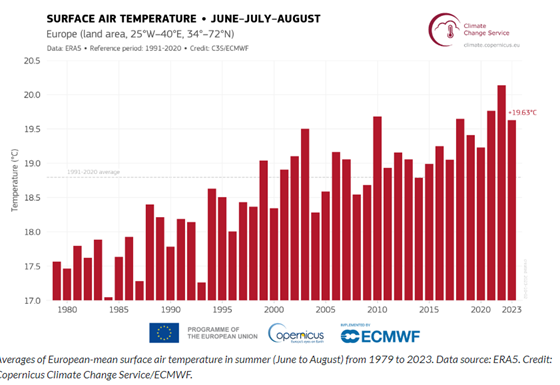

Sumber: https://climate.copernicus.eu/european-summer-2023-season-contrasting-extremes

In [ ]:
def classify_temperature(row):
    temp = row['Temperature']
    season = row['season']

    if season == 2 and temp >= 20:
        return 'Extreme'
    elif season == 1 and temp >= 18:
        return 'Extreme'
    elif season == 0 and temp >= 14:
        return 'Extreme'
    elif season == 3 and temp >= 16:
        return 'Extreme'
    else:
        return 'Not Extreme'

df['temp_category'] = df.apply(classify_temperature, axis=1)

df


,id,date,Iws,Ir,pm2.5,PRES,cbwd,DEWP,Temperature,date_only,time_only,tahun,bulan,hari,jam,menit,Iws_change,Ir_intensity,pres_change,humidity,heat_index,Iws_kmh,wind_chill,season,temp_category
0,0,2016-07-01 00:00:00,5.827,2.009,1.599,0.462,4,1.340,30.531000,2016-07-01,00:00:00,2016,7,1,0,0,0.00,2.01,0.00,15.381799,83.422252,20.977201,33.29,2,Extreme
1,1,2016-07-01 00:15:00,5.760,2.076,1.492,0.426,4,1.401,30.459999,2016-07-01,00:15:00,2016,7,1,0,15,-0.07,4.09,-0.04,15.512270,83.321914,20.736001,33.20,2,Extreme
2,2,2016-07-01 00:30:00,5.760,1.942,1.492,0.391,4,1.310,30.038000,2016-07-01,00:30:00,2016,7,1,0,30,0.00,6.03,-0.03,15.789261,82.721527,20.736001,32.67,2,Extreme
3,3,2016-07-01 00:45:00,5.760,1.942,1.492,0.426,4,1.310,27.013000,2016-07-01,00:45:00,2016,7,1,0,45,0.00,7.97,0.03,18.825751,78.912607,20.736001,28.84,2,Extreme
4,4,2016-07-01 01:00:00,5.693,2.076,1.492,0.426,4,1.371,27.787001,2016-07-01,01:00:00,2016,7,1,1,0,-0.07,10.05,0.00,18.069482,79.796032,20.494799,29.82,2,Extreme
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64315,64315,2018-05-01 22:45:00,12.458,1.407,7.889,0.746,4,1.523,10.622000,2018-05-01,22:45:00,2018,5,1,22,45,0.54,114.57,-0.57,53.325637,48.437864,44.848801,6.57,1,Not Extreme
64316,64316,2018-05-01 23:00:00,14.200,1.541,9.310,0.284,4,1.249,10.482000,2018-05-01,23:00:00,2018,5,1,23,0,1.74,116.11,-0.46,52.777832,48.134919,51.119999,6.10,1,Not Extreme
64317,64317,2018-05-01 23:15:00,12.659,1.474,7.924,0.959,4,1.310,10.271000,2018-05-01,23:15:00,2018,5,1,23,15,-1.54,117.59,0.67,53.761480,47.763369,45.572401,6.06,1,Not Extreme
64318,64318,2018-05-01 23:30:00,13.329,1.541,8.671,0.533,4,1.371,10.341000,2018-05-01,23:30:00,2018,5,1,23,30,0.67,119.13,-0.43,53.745501,47.901218,47.984402,6.04,1,Not Extreme


<Axes: xlabel='temp_category', ylabel='count'>

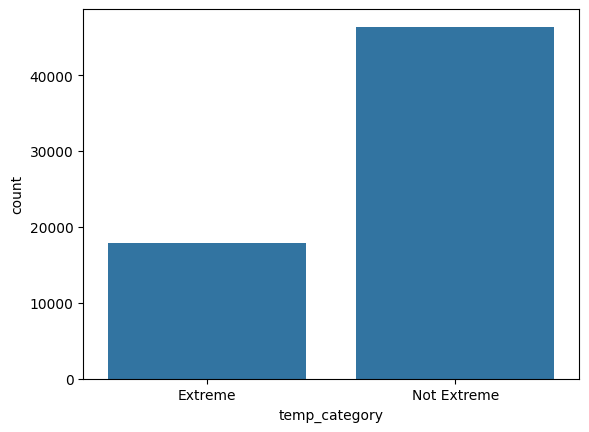

In [ ]:
sns.countplot(x="temp_category",data=df)

In [ ]:
df['temp_category'].value_counts()

temp_category
Not Extreme    46392
Extreme        17928
Name: count, dtype: int64

In [ ]:
df['temp_category'] = df['temp_category'].replace({'Not Extreme': 0, 'Extreme': 1})
df

,id,date,Iws,Ir,pm2.5,PRES,cbwd,DEWP,Temperature,date_only,time_only,tahun,bulan,hari,jam,menit,Iws_change,Ir_intensity,pres_change,humidity,heat_index,Iws_kmh,wind_chill,season,temp_category
0,0,2016-07-01 00:00:00,5.827,2.009,1.599,0.462,4,1.340,30.531000,2016-07-01,00:00:00,2016,7,1,0,0,0.00,2.01,0.00,15.381799,83.422252,20.977201,33.29,2,1
1,1,2016-07-01 00:15:00,5.760,2.076,1.492,0.426,4,1.401,30.459999,2016-07-01,00:15:00,2016,7,1,0,15,-0.07,4.09,-0.04,15.512270,83.321914,20.736001,33.20,2,1
2,2,2016-07-01 00:30:00,5.760,1.942,1.492,0.391,4,1.310,30.038000,2016-07-01,00:30:00,2016,7,1,0,30,0.00,6.03,-0.03,15.789261,82.721527,20.736001,32.67,2,1
3,3,2016-07-01 00:45:00,5.760,1.942,1.492,0.426,4,1.310,27.013000,2016-07-01,00:45:00,2016,7,1,0,45,0.00,7.97,0.03,18.825751,78.912607,20.736001,28.84,2,1
4,4,2016-07-01 01:00:00,5.693,2.076,1.492,0.426,4,1.371,27.787001,2016-07-01,01:00:00,2016,7,1,1,0,-0.07,10.05,0.00,18.069482,79.796032,20.494799,29.82,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64315,64315,2018-05-01 22:45:00,12.458,1.407,7.889,0.746,4,1.523,10.622000,2018-05-01,22:45:00,2018,5,1,22,45,0.54,114.57,-0.57,53.325637,48.437864,44.848801,6.57,1,0
64316,64316,2018-05-01 23:00:00,14.200,1.541,9.310,0.284,4,1.249,10.482000,2018-05-01,23:00:00,2018,5,1,23,0,1.74,116.11,-0.46,52.777832,48.134919,51.119999,6.10,1,0
64317,64317,2018-05-01 23:15:00,12.659,1.474,7.924,0.959,4,1.310,10.271000,2018-05-01,23:15:00,2018,5,1,23,15,-1.54,117.59,0.67,53.761480,47.763369,45.572401,6.06,1,0
64318,64318,2018-05-01 23:30:00,13.329,1.541,8.671,0.533,4,1.371,10.341000,2018-05-01,23:30:00,2018,5,1,23,30,0.67,119.13,-0.43,53.745501,47.901218,47.984402,6.04,1,0


<Axes: >

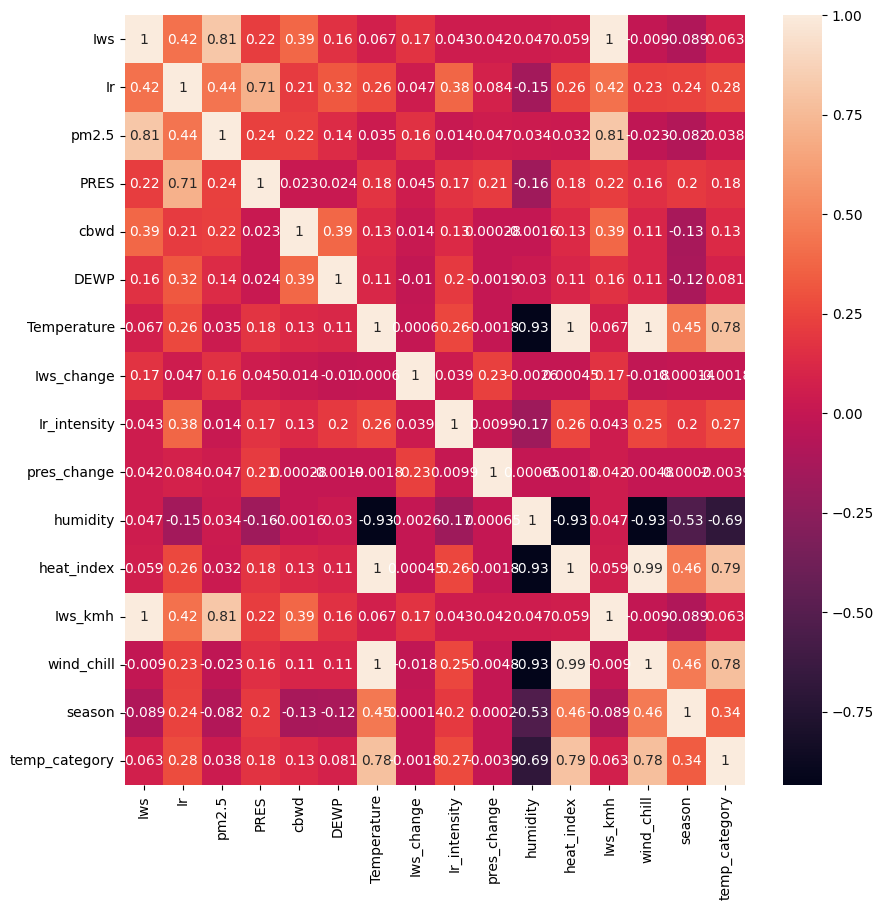

In [ ]:
test = df.drop(columns=['id', 'date', 'date_only', 'time_only', 'tahun', 'bulan', 'hari', 'jam', 'menit'])
plt.figure(figsize=(10, 10))
corr = test.corr()
sns.heatmap(corr, annot=True)

### Merge data into daily

---



In [ ]:
df['date_day'] = df['date'].dt.date

df_daily = df.groupby('date_day').agg({
    'Iws': 'median',
    'Ir': 'median',
    'pm2.5': 'median',
    'PRES': 'median',
    'cbwd': 'median',
    'DEWP': 'median',
    'Temperature': 'mean',
    'Iws_change': lambda x: np.percentile(x, 75),
    'Ir_intensity': lambda x: np.percentile(x, 25),
    'pres_change': lambda x: np.percentile(x, 75),
    'humidity': 'median',
    'heat_index': 'median',
    'Iws_kmh': lambda x: np.percentile(x, 75),
    'wind_chill': 'mean',
    'temp_category': 'max'
}).reset_index()

df_daily

,date_day,Iws,Ir,pm2.5,PRES,cbwd,DEWP,Temperature,Iws_change,Ir_intensity,pres_change,humidity,heat_index,Iws_kmh,wind_chill,temp_category
0,2016-07-01,5.2240,2.6790,2.1320,0.8880,2.0,1.4920,21.025677,0.1300,50.2250,0.0400,29.516010,65.435460,19.831500,21.344375,1
1,2016-07-02,9.4105,4.2870,6.3255,1.9540,2.0,1.7360,22.053792,0.3400,77.3400,0.1400,27.356772,67.966073,37.194299,22.397396,1
2,2016-07-03,10.4490,5.0230,7.1070,2.5590,3.0,1.8880,26.355917,0.2700,121.4650,0.2975,20.449202,78.025505,39.606299,27.858958,1
3,2016-07-04,10.5160,5.4250,6.9825,2.8250,3.0,1.9800,27.369385,0.3400,129.9225,0.2100,18.488833,80.072961,40.751999,29.197604,1
4,2016-07-05,11.0855,5.3580,7.4620,2.7010,3.0,2.0100,30.139260,0.4700,133.5350,0.2500,15.876497,83.950486,42.017399,32.905625,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
665,2018-04-27,10.9850,2.5450,9.7190,1.1020,3.0,1.2790,11.439469,0.9550,65.6325,0.2900,49.462511,49.535586,51.542101,8.128646,0
666,2018-04-28,11.3870,1.8415,9.1150,0.7285,3.0,1.2640,11.125760,0.6175,74.0600,0.2675,51.542372,48.815295,52.567201,7.756458,0
667,2018-04-29,7.6025,1.5410,7.3915,0.5865,3.0,1.2335,12.241115,0.7550,66.3350,0.1800,46.230915,51.650647,51.361200,9.629062,0
668,2018-04-30,9.6115,1.4740,8.6350,1.3860,3.0,1.2180,13.660542,1.2025,78.4325,0.2200,43.512539,53.355751,49.431600,11.287813,0


In [ ]:
sort = df_daily.sort_values(by='Temperature', ascending=False)
sort

,date_day,Iws,Ir,pm2.5,PRES,cbwd,DEWP,Temperature,Iws_change,Ir_intensity,pres_change,humidity,heat_index,Iws_kmh,wind_chill,temp_category
29,2016-07-30,16.979500,2.779500,10.945000,0.533000,5.0,1.477000,41.333281,0.3550,66.4550,0.1800,8.915630,99.853516,65.768400,48.481771,1
24,2016-07-25,13.362500,1.474000,9.150000,1.350000,4.0,1.218000,41.157427,0.4000,100.3000,0.1400,8.821658,99.058496,57.930302,47.652917,1
28,2016-07-29,14.669000,2.880000,10.163000,0.870500,4.0,1.401000,40.621031,0.4700,84.0775,0.2575,9.121297,98.503832,59.859900,47.351667,1
27,2016-07-28,15.974500,2.411000,10.145000,0.497000,5.0,1.447000,40.552135,0.4700,75.6700,0.2100,9.199368,98.275544,64.683900,47.305104,1
23,2016-07-24,14.334000,3.751000,9.363500,1.617000,4.0,1.371000,40.542584,0.6000,117.8700,0.2500,9.116992,98.469992,61.548299,47.160313,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
574,2018-01-26,12.391000,2.344000,8.546000,0.959000,3.0,0.640000,-0.667130,0.4175,53.0600,0.2100,110.446152,28.768035,49.793401,-8.669479,0
158,2016-12-06,1.268214,0.394017,3.002918,0.353201,2.0,0.939588,-1.031443,-0.0100,8.7475,0.0000,118.440296,27.727713,5.390501,-2.491667,0
575,2018-01-27,14.367500,2.679000,10.038500,1.244000,4.0,0.609000,-1.568146,0.3300,63.1400,0.2200,113.903041,28.026098,55.216801,-10.231354,0
552,2018-01-04,11.922000,2.712500,8.671000,1.315000,3.0,0.701000,-2.159269,0.4700,79.4700,0.2975,124.376930,26.353863,45.934199,-10.529792,0


#### Categorize Temperature

---



In [ ]:
df_daily['temp_category'].value_counts()

temp_category
0    378
1    292
Name: count, dtype: int64

<Axes: xlabel='temp_category', ylabel='count'>

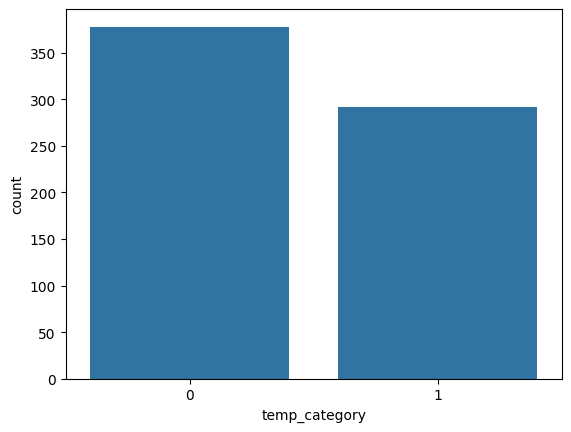

In [ ]:
sns.countplot(x="temp_category",data=df_daily)

In [ ]:
exhot_temp = df_daily[(df_daily['temp_category'] == 1)]
exhot_temp.describe()

,Iws,Ir,pm2.5,PRES,cbwd,DEWP,Temperature,Iws_change,Ir_intensity,pres_change,humidity,heat_index,Iws_kmh,wind_chill,temp_category
count,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.0
mean,9.271750,2.683343,6.790299,1.753117,2.527397,0.808767,21.141644,0.549538,78.959495,0.241558,28.403838,67.278869,42.556044,21.229826,1.0
std,2.436979,1.516819,1.974287,0.891940,1.172100,0.688806,7.189422,0.184949,45.300667,0.073289,10.765176,12.394838,10.107968,9.437985,0.0
min,2.194451,0.322170,2.132000,0.182170,1.000000,-1.036000,8.028323,-0.010000,7.102500,0.000000,8.821658,40.027053,19.831500,3.811042,1.0
25%,7.636000,1.373500,5.538625,1.004125,2.000000,0.757250,16.251115,0.413125,39.833125,0.210000,21.909871,58.872022,35.475750,14.891979,1.0
50%,8.740500,2.427750,6.396250,1.617000,2.000000,1.005000,19.546583,0.540000,74.210000,0.250000,27.708078,64.521343,41.023350,19.175469,1.0
75%,10.222875,3.792875,8.035375,2.394250,3.000000,1.191750,24.185818,0.670000,117.122500,0.282500,34.781270,73.267420,48.587400,25.020911,1.0
max,21.367001,7.066500,16.346001,4.815000,8.000000,2.010000,41.333281,1.140000,185.520000,0.430000,70.598070,99.853516,76.921202,48.481771,1.0


In [ ]:
df_daily['date_day'] = pd.to_datetime(df_daily['date_day']).dt.date
df_daily['tahun'] = pd.to_datetime(df_daily['date_day']).dt.year
df_daily['bulan'] = pd.to_datetime(df_daily['date_day']).dt.month
df_daily['hari'] = pd.to_datetime(df_daily['date_day']).dt.day
df_daily.drop('date_day', axis=1, inplace=True)

df_daily

,Iws,Ir,pm2.5,PRES,cbwd,DEWP,Temperature,Iws_change,Ir_intensity,pres_change,humidity,heat_index,Iws_kmh,wind_chill,temp_category,tahun,bulan,hari
0,5.2240,2.6790,2.1320,0.8880,2.0,1.4920,21.025677,0.1300,50.2250,0.0400,29.516010,65.435460,19.831500,21.344375,1,2016,7,1
1,9.4105,4.2870,6.3255,1.9540,2.0,1.7360,22.053792,0.3400,77.3400,0.1400,27.356772,67.966073,37.194299,22.397396,1,2016,7,2
2,10.4490,5.0230,7.1070,2.5590,3.0,1.8880,26.355917,0.2700,121.4650,0.2975,20.449202,78.025505,39.606299,27.858958,1,2016,7,3
3,10.5160,5.4250,6.9825,2.8250,3.0,1.9800,27.369385,0.3400,129.9225,0.2100,18.488833,80.072961,40.751999,29.197604,1,2016,7,4
4,11.0855,5.3580,7.4620,2.7010,3.0,2.0100,30.139260,0.4700,133.5350,0.2500,15.876497,83.950486,42.017399,32.905625,1,2016,7,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
665,10.9850,2.5450,9.7190,1.1020,3.0,1.2790,11.439469,0.9550,65.6325,0.2900,49.462511,49.535586,51.542101,8.128646,0,2018,4,27
666,11.3870,1.8415,9.1150,0.7285,3.0,1.2640,11.125760,0.6175,74.0600,0.2675,51.542372,48.815295,52.567201,7.756458,0,2018,4,28
667,7.6025,1.5410,7.3915,0.5865,3.0,1.2335,12.241115,0.7550,66.3350,0.1800,46.230915,51.650647,51.361200,9.629062,0,2018,4,29
668,9.6115,1.4740,8.6350,1.3860,3.0,1.2180,13.660542,1.2025,78.4325,0.2200,43.512539,53.355751,49.431600,11.287813,0,2018,4,30


In [ ]:
df_daily['temp_category'] = df_daily['temp_category'].replace({'Not Extreme': 0, 'Extreme': 1})
df_daily

,Iws,Ir,pm2.5,PRES,cbwd,DEWP,Temperature,Iws_change,Ir_intensity,pres_change,humidity,heat_index,Iws_kmh,wind_chill,temp_category,tahun,bulan,hari
0,5.2240,2.6790,2.1320,0.8880,2.0,1.4920,21.025677,0.1300,50.2250,0.0400,29.516010,65.435460,19.831500,21.344375,1,2016,7,1
1,9.4105,4.2870,6.3255,1.9540,2.0,1.7360,22.053792,0.3400,77.3400,0.1400,27.356772,67.966073,37.194299,22.397396,1,2016,7,2
2,10.4490,5.0230,7.1070,2.5590,3.0,1.8880,26.355917,0.2700,121.4650,0.2975,20.449202,78.025505,39.606299,27.858958,1,2016,7,3
3,10.5160,5.4250,6.9825,2.8250,3.0,1.9800,27.369385,0.3400,129.9225,0.2100,18.488833,80.072961,40.751999,29.197604,1,2016,7,4
4,11.0855,5.3580,7.4620,2.7010,3.0,2.0100,30.139260,0.4700,133.5350,0.2500,15.876497,83.950486,42.017399,32.905625,1,2016,7,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
665,10.9850,2.5450,9.7190,1.1020,3.0,1.2790,11.439469,0.9550,65.6325,0.2900,49.462511,49.535586,51.542101,8.128646,0,2018,4,27
666,11.3870,1.8415,9.1150,0.7285,3.0,1.2640,11.125760,0.6175,74.0600,0.2675,51.542372,48.815295,52.567201,7.756458,0,2018,4,28
667,7.6025,1.5410,7.3915,0.5865,3.0,1.2335,12.241115,0.7550,66.3350,0.1800,46.230915,51.650647,51.361200,9.629062,0,2018,4,29
668,9.6115,1.4740,8.6350,1.3860,3.0,1.2180,13.660542,1.2025,78.4325,0.2200,43.512539,53.355751,49.431600,11.287813,0,2018,4,30


#### Categorize Season

---



In [ ]:
def categorize_season(month):
    if month in [12, 1, 2]:
        return 0 # Winter
    elif month in [3, 4, 5]:
        return 1 #Spring
    elif month in [6, 7, 8]:
        return 2 #Summer
    else:
        return 3 #Autumn

df_daily['season'] = df_daily['bulan'].apply(categorize_season)
df_daily

,Iws,Ir,pm2.5,PRES,cbwd,DEWP,Temperature,Iws_change,Ir_intensity,pres_change,humidity,heat_index,Iws_kmh,wind_chill,temp_category,tahun,bulan,hari,season
0,5.2240,2.6790,2.1320,0.8880,2.0,1.4920,21.025677,0.1300,50.2250,0.0400,29.516010,65.435460,19.831500,21.344375,1,2016,7,1,2
1,9.4105,4.2870,6.3255,1.9540,2.0,1.7360,22.053792,0.3400,77.3400,0.1400,27.356772,67.966073,37.194299,22.397396,1,2016,7,2,2
2,10.4490,5.0230,7.1070,2.5590,3.0,1.8880,26.355917,0.2700,121.4650,0.2975,20.449202,78.025505,39.606299,27.858958,1,2016,7,3,2
3,10.5160,5.4250,6.9825,2.8250,3.0,1.9800,27.369385,0.3400,129.9225,0.2100,18.488833,80.072961,40.751999,29.197604,1,2016,7,4,2
4,11.0855,5.3580,7.4620,2.7010,3.0,2.0100,30.139260,0.4700,133.5350,0.2500,15.876497,83.950486,42.017399,32.905625,1,2016,7,5,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
665,10.9850,2.5450,9.7190,1.1020,3.0,1.2790,11.439469,0.9550,65.6325,0.2900,49.462511,49.535586,51.542101,8.128646,0,2018,4,27,1
666,11.3870,1.8415,9.1150,0.7285,3.0,1.2640,11.125760,0.6175,74.0600,0.2675,51.542372,48.815295,52.567201,7.756458,0,2018,4,28,1
667,7.6025,1.5410,7.3915,0.5865,3.0,1.2335,12.241115,0.7550,66.3350,0.1800,46.230915,51.650647,51.361200,9.629062,0,2018,4,29,1
668,9.6115,1.4740,8.6350,1.3860,3.0,1.2180,13.660542,1.2025,78.4325,0.2200,43.512539,53.355751,49.431600,11.287813,0,2018,4,30,1


In [ ]:
df_daily.isna().sum()

Iws              0
Ir               0
pm2.5            0
PRES             0
cbwd             0
DEWP             0
Temperature      0
Iws_change       0
Ir_intensity     0
pres_change      0
humidity         0
heat_index       0
Iws_kmh          0
wind_chill       0
temp_category    0
tahun            0
bulan            0
hari             0
season           0
dtype: int64

<Axes: >

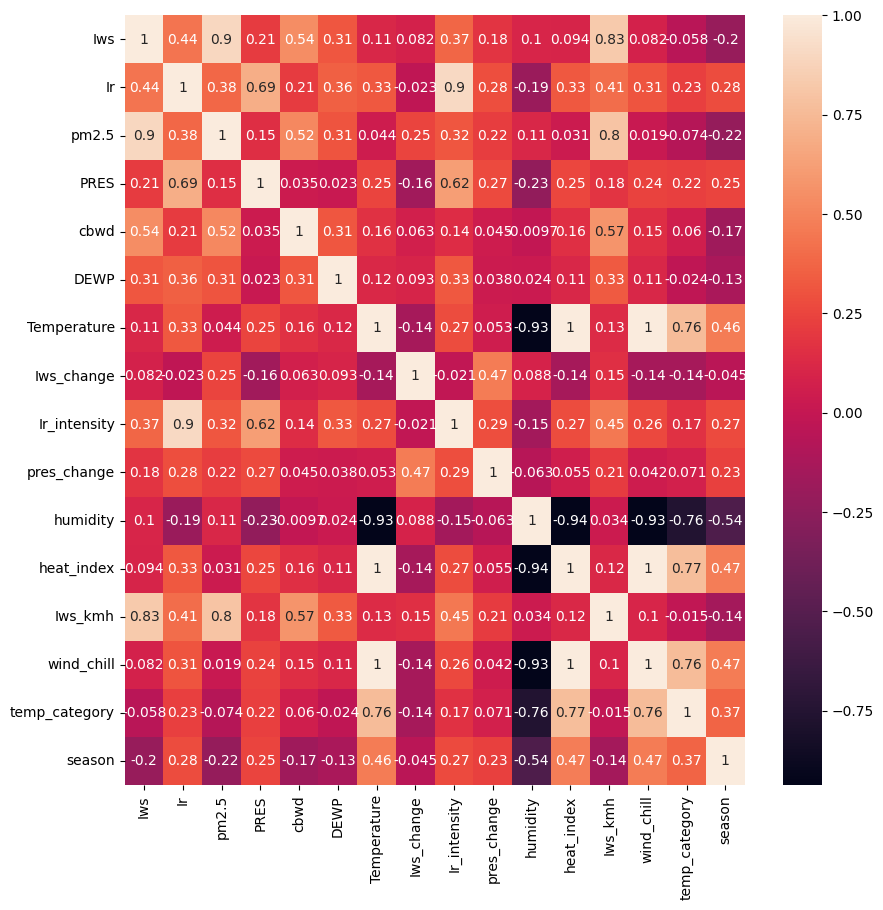

In [ ]:
test1 = df_daily.drop(columns=['tahun', 'bulan', 'hari'])
plt.figure(figsize=(10, 10))
corr = test1.corr()
sns.heatmap(corr, annot=True)

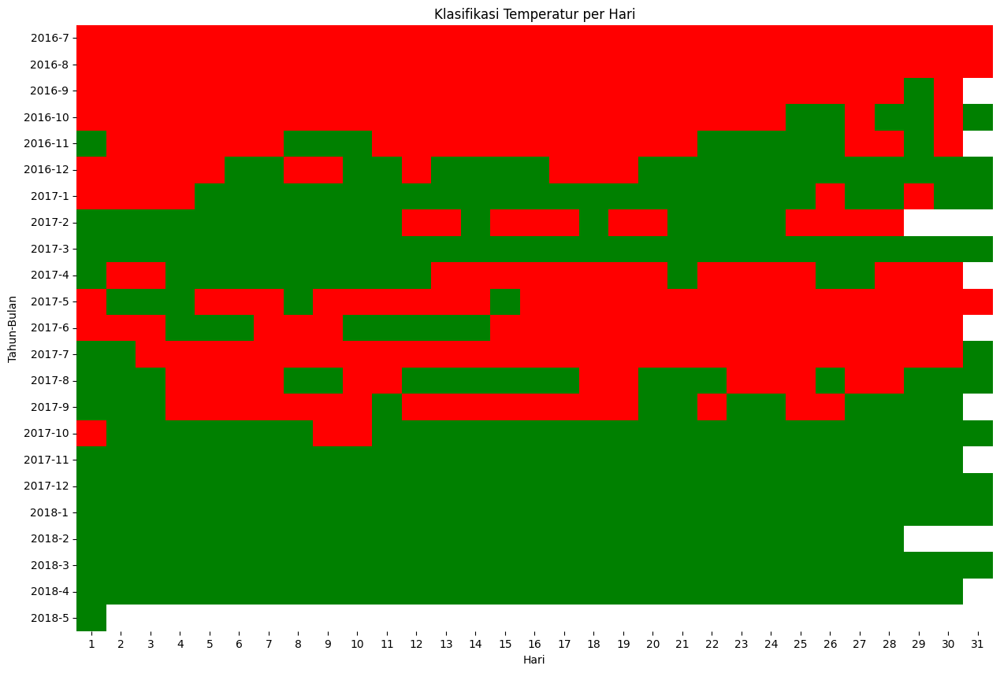

In [ ]:
color_map_numeric = {'Not Extreme': 0, 'Extreme': 1}
pivot_data = df_daily.pivot_table(index=['tahun', 'bulan'], columns='hari', values='temp_category', aggfunc='first')
pivot_data_numeric = pivot_data.replace(color_map_numeric)

plt.figure(figsize=(15, 10))
sns.heatmap(pivot_data_numeric, cmap=['green', 'red'], cbar=False)
plt.xlabel('Hari')
plt.ylabel('Tahun-Bulan')
plt.title('Klasifikasi Temperatur per Hari')
plt.show()

In [ ]:
data_cleaned = df_daily.copy()
anova = df_daily.copy()

## B. Feature Selection

### Seaborn Displot

---



Iws	Ir	pm2.5	PRES	cbwd	DEWP	Temperature	Iws_change	Ir_intensity	pres_change	Iws_kmh	wind_chill	temp_category	tahun	bulan	hari	mingguan	season

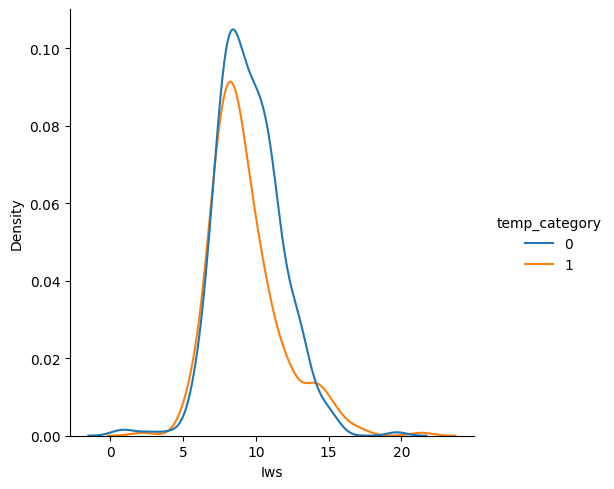

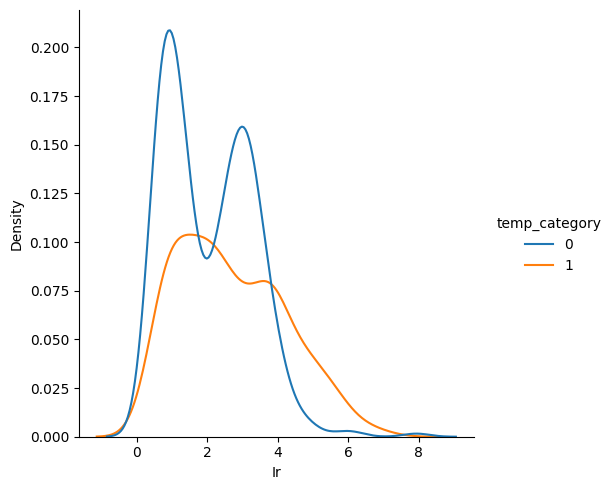

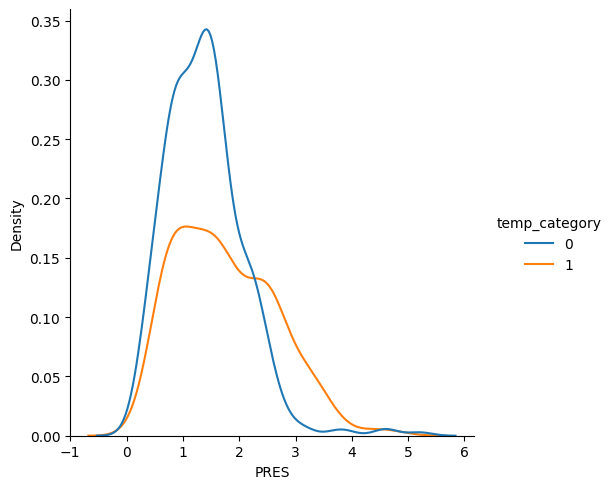

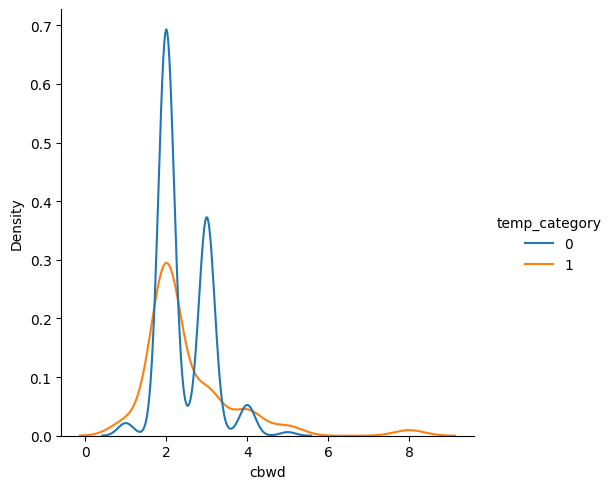

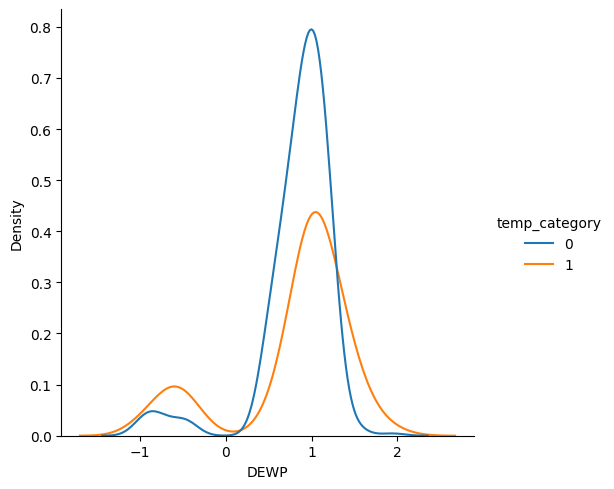

...

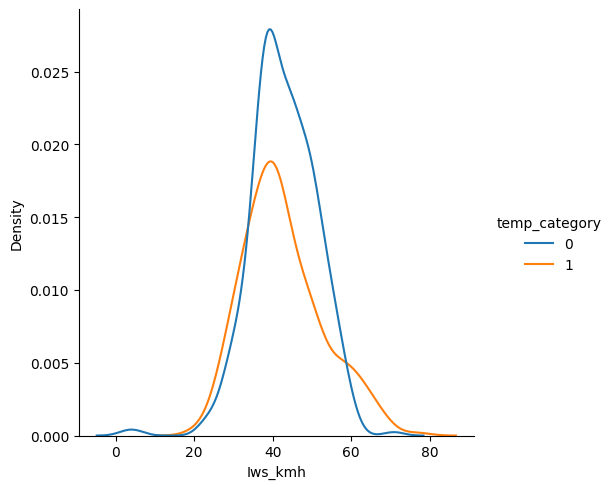

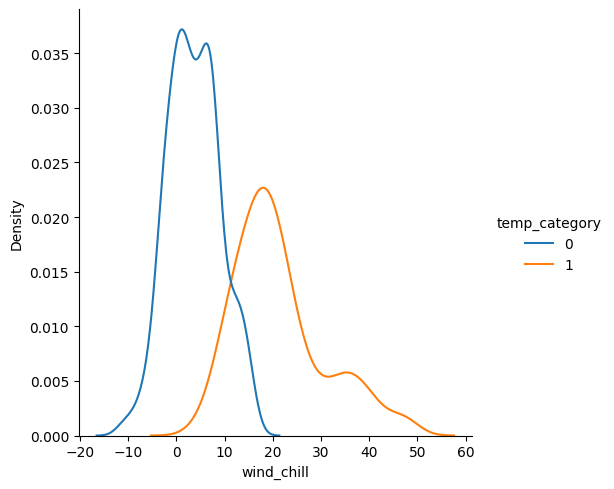

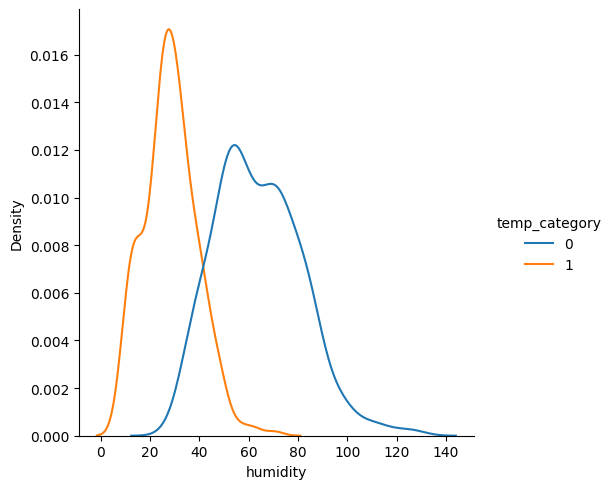

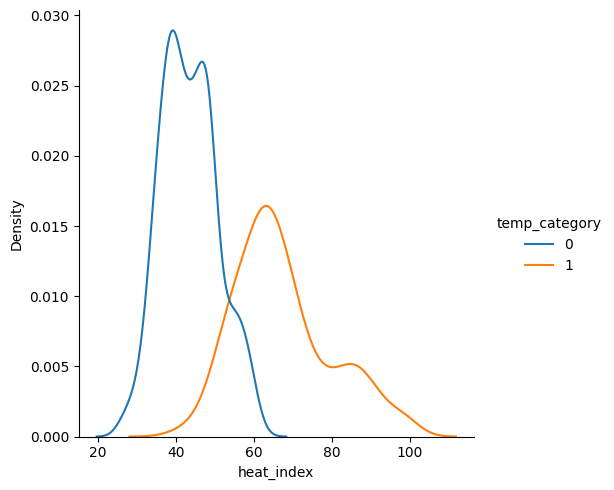

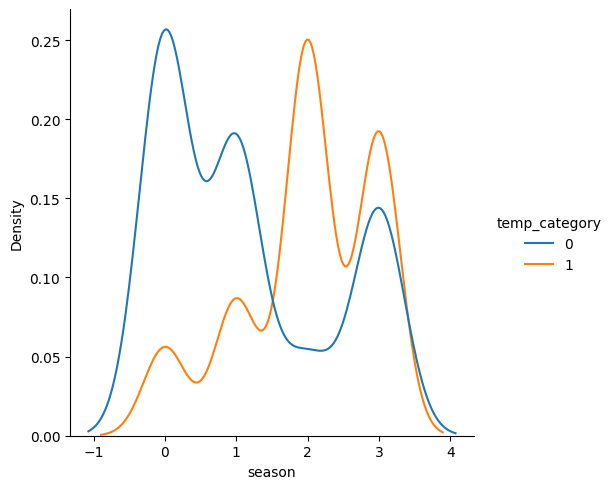

In [ ]:
import seaborn as sns
sns.displot(df_daily, x= "Iws", hue="temp_category", kind="kde")
sns.displot(df_daily, x= "Ir", hue="temp_category", kind="kde")
sns.displot(df_daily, x= "PRES", hue="temp_category", kind="kde")
sns.displot(df_daily, x= "cbwd", hue="temp_category", kind="kde")
sns.displot(df_daily, x= "DEWP", hue="temp_category", kind="kde")
sns.displot(df_daily, x= "Iws_change", hue="temp_category", kind="kde")
sns.displot(df_daily, x= "Ir_intensity", hue="temp_category", kind="kde")
sns.displot(df_daily, x= "humidity", hue="temp_category", kind="kde")
sns.displot(df_daily, x= "heat_index", hue="temp_category", kind="kde")
sns.displot(df_daily, x= "Iws_kmh", hue="temp_category", kind="kde")
sns.displot(df_daily, x= "wind_chill", hue="temp_category", kind="kde")
sns.displot(df_daily, x= "humidity", hue="temp_category", kind="kde")
sns.displot(df_daily, x= "heat_index", hue="temp_category", kind="kde")
sns.displot(df_daily, x= "season", hue="temp_category", kind="kde")

In [ ]:
df_daily["season"].unique()

array([2, 3, 0, 1])

### WoE Assessment

---





In [ ]:
df_daily_asli = df_daily

#### 1. pm2.5 WoE

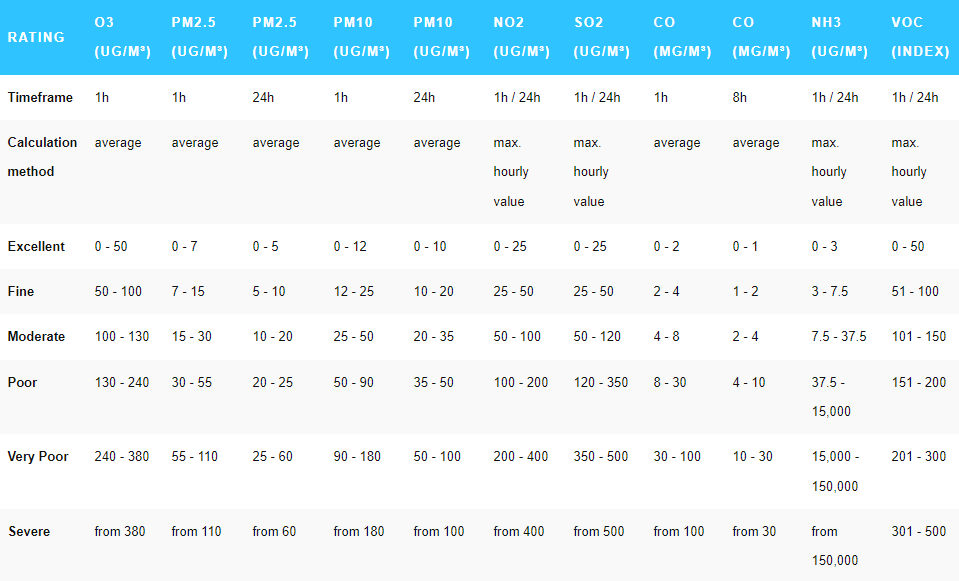

Sumber : https://www.breeze-technologies.de/blog/what-is-an-air-quality-index-how-is-it-calculated/

- 0 : (Excellent: <5)
- 1 : (Fine: 5 - 10)
- 2 : (Moderate 10 - 20)

In [ ]:
def categorize_pm25(value):
    if value < 5:
        return 0  # Excellent
    elif 5 <= value < 10:
        return 1  # Fine
    elif 10 <= value < 20:
        return 2  # Moderate
    else:
        return 3

df_daily['pm2.5'] = df_daily['pm2.5'].apply(categorize_pm25)

In [ ]:
a = pd.crosstab(df_daily['pm2.5'], df_daily['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return ln(df["%nonevent"]/df["%event"])

In [ ]:
a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
pm2.5,,,,,,,
0,54,46,100,0.142857,0.157534,-0.097798,0.001435
1,294,224,518,0.777778,0.767123,0.013793,0.000147
2,30,22,52,0.079365,0.075342,0.052015,0.000209
Total,378,292,670,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.0017915828119688792

In [ ]:
IV = pd.DataFrame()
IV['pm2.5'] = [a["IV"].sum()]

#### 2. Ir WoE

Sumber: https://www.drought.gov/data-maps-tools/global-gridded-standardized-precipitation-index-spi-cmorph-daily

- 0 : -0.7 to -0.5 kering tidak normal)
- 1 : -1.2 to -0.8 (kekeringan sedang)
- 2 : -1.5 to -1.3 (kekeringan parah)
- 3 : -1.9 to -1.6 (kekeringan ekstrem)
- 4 : <=-2 (kekeringan luar biasa)
- 5 : 0.5 to 0.7 (basah tidak normal)
- 6 : 8 to 1.2 (basah sedang)
- 7 : 1.3 to 1.5 (basah parah)
- 8 : 1.6 to 1.9 (basah ekstrem)
- 9  : >= 2 (basah luar biasa)


In [ ]:
def categorize_Ir(value):
    if -0.7 <= value <= -0.5:
        return 0  # Kering tidak normal
    elif -1.2 <= value < -0.8:
        return 1  # Kekeringan sedang
    elif -1.5 <= value <= -1.3:
        return 2  # Kekeringan parah
    elif -1.9 <= value <= -1.6:
        return 3  # Kekeringan ekstrem
    elif value <= -2:
        return 4  # Kekeringan luar biasa
    elif 0.5 <= value <= 0.7:
        return 5  # Basah tidak normal
    elif 1.2 <= value < 1.3:
        return 6  # Basah sedang
    elif 1.3 <= value <= 1.5:
        return 7  # Basah parah
    elif 1.6 <= value <= 1.9:
        return 8  # Basah ekstrem
    elif value >= 2:
        return 9  # Basah luar biasa
    else:
        return 10


df_daily['Ir'] = df_daily['Ir'].apply(categorize_Ir)


In [ ]:
a = pd.crosstab(df_daily['Ir'], df_daily['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return ln(df["%nonevent"]/df["%event"])

In [ ]:
a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
Ir,,,,,,,
5,40,12,52,0.105820,0.041096,0.945832,0.061218
6,18,7,25,0.047619,0.023973,0.686321,0.016229
7,19,14,33,0.050265,0.047945,0.047241,0.000110
8,16,23,39,0.042328,0.078767,-0.621046,0.022630
9,187,180,367,0.494709,0.616438,-0.219989,0.026779
10,98,56,154,0.259259,0.191781,0.301475,0.020343
Total,378,292,670,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.14730939128187762

In [ ]:
IV['Ir'] = [a["IV"].sum()]

#### 3. Iws WoE

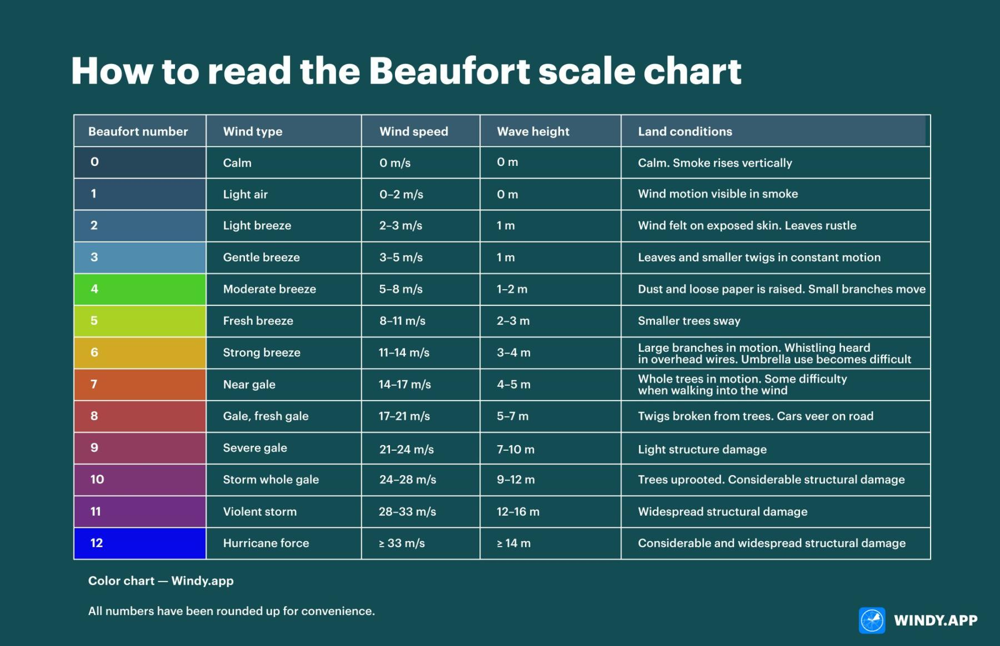

- 0 : (Good: <6)
- 1 : (Bad: 6 - 9)
- 2 : (very Bad 10 - 20)

In [ ]:
def categorize_Iws(value):
    if value < 6:
        return 0  # Good
    elif 6 <= value < 9:
        return 1  # Bad
    else:
        return 2 #very bad

df_daily['Iws'] = df_daily['Iws'].apply(categorize_Iws)

In [ ]:
a = pd.crosstab(df_daily['Iws'], df_daily['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return ln(df["%nonevent"]/df["%event"])

In [ ]:
a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
Iws,,,,,,,
0,10,11,21,0.026455,0.037671,-0.353451,0.003964
1,161,153,314,0.425926,0.523973,-0.207174,0.020313
2,207,128,335,0.547619,0.438356,0.222548,0.024316
Total,378,292,670,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.048593342882099405

In [ ]:
IV['Iws'] = [a["IV"].sum()]

#### 4. Iws_change WoE

In [ ]:
def categorize_Iws_change(value):
    if value < 6:
        return 0  # Good
    elif 6 <= value < 9:
        return 1  # Bad
    else:
        return 2 #very bad

df_daily['Iws_change'] = df_daily['Iws_change'].apply(categorize_Iws_change)

In [ ]:
a = pd.crosstab(df_daily['Iws'], df_daily['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return ln(df["%nonevent"]/df["%event"])

In [ ]:
a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
Iws,,,,,,,
0,10,11,21,0.026455,0.037671,-0.353451,0.003964
1,161,153,314,0.425926,0.523973,-0.207174,0.020313
2,207,128,335,0.547619,0.438356,0.222548,0.024316
Total,378,292,670,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.048593342882099405

In [ ]:
IV['Iws_change'] = [a["IV"].sum()]

#### 5. Humidity WoE

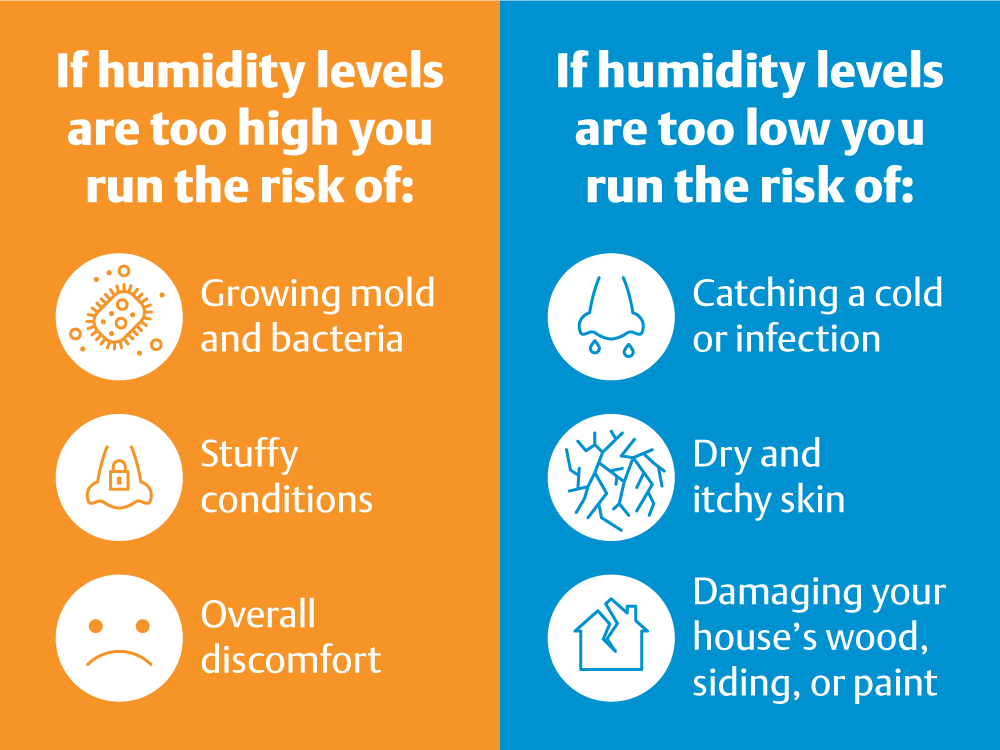

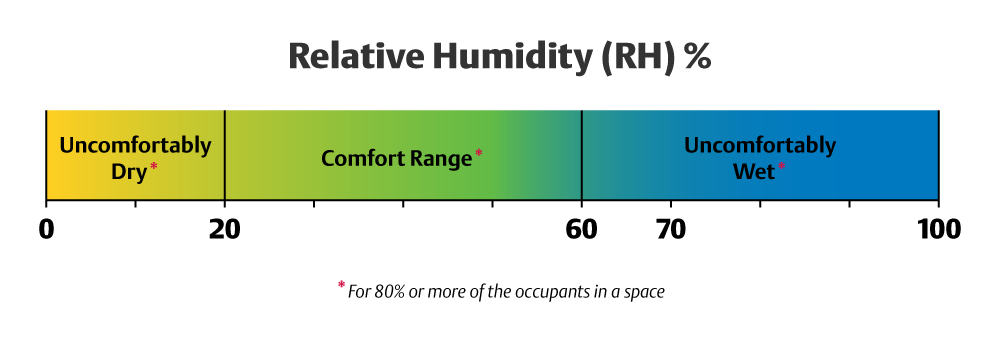

In [ ]:
def categorize_windChill(value):
    if 20 <= value <= 60:
        return 0  # Comfort Range
    else:
        return 1  # Uncomfort Range
df_daily['humidity'] = df_daily['humidity'].apply(categorize_windChill)

In [ ]:
a = pd.crosstab(df_daily['humidity'], df_daily['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return ln(df["%nonevent"]/df["%event"])

In [ ]:
a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
humidity,,,,,,,
0,173,226,399,0.457672,0.773973,-0.525384,0.166179
1,205,66,271,0.542328,0.226027,0.875215,0.276831
Total,378,292,670,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.4430102539097369

In [ ]:
IV['humidity'] = [a["IV"].sum()]

#### 6. Heat Index WoE

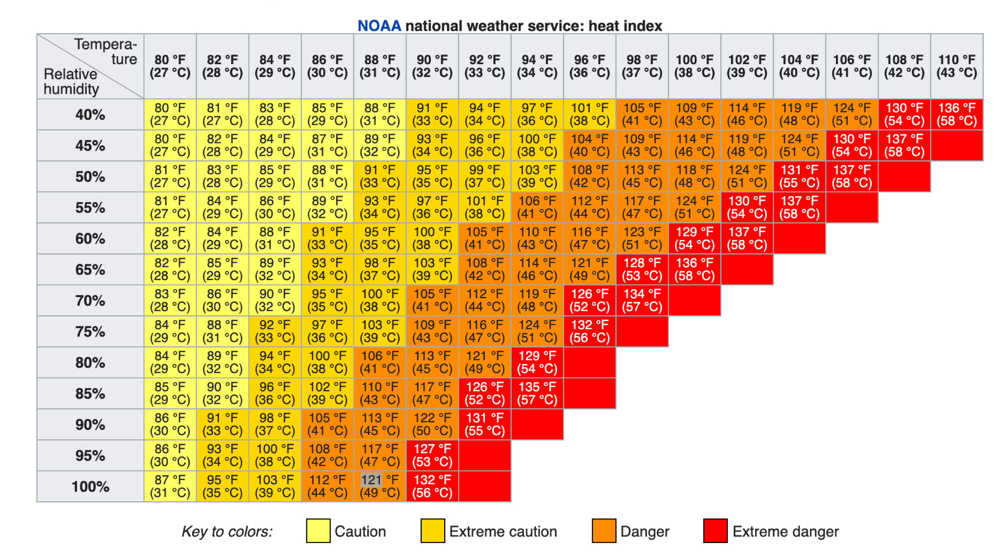

In [ ]:
def categorize_heat_index(value):
    if value < 27:
      return 0  # No Impact
    elif value < 33:
      return 1  # Caution
    elif value < 40:
      return 2  # Extreme Caution
    elif value < 52:
      return 3  # Danger
    else:
      return 4  # Extreme Danger
df_daily['heat_index'] = df_daily['heat_index'].apply(categorize_heat_index)

In [ ]:
a = pd.crosstab(df_daily['heat_index'], df_daily['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return ln(df["%nonevent"]/df["%event"])

In [ ]:
a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

def WoE_calc(nonevent, event):
    WoE = np.log(nonevent/event)
    if np.isinf(WoE):
      return 0
    else:
      return WoE
a["WoE"] = a.apply(lambda row: WoE_calc(row['%nonevent'], row['%event']), axis=1)

def IV_calc(nonevent, event, WoE):
    IV = (nonevent - event)*WoE
    if np.isinf(IV):
      return 0
    else:
      return IV
a["IV"] = a.apply(lambda row: IV_calc(row['%nonevent'], row['%event'], row['WoE']), axis=1)

a

<ipython-input-80-e8cfa4b9a8ad>:5: RuntimeWarning: divide by zero encountered in scalar divide
  WoE = np.log(nonevent/event)


temp_category,0,1,Total,%nonevent,%event,WoE,IV
heat_index,,,,,,,
0,2,0,2,0.005291,0.000000,0.000000,0.000000
1,17,0,17,0.044974,0.000000,0.000000,0.000000
2,126,0,126,0.333333,0.000000,0.000000,0.000000
3,187,21,208,0.494709,0.071918,1.928446,0.815330
4,46,271,317,0.121693,0.928082,-2.031618,1.638274
Total,378,292,670,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

2.4536042846736565

In [ ]:
IV['heat_index'] = [a["IV"].sum()]

#### 7. Wind Chill WoE

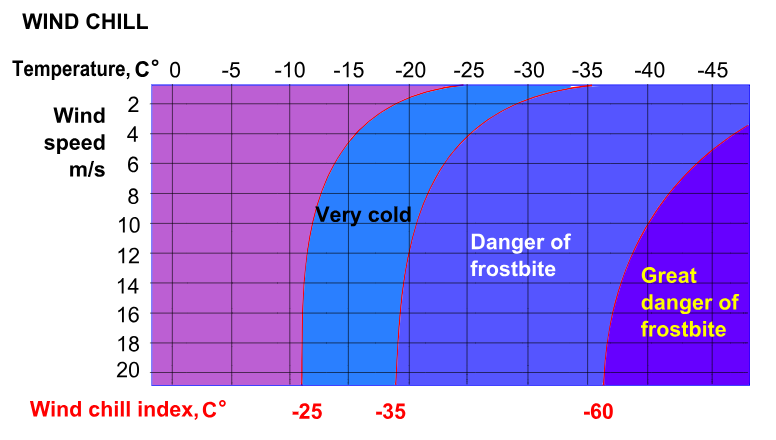

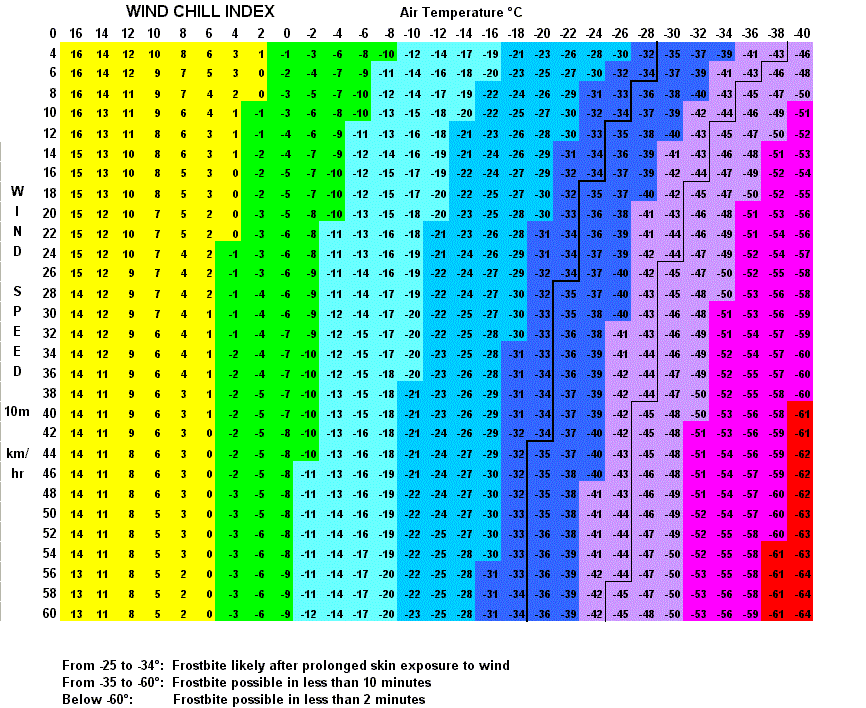

- 0 : >0 (not chill)
- 1 : <0 (chill)

def categorize_windChill(value):
    if value > 40:
        return 0
    elif 30 <= value < 39:
        return 1
    elif 20 <= value < 29:
        return 2
    else:
        return 3
df_daily['wind_chill'] = df_daily['wind_chill'].apply(categorize_windChill)

In [ ]:
def categorize_windChill(value):
    if value > 16:
        return 0
    elif value <= 16:
        return 1
    elif value < 0:
        return 2
    elif value < -10:
        return 3
    elif value < -18:
        return 4
    elif value < -30:
        return 5
    elif value < -40:
        return 6
    elif value < -50:
        return 7
    elif value < -60:
        return 8
    else:
        return 9

df_daily['wind_chill'] = df_daily['wind_chill'].apply(categorize_windChill)

In [ ]:
a = pd.crosstab(df_daily['wind_chill'], df_daily['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return ln(df["%nonevent"]/df["%event"])

In [ ]:
a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

def WoE_calc(nonevent, event):
    WoE = np.log(nonevent/event)
    if np.isinf(WoE):
      return 0
    else:
      return WoE
a["WoE"] = a.apply(lambda row: WoE_calc(row['%nonevent'], row['%event']), axis=1)

def IV_calc(nonevent, event, WoE):
    IV = (nonevent - event)*WoE
    if np.isinf(IV):
      return 0
    else:
      return IV
a["IV"] = a.apply(lambda row: IV_calc(row['%nonevent'], row['%event'], row['WoE']), axis=1)

# a["WoE"] = np.log(a["%nonevent"]/a["%event"])
# a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
wind_chill,,,,,,,
0,1,205,206,0.002646,0.702055,-5.581150,3.903508
1,377,87,464,0.997354,0.297945,1.208197,0.845024
Total,378,292,670,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

4.748532411087934

In [ ]:
IV['wind_chill'] = [a["IV"].sum()]

#### 8. Ir_Intensity WoE

*   0 Moderate rain: 10.0-24.9
*   1 Heavy rain: 25.0-49.9
*   2 Rainstorm: 50.0-99.9
*   3 Heavy rainstorm: 100.0-249.9

http://ikcest-drr.osgeo.cn/tutorial/19472

In [ ]:
def categorize_Ir_intensity(value):
    if value < 24.9:
        return 0  # Moderate rain
    elif 25.0 <= value < 49.9:
        return 1  # Heavy rain
    elif 50.0 <= value < 99.9:
        return 2  # Rainstorm
    else:
        return 3  # Heavy rainstorm

df_daily['Ir_intensity'] = df_daily['Ir_intensity'].apply(categorize_Ir_intensity)

In [ ]:
a = pd.crosstab(df_daily['Ir_intensity'], df_daily['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return ln(df["%nonevent"]/df["%event"])

In [ ]:
a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
Ir_intensity,,,,,,,
0,71,38,109,0.187831,0.130137,0.366953,0.021171
1,94,57,151,0.248677,0.195205,0.242103,0.012946
2,129,98,227,0.341270,0.335616,0.016705,0.000094
3,84,99,183,0.222222,0.339041,-0.422443,0.049349
Total,378,292,670,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.08356038261071688

In [ ]:
IV['Ir_intensity'] = [a["IV"].sum()]

#### 9. Iws_kmh WoE

*   0 Fresh breeze: < 21 km/h
*   1 Strong breeze: 22-27 km/h
*   2 Near gale: 28-33 km/h
*   3 Gale: 34-40 km/h
*   4 Strong gale: 41-47 km/h
*   5 Storm: 48-55 km/h
*   6 Violent storm: 56-63 km/h
*   7 Hurricane: > 64 km/h

https://www.canada.ca/en/environment-climate-change/services/weather-manuals-documentation/manobs-surface-observations.html#toc6

In [ ]:
def categorize_Iws_kmh(value):
    if value < 21:
        return 0  # Fresh breeze
    elif 22 <= value <= 27:
        return 1  # Strong breeze
    elif 28 <= value <= 33:
        return 2  # Near gale
    elif 34 <= value <= 40:
        return 3  # Gale
    elif 41 <= value <= 47:
        return 4  # Strong gale
    elif 48 <= value <= 55:
        return 5  # Storm
    elif 56 <= value <= 63:
        return 6  # Violent Storm
    else:
        return 7  # Hurricane

df_daily['Iws_kmh'] = df_daily['Iws_kmh'].apply(categorize_Iws_kmh)

In [ ]:
a = pd.crosstab(df_daily['Iws_kmh'], df_daily['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return np.log(df["%nonevent"]/df["%event"])

In [ ]:
a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
Iws_kmh,,,,,,,
0,2,1,3,0.005291,0.003425,0.435007,0.000812
1,6,6,12,0.015873,0.020548,-0.258140,0.001207
2,23,29,52,0.060847,0.099315,-0.489942,0.018847
3,104,75,179,0.275132,0.256849,0.068762,0.001257
4,94,60,154,0.248677,0.205479,0.190810,0.008243
5,81,38,119,0.214286,0.130137,0.498723,0.041967
6,15,24,39,0.039683,0.082192,-0.728144,0.030953
7,53,59,112,0.140212,0.202055,-0.365386,0.022597
Total,378,292,670,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.1258820844993092

In [ ]:
IV['Iws_kmh'] = [a["IV"].sum()]

#### 10. Season WoE

In [ ]:
a = pd.crosstab(df_daily['season'], df_daily['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return np.log(df["%nonevent"]/df["%event"])

In [ ]:
a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

def WoE_calc(nonevent, event):
    WoE = np.log(nonevent/event)
    if np.isinf(WoE):
      return 0
    else:
      return WoE
a["WoE"] = a.apply(lambda row: WoE_calc(row['%nonevent'], row['%event']), axis=1)

def IV_calc(nonevent, event, WoE):
    IV = (nonevent - event)*WoE
    if np.isinf(IV):
      return 0
    else:
      return IV
a["IV"] = a.apply(lambda row: IV_calc(row['%nonevent'], row['%event'], row['WoE']), axis=1)

# a["WoE"] = np.log(a["%nonevent"]/a["%event"])
# a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
season,,,,,,,
0,152,28,180,0.402116,0.095890,1.433536,0.438986
1,111,43,154,0.293651,0.147260,0.690190,0.101037
2,29,125,154,0.076720,0.428082,-1.719158,0.604048
3,86,96,182,0.227513,0.328767,-0.368141,0.037276
Total,378,292,670,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

1.1813467888902307

In [ ]:
IV['season'] = [a["IV"].sum()]

#### 11. Bulan WoE

In [ ]:
a = pd.crosstab(df_daily['bulan'], df_daily['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return np.log(df["%nonevent"]/df["%event"])

In [ ]:
a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

def WoE_calc(nonevent, event):
    WoE = np.log(nonevent/event)
    if np.isinf(WoE):
      return 0
    else:
      return WoE
a["WoE"] = a.apply(lambda row: WoE_calc(row['%nonevent'], row['%event']), axis=1)

def IV_calc(nonevent, event, WoE):
    IV = (nonevent - event)*WoE
    if np.isinf(IV):
      return 0
    else:
      return IV
a["IV"] = a.apply(lambda row: IV_calc(row['%nonevent'], row['%event'], row['WoE']), axis=1)

# a["WoE"] = np.log(a["%nonevent"]/a["%event"])
# a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

<ipython-input-103-96ac35af38ba>:5: RuntimeWarning: divide by zero encountered in scalar divide
  WoE = np.log(nonevent/event)


temp_category,0,1,Total,%nonevent,%event,WoE,IV
bulan,,,,,,,
1,56,6,62,0.148148,0.020548,1.975452,0.252068
2,45,11,56,0.119048,0.037671,1.150627,0.093634
3,62,0,62,0.164021,0.000000,0.000000,0.000000
4,43,17,60,0.113757,0.058219,0.669846,0.037202
5,6,26,32,0.015873,0.089041,-1.724477,0.126177
6,8,22,30,0.021164,0.075342,-1.269741,0.068793
7,3,59,62,0.007937,0.202055,-3.237066,0.628374
8,18,44,62,0.047619,0.150685,-1.151958,0.118728
9,13,47,60,0.034392,0.160959,-1.543339,0.195336


In [ ]:
a["IV"].sum()

1.6621664702348327

In [ ]:
IV['bulan'] = [a["IV"].sum()]

#### cbwd WoE

In [ ]:
def categorize_cbwd(value):
    if value <= 2:
        return 0
    elif value >= 4:
        return 2
    else:
        return 1

df_daily['cbwd'] = df_daily['cbwd'].apply(categorize_cbwd)

In [ ]:
a = pd.crosstab(df_daily['cbwd'], df_daily['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return np.log(df["%nonevent"]/df["%event"])

In [ ]:
a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
cbwd,,,,,,,
0,232,200,432,0.613757,0.684932,-0.109720,0.007809
1,127,49,176,0.335979,0.167808,0.694226,0.116748
2,19,43,62,0.050265,0.147260,-1.074902,0.104261
Total,378,292,670,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.22881866975397858

In [ ]:
IV['cbwd'] = [a["IV"].sum()]

#### PRES WoE

In [ ]:
def categorize_PRES(value):
    if value <= 1:
        return 0
    elif value >= 3:
        return 2
    else:
        return 1

df_daily['PRES'] = df_daily['PRES'].apply(categorize_PRES)

In [ ]:
a = pd.crosstab(df_daily['PRES'], df_daily['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return np.log(df["%nonevent"]/df["%event"])

In [ ]:
a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
PRES,,,,,,,
0,122,73,195,0.322751,0.25000,0.255421,0.018582
1,249,191,440,0.658730,0.65411,0.007039,0.000033
2,7,28,35,0.018519,0.09589,-1.644435,0.127233
Total,378,292,670,1.000000,1.00000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.145847784388305

In [ ]:
IV['PRES'] = [a["IV"].sum()]

#### DEWP WoE

In [ ]:
def categorize_DEWP(value):
    if value < -1:
        return 0
    elif value > 0:
        return 2
    elif value > 1:
        return 3
    else:
        return 1

df_daily['DEWP'] = df_daily['DEWP'].apply(categorize_DEWP)

In [ ]:
a = pd.crosstab(df_daily['DEWP'], df_daily['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return np.log(df["%nonevent"]/df["%event"])

In [ ]:
a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
DEWP,,,,,,,
0,1,2,3,0.002646,0.006849,-0.951288,0.003999
1,20,46,66,0.052910,0.157534,-1.091050,0.114150
2,357,244,601,0.944444,0.835616,0.122427,0.013324
Total,378,292,670,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.13147271446645536

In [ ]:
IV['DEWP'] = [a["IV"].sum()]

#### WoE Result

---



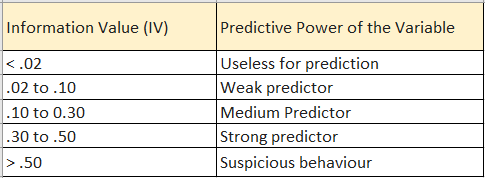

In [ ]:
woe = IV.T.sort_values(by=0, ascending=False)
woe

,0
wind_chill,4.748532
heat_index,2.453604
bulan,1.662166
season,1.181347
humidity,0.443010
cbwd,0.228819
Ir,0.147309
PRES,0.145848
DEWP,0.131473
Iws_kmh,0.125882


1. pm2.5 = 0.0157 = Useless
2. Ir = 0.46085 = Strong Predicted
3. Iws = 0.00931 = useless
4. wind chill = inf(?)
5. Ir Intensity = 0.28353 = Medium Predictor
6. Iws kmh = 0.14677 = Medium Predictor

In [ ]:
df_daily

,Iws,Ir,pm2.5,PRES,cbwd,DEWP,Temperature,Iws_change,Ir_intensity,pres_change,humidity,heat_index,Iws_kmh,wind_chill,temp_category,tahun,bulan,hari,season
0,0,9,0,0,0,2,21.025677,0,2,0.0400,0,4,0,0,1,2016,7,1,2
1,2,9,1,1,0,2,22.053792,0,2,0.1400,0,4,3,0,1,2016,7,2,2
2,2,9,1,1,1,2,26.355917,0,3,0.2975,0,4,3,0,1,2016,7,3,2
3,2,9,1,1,1,2,27.369385,0,3,0.2100,1,4,7,0,1,2016,7,4,2
4,2,9,1,1,1,2,30.139260,0,3,0.2500,1,4,4,0,1,2016,7,5,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
665,2,9,1,1,1,2,11.439469,0,2,0.2900,0,3,5,1,0,2018,4,27,1
666,2,8,1,0,1,2,11.125760,0,2,0.2675,0,3,5,1,0,2018,4,28,1
667,1,10,1,0,1,2,12.241115,0,2,0.1800,0,3,5,1,0,2018,4,29,1
668,2,7,1,1,1,2,13.660542,0,2,0.2200,0,4,5,1,0,2018,4,30,1


### Anova

In [ ]:
import pandas as pd
from sklearn.feature_selection import SelectKBest, f_classif

X = anova.drop(columns=["temp_category", "tahun", "Temperature"])
y = anova["temp_category"]

selector = SelectKBest(score_func=f_classif, k='all')
X_new = selector.fit_transform(X, y)

scores = pd.DataFrame({'Feature': X.columns, 'Score': selector.scores_})
anova = scores.sort_values(by='Score', ascending=False)
anova

,Feature,Score
10,heat_index,980.107185
9,humidity,934.257235
12,wind_chill,921.874102
15,season,105.778093
1,Ir,35.642877
3,PRES,35.271931
13,bulan,32.307588
7,Ir_intensity,19.131358
6,Iws_change,12.958152
2,pm2.5,3.655661


## C. Machine Learning

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, learning_curve
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

features = ["Ir_intensity", "Iws_kmh", "PRES", "cbwd", "DEWP", "humidity"]
target = "temp_category"

In [ ]:
test = data_cleaned.copy()
test[target] = np.nan
test

,Iws,Ir,pm2.5,PRES,cbwd,DEWP,Temperature,Iws_change,Ir_intensity,pres_change,humidity,heat_index,Iws_kmh,wind_chill,temp_category,tahun,bulan,hari,season
0,5.2240,2.6790,2.1320,0.8880,2.0,1.4920,21.025677,0.1300,50.2250,0.0400,29.516010,65.435460,19.831500,21.344375,NaN,2016,7,1,2
1,9.4105,4.2870,6.3255,1.9540,2.0,1.7360,22.053792,0.3400,77.3400,0.1400,27.356772,67.966073,37.194299,22.397396,NaN,2016,7,2,2
2,10.4490,5.0230,7.1070,2.5590,3.0,1.8880,26.355917,0.2700,121.4650,0.2975,20.449202,78.025505,39.606299,27.858958,NaN,2016,7,3,2
3,10.5160,5.4250,6.9825,2.8250,3.0,1.9800,27.369385,0.3400,129.9225,0.2100,18.488833,80.072961,40.751999,29.197604,NaN,2016,7,4,2
4,11.0855,5.3580,7.4620,2.7010,3.0,2.0100,30.139260,0.4700,133.5350,0.2500,15.876497,83.950486,42.017399,32.905625,NaN,2016,7,5,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
665,10.9850,2.5450,9.7190,1.1020,3.0,1.2790,11.439469,0.9550,65.6325,0.2900,49.462511,49.535586,51.542101,8.128646,NaN,2018,4,27,1
666,11.3870,1.8415,9.1150,0.7285,3.0,1.2640,11.125760,0.6175,74.0600,0.2675,51.542372,48.815295,52.567201,7.756458,NaN,2018,4,28,1
667,7.6025,1.5410,7.3915,0.5865,3.0,1.2335,12.241115,0.7550,66.3350,0.1800,46.230915,51.650647,51.361200,9.629062,NaN,2018,4,29,1
668,9.6115,1.4740,8.6350,1.3860,3.0,1.2180,13.660542,1.2025,78.4325,0.2200,43.512539,53.355751,49.431600,11.287813,NaN,2018,4,30,1


In [ ]:
X = df_daily[features]
y = df_daily[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

X

,Ir_intensity,Iws_kmh,PRES,cbwd,DEWP,humidity
0,2,0,0,0,2,0
1,2,3,1,0,2,0
2,3,3,1,1,2,0
3,3,7,1,1,2,1
4,3,4,1,1,2,1
...,...,...,...,...,...,...
665,2,5,1,1,2,0
666,2,5,0,1,2,0
667,2,5,0,1,2,0
668,2,5,1,1,2,0


In [ ]:
models = {
    "Logistic Regression": LogisticRegression(max_iter=1000),
    "Decision Tree": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier()
}

results = {}
metrics = ["accuracy", "precision", "recall", "f1_score"]

# Train and evaluate models
for model_name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    conf_matrix = confusion_matrix(y_test, y_pred)

    results[model_name] = {
        "model": model,
        "accuracy": accuracy,
        "precision": precision,
        "recall": recall,
        "f1_score": f1,
        "confusion_matrix": conf_matrix
    }

           Logistic Regression  Decision Tree  Random Forest
accuracy              0.611940       0.694030       0.723881
precision             0.550000       0.630769       0.652174
recall                0.568966       0.706897       0.775862
f1_score              0.559322       0.666667       0.708661


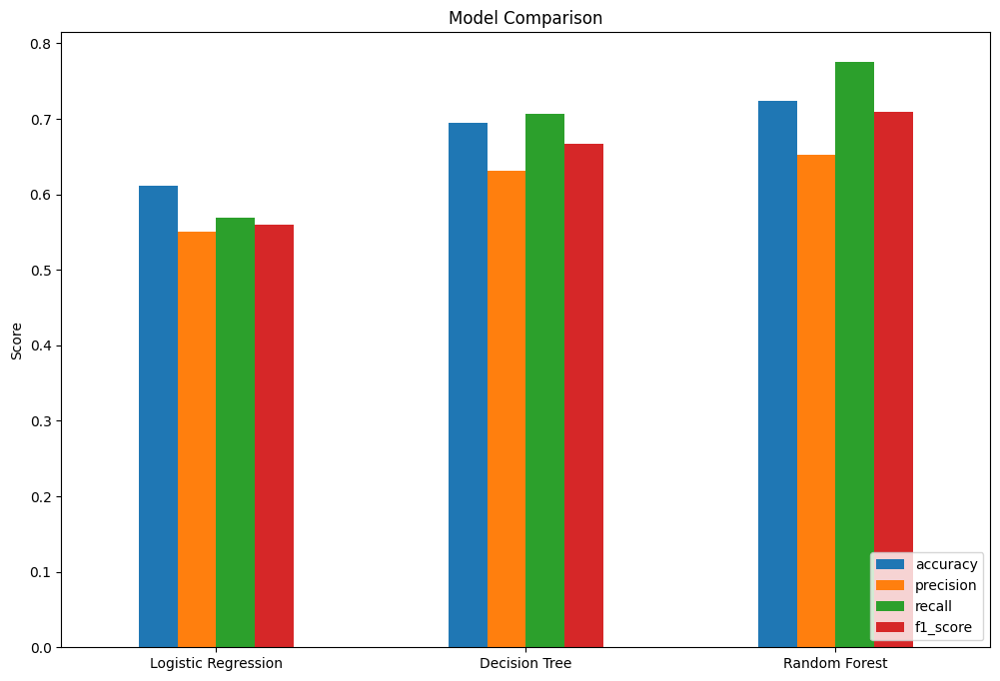

In [ ]:
metrics_df = pd.DataFrame({model_name: [results[model_name][metric] for metric in metrics] for model_name in models.keys()}, index=metrics)
print(metrics_df)

# Visualize metrics for all models
metrics_df.T.plot(kind='bar', figsize=(12, 8))
plt.title('Model Comparison')
plt.ylabel('Score')
plt.xticks(rotation=0)
plt.legend(loc='lower right')
plt.show()

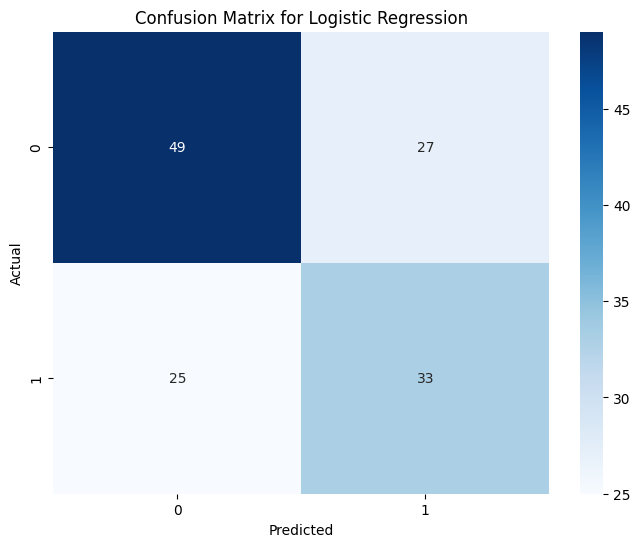

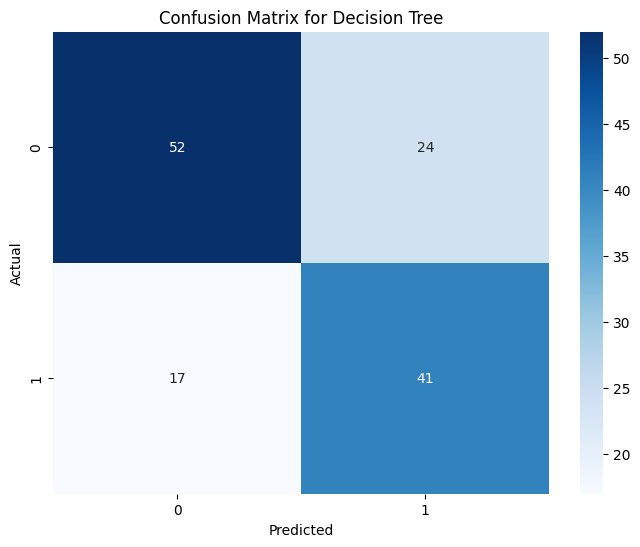

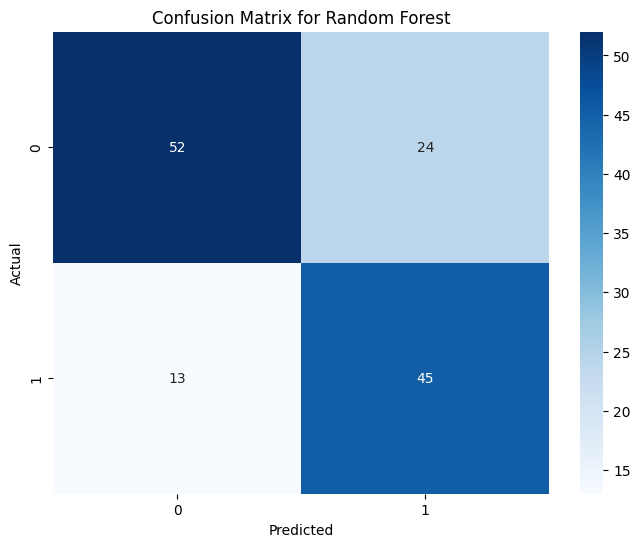

In [ ]:
for model_name, result in results.items():
    plt.figure(figsize=(8, 6))
    sns.heatmap(result["confusion_matrix"], annot=True, fmt='d', cmap='Blues', xticklabels=[0, 1], yticklabels=[0, 1])
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix for {model_name}')
    plt.show()

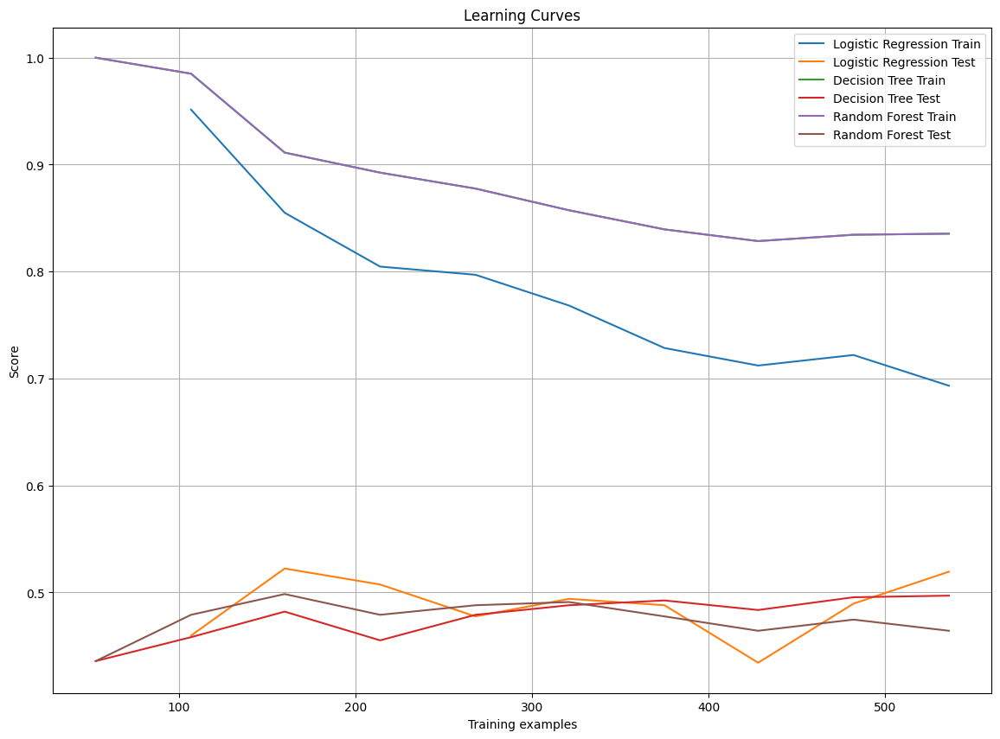

In [ ]:
plt.figure(figsize=(14, 10))
for model_name, model in models.items():
    train_sizes, train_scores, test_scores = learning_curve(model, X, y, cv=5, n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10))
    train_scores_mean = np.mean(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    plt.plot(train_sizes, train_scores_mean, label=f'{model_name} Train')
    plt.plot(train_sizes, test_scores_mean, label=f'{model_name} Test')
plt.xlabel('Training examples')
plt.ylabel('Score')
plt.title('Learning Curves')
plt.legend(loc='best')
plt.grid()
plt.show()

# Windowing Prediction

### 1 Hari

In [ ]:
day1=pd.read_excel('/content/drive/MyDrive/dataset-4/1Day.xlsx')
day1

,date_day,Iws,Ir,pm2.5,PRES,cbwd,DEWP,Temperature,Iws_change,Ir_intensity,pres_change,humidity,heat_index,Iws_kmh,wind_chill,temp_category,remarks
0,2016-07-01,5.2240,2.6790,2.1320,0.8880,2.0,1.4920,21.025677,0.1300,50.2250,0.0400,29.516010,65.435460,19.831500,21.344375,1,temp d2
1,2016-07-02,9.4105,4.2870,6.3255,1.9540,2.0,1.7360,22.053792,0.3400,77.3400,0.1400,27.356772,67.966073,37.194299,22.397396,1,temp d3
2,2016-07-03,10.4490,5.0230,7.1070,2.5590,3.0,1.8880,26.355917,0.2700,121.4650,0.2975,20.449202,78.025505,39.606299,27.858958,1,temp d4
3,2016-07-04,10.5160,5.4250,6.9825,2.8250,3.0,1.9800,27.369385,0.3400,129.9225,0.2100,18.488833,80.072961,40.751999,29.197604,1,temp d5
4,2016-07-05,11.0855,5.3580,7.4620,2.7010,3.0,2.0100,30.139260,0.4700,133.5350,0.2500,15.876497,83.950486,42.017399,32.905625,1,temp d6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
664,2018-04-26,9.4440,2.1430,8.0130,0.9060,2.5,1.2180,10.027365,0.8500,61.9050,0.3900,53.979208,47.289771,49.612500,6.563646,0,temp d666
665,2018-04-27,10.9850,2.5450,9.7190,1.1020,3.0,1.2790,11.439469,0.9550,65.6325,0.2900,49.462511,49.535586,51.542101,8.128646,0,temp d667
666,2018-04-28,11.3870,1.8415,9.1150,0.7285,3.0,1.2640,11.125760,0.6175,74.0600,0.2675,51.542372,48.815295,52.567201,7.756458,0,temp d668
667,2018-04-29,7.6025,1.5410,7.3915,0.5865,3.0,1.2335,12.241115,0.7550,66.3350,0.1800,46.230915,51.650647,51.361200,9.629062,0,temp d669


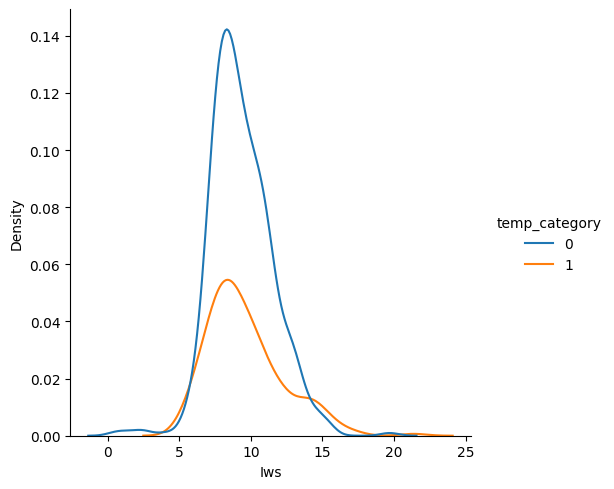

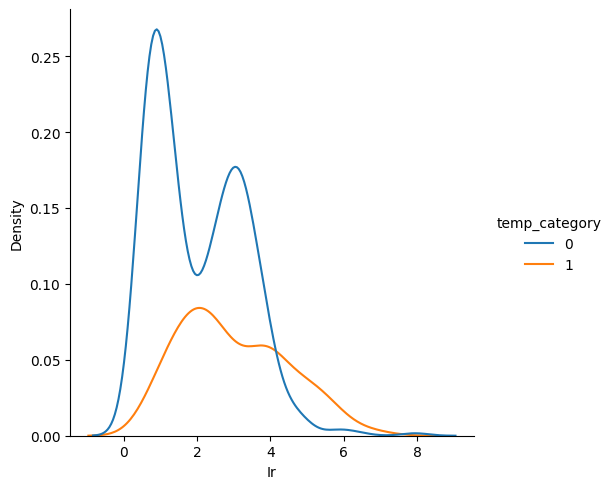

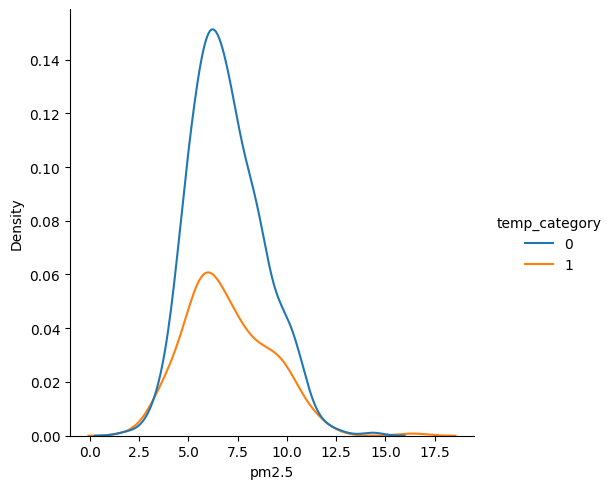

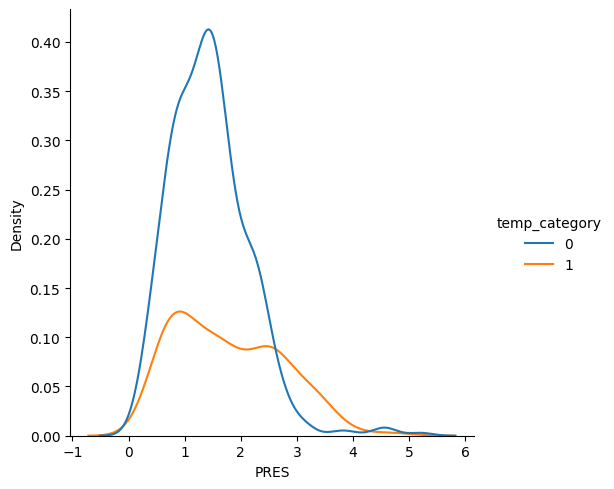

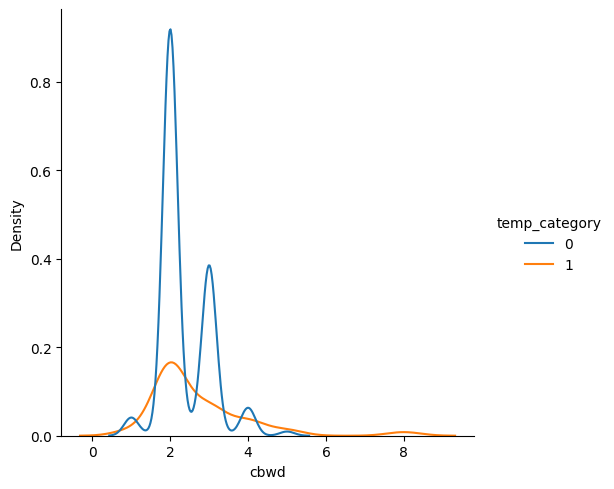

...

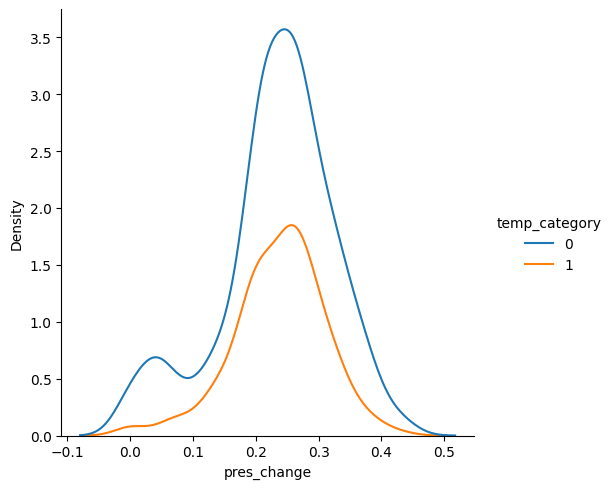

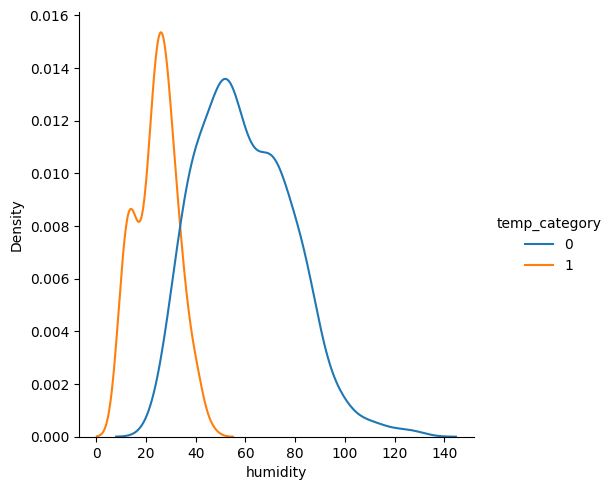

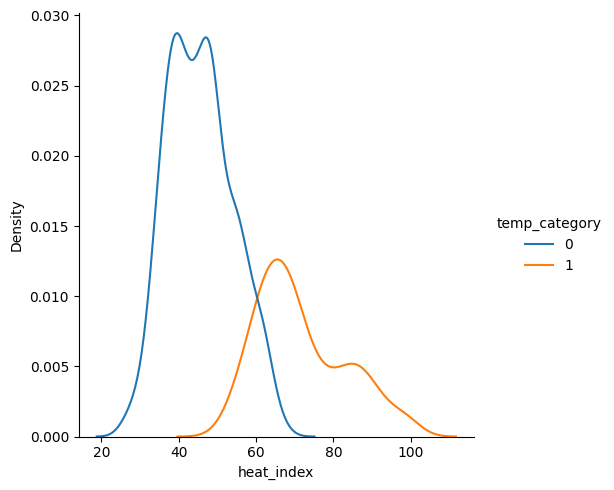

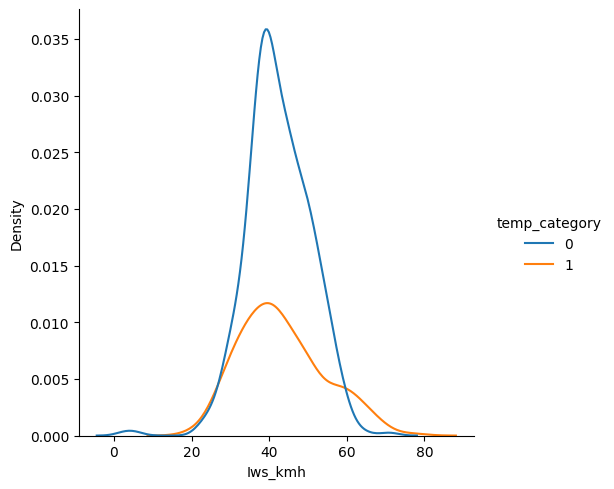

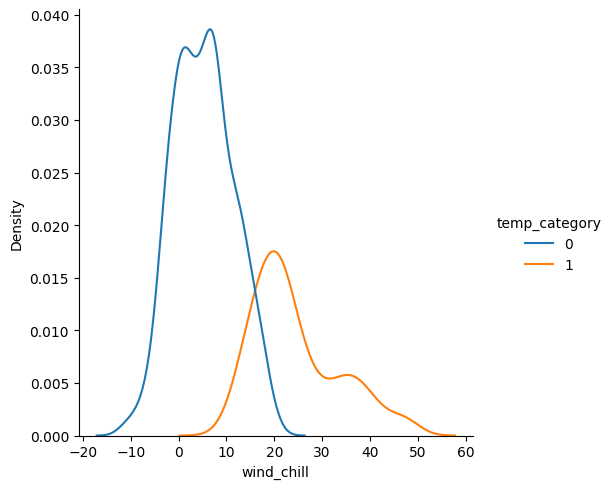

In [ ]:
sns.displot(day1, x= "Iws", hue="temp_category", kind="kde")
sns.displot(day1, x= "Ir", hue="temp_category", kind="kde")
sns.displot(day1, x= "pm2.5", hue="temp_category", kind="kde")
sns.displot(day1, x= "PRES", hue="temp_category", kind="kde")
sns.displot(day1, x= "cbwd", hue="temp_category", kind="kde")
sns.displot(day1, x= "DEWP", hue="temp_category", kind="kde")
sns.displot(day1, x= "Iws_change", hue="temp_category", kind="kde")
sns.displot(day1, x= "Ir_intensity", hue="temp_category", kind="kde")
sns.displot(day1, x= "pres_change", hue="temp_category", kind="kde")
sns.displot(day1, x= "humidity", hue="temp_category", kind="kde")
sns.displot(day1, x= "heat_index", hue="temp_category", kind="kde")
sns.displot(day1, x= "Iws_kmh", hue="temp_category", kind="kde")
sns.displot(day1, x= "wind_chill", hue="temp_category", kind="kde")

#### WoE

##### pm2.5

In [ ]:
def categorize_pm25(value):
    if value < 5:
        return 0  # Excellent
    elif 5 <= value < 6:
        return 1  # Fine
    elif 6 <= value < 8:
        return 2  # Moderate
    else:
        return 3

day1['pm2.5'] = day1['pm2.5'].apply(categorize_pm25)

a = pd.crosstab(day1['pm2.5'], day1['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return ln(df["%nonevent"]/df["%event"])

a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
pm2.5,,,,,,,
0,65,35,100,0.142232,0.165094,-0.149058,0.003408
1,85,42,127,0.185996,0.198113,-0.063115,0.000765
2,183,68,251,0.400438,0.320755,0.221881,0.017680
3,124,67,191,0.271335,0.316038,-0.152508,0.006818
Total,457,212,669,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.028670343916935136

In [ ]:
IV = pd.DataFrame()
IV['pm2.5'] = [a["IV"].sum()]

##### Ir

In [ ]:
def categorize_Ir(value):
    if value <= 1:
        return 0  # Basah ekstrem
    elif 1 < value <= 2:
        return 1  # Basah luar biasa
    elif 2< value <=3 :
        return 2  # Basah luar biasa
    elif 3< value :
        return 3  # Basah luar biasa
    else:
        return 3

day1['Ir'] = day1['Ir'].apply(categorize_Ir)

a = pd.crosstab(day1['Ir'], day1['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return ln(df["%nonevent"]/df["%event"])

a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
Ir,,,,,,,
0,129,11,140,0.282276,0.051887,1.693820,0.390237
1,109,53,162,0.238512,0.250000,-0.047041,0.000540
2,92,54,146,0.201313,0.254717,-0.235293,0.012566
3,127,94,221,0.277899,0.443396,-0.467205,0.077321
Total,457,212,669,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.4806642908467749

In [ ]:
IV['ir'] = [a["IV"].sum()]

##### Ir_intensity

In [ ]:
def categorize_Ir_intensity(value):
    if value < 34.9:
        return 0  # Moderate rain
    elif 35.0 <= value < 59.9:
        return 1  # Heavy rain
    elif 60.0 <= value < 99.9:
        return 2  # Rainstorm
    else:
        return 3  # Heavy rainstorm

day1['Ir_intensity'] = day1['Ir_intensity'].apply(categorize_Ir_intensity)

a = pd.crosstab(day1['Ir_intensity'], day1['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return ln(df["%nonevent"]/df["%event"])

a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
Ir_intensity,,,,,,,
0,148,29,177,0.323851,0.136792,0.861819,0.161211
1,87,46,133,0.190372,0.216981,-0.130830,0.003481
2,123,56,179,0.269147,0.264151,0.018736,0.000094
3,99,81,180,0.216630,0.382075,-0.567426,0.093878
Total,457,212,669,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.2586637477081992

In [ ]:
IV['Ir_intensity'] = [a["IV"].sum()]

##### Iws

In [ ]:
def categorize_Iws(value):
    if value < 8:
        return 0  # Good
    elif 8 <= value < 9:
        return 1  # Bad
    elif 9 <= value < 11:
        return 2  # Bad
    else:
        return 3 #very bad

day1['Iws'] = day1['Iws'].apply(categorize_Iws)

a = pd.crosstab(day1['Iws'], day1['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return ln(df["%nonevent"]/df["%event"])

a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
Iws,,,,,,,
0,124,60,184,0.271335,0.283019,-0.042160,0.000493
1,104,46,150,0.227571,0.216981,0.047652,0.000505
2,139,55,194,0.304158,0.259434,0.159044,0.007113
3,90,51,141,0.196937,0.240566,-0.200113,0.008731
Total,457,212,669,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.016841074228711027

In [ ]:
IV['iws'] = [a["IV"].sum()]

##### Iws_kmh

In [ ]:
def categorize_Iws_kmh(value):
    if value <= 35:
        return 0  # Fresh breeze
    elif 35 < value <= 40:
        return 1  # Gale
    elif 41 <= value <= 47:
        return 2  # Strong gale
    elif 48 <= value <= 55:
        return 3  # Storm
    else:
        return 4  # Hurricane

day1['Iws_kmh'] = day1['Iws_kmh'].apply(categorize_Iws_kmh)

a = pd.crosstab(day1['Iws_kmh'], day1['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return np.log(df["%nonevent"]/df["%event"])

a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
Iws_kmh,,,,,,,
0,67,54,121,0.146608,0.254717,-0.552389,0.059718
1,121,40,161,0.264770,0.188679,0.338814,0.025781
2,115,39,154,0.251641,0.183962,0.313273,0.021202
3,89,29,118,0.194748,0.136792,0.353243,0.020473
4,65,50,115,0.142232,0.235849,-0.505733,0.047345
Total,457,212,669,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.1745184599994011

In [ ]:
IV['Iws_kmh'] = [a["IV"].sum()]

##### PRES

In [ ]:
def categorize_PRES(value):
    if value <= 1:
        return 0
    elif 1 < value <= 1.5:
        return 1
    elif 1.5 < value <= 2.2:
        return 2
    else:
        return 3

day1['PRES'] = day1['PRES'].apply(categorize_PRES)

a = pd.crosstab(day1['PRES'], day1['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return np.log(df["%nonevent"]/df["%event"])

a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
PRES,,,,,,,
0,134,61,195,0.293217,0.287736,0.018869,0.000103
1,130,37,167,0.284464,0.174528,0.488519,0.053706
2,125,39,164,0.273523,0.183962,0.396655,0.035525
3,68,75,143,0.148796,0.353774,-0.866078,0.177526
Total,457,212,669,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.266859837340088

In [ ]:
IV['PRES'] = [a["IV"].sum()]

##### cbwd

In [ ]:
def categorize_cbwd(value):
    if value <= 1.9:
        return 0
    elif 1.9 < value <= 2:
        return 1
    elif value > 3:
        return 3
    else:
        return 2

day1['cbwd'] = day1['cbwd'].apply(categorize_cbwd)

a = pd.crosstab(day1['cbwd'], day1['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return np.log(df["%nonevent"]/df["%event"])

a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
cbwd,,,,,,,
0,14,9,23,0.030635,0.042453,-0.326264,0.003856
1,291,118,409,0.636761,0.556604,0.134542,0.010785
2,128,45,173,0.280088,0.212264,0.277271,0.018805
3,24,40,64,0.052516,0.188679,-1.278923,0.174142
Total,457,212,669,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.20758759413886657

In [ ]:
IV['cbwd'] = [a["IV"].sum()]

##### DEWP

In [ ]:
def categorize_DEWP(value):
    if value < 0:
        return 0
    elif value > 1:
        return 2
    else:
        return 1

day1['DEWP'] = day1['DEWP'].apply(categorize_DEWP)

a = pd.crosstab(day1['DEWP'], day1['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return np.log(df["%nonevent"]/df["%event"])

a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
DEWP,,,,,,,
0,31,38,69,0.067834,0.179245,-0.971696,0.108258
1,250,48,298,0.547046,0.226415,0.882163,0.282849
2,176,126,302,0.385120,0.594340,-0.433895,0.090779
Total,457,212,669,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.48188601365537287

In [ ]:
IV['DEWP'] = [a["IV"].sum()]

#### Result

In [ ]:
woe = IV.T.sort_values(by=0, ascending=False)
woe

,0
DEWP,0.481886
ir,0.480664
PRES,0.266860
Ir_intensity,0.258664
cbwd,0.207588
Iws_kmh,0.174518
pm2.5,0.028670
iws,0.016841


Training Metrics:
            Logistic Regression  Decision Tree  Random Forest   XGBoost  \
accuracy              0.692308       0.895299       0.895299  0.888889   
precision             0.424242       0.881356       0.808219  0.808511   
recall                0.100719       0.748201       0.848921  0.820144   
f1_score              0.162791       0.809339       0.828070  0.814286   
roc_auc               0.684503       0.970283       0.966325  0.963023   

           Gradient Boosting  
accuracy            0.833333  
precision           0.756303  
recall              0.647482  
f1_score            0.697674  
roc_auc             0.917190  
Testing Metrics:
            Logistic Regression  Decision Tree  Random Forest   XGBoost  \
accuracy              0.671642       0.736318       0.731343  0.746269   
precision             0.705882       0.692308       0.650794  0.661765   
recall                0.164384       0.493151       0.561644  0.616438   
f1_score              0.266667      

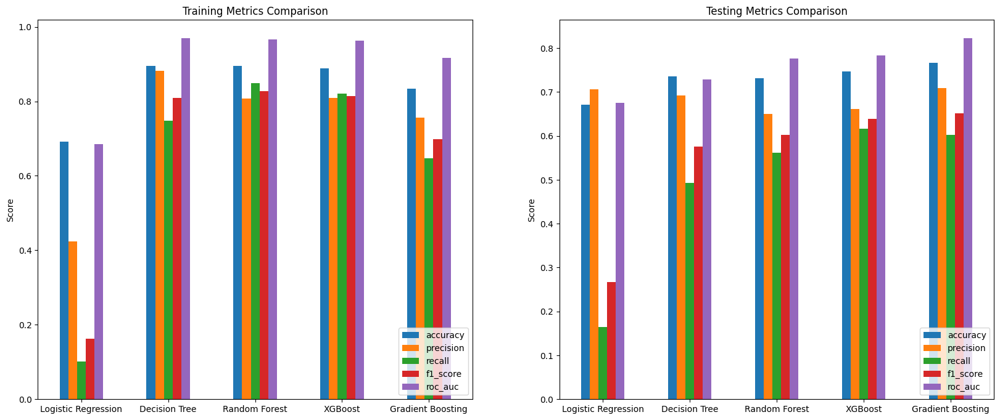

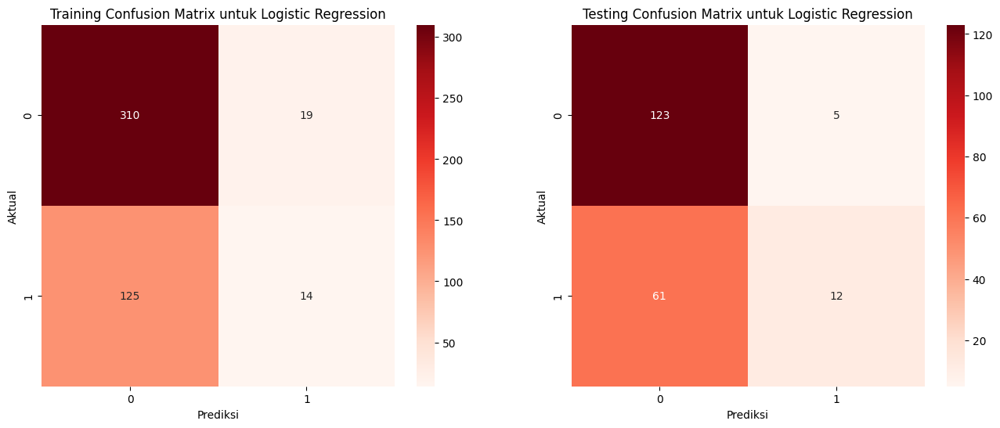

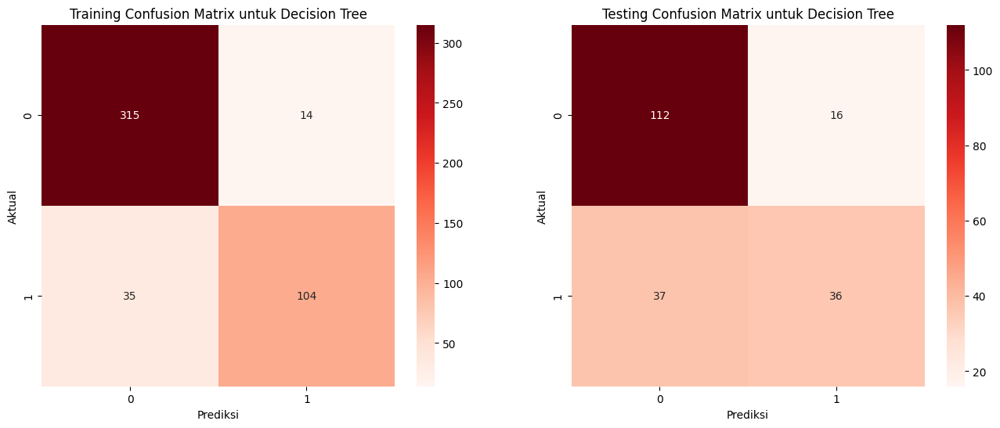

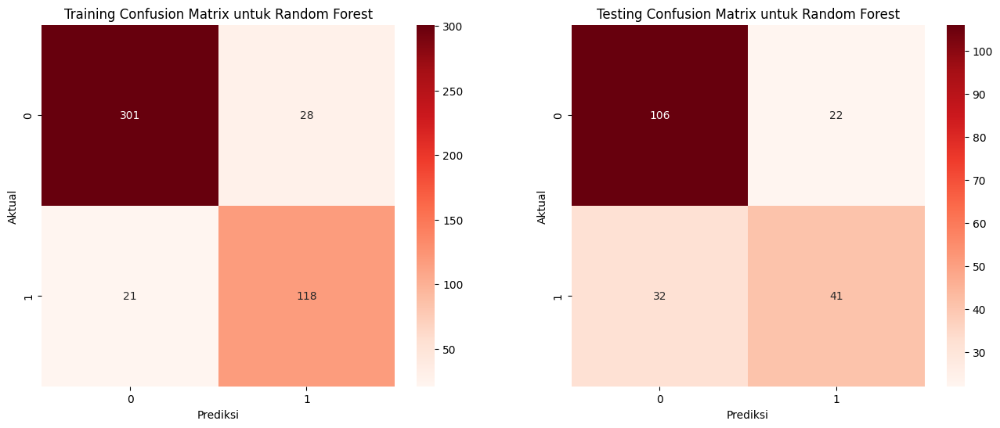

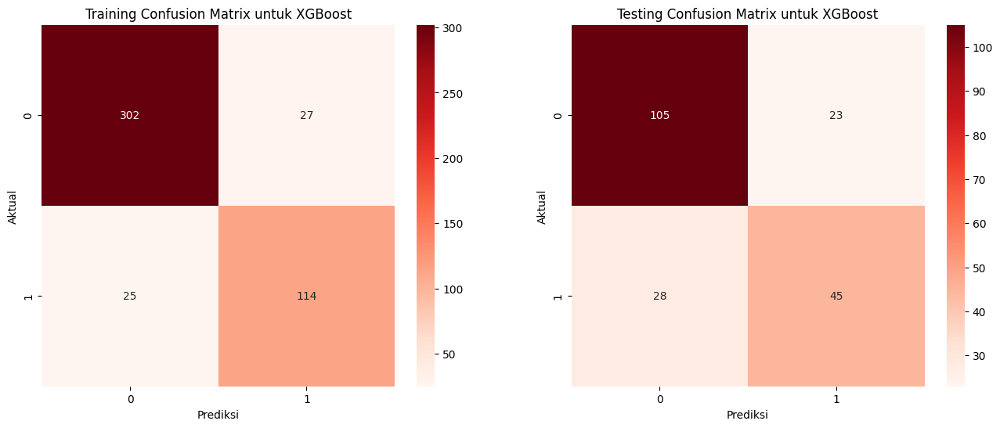

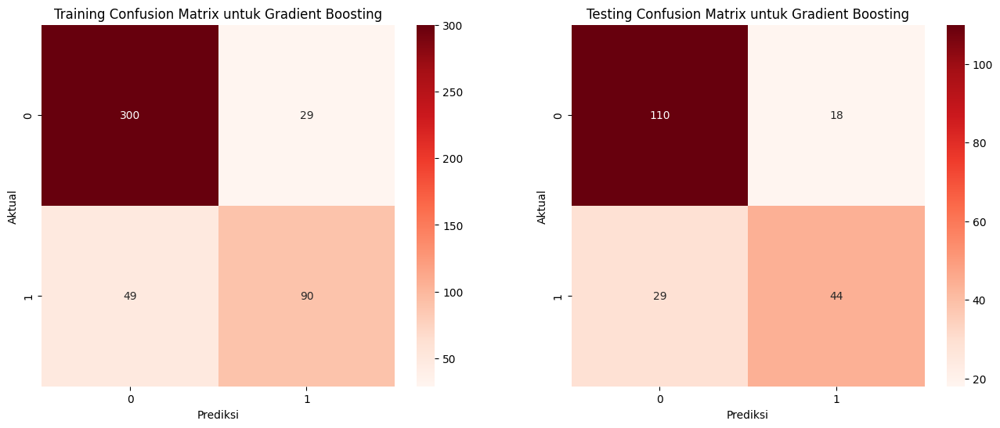

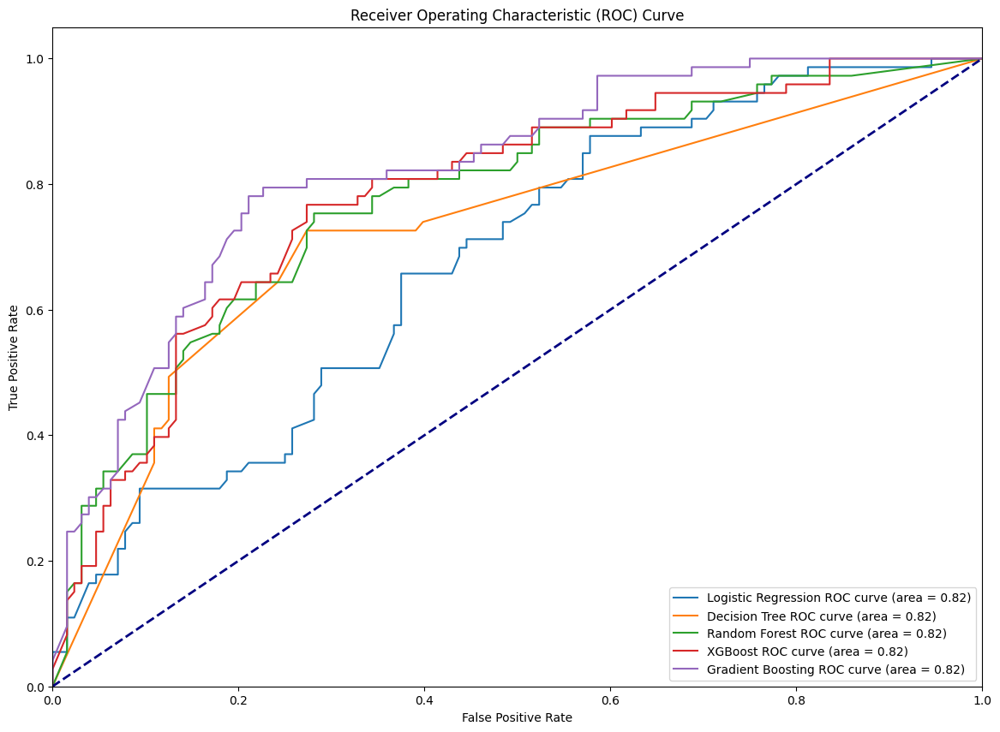

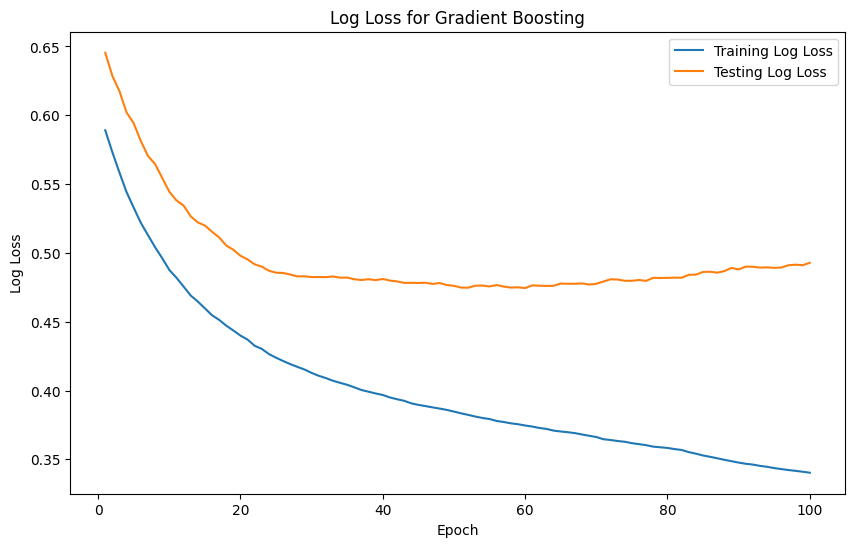

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, learning_curve
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score, roc_curve, log_loss

features = ["Ir_intensity", "Iws_kmh", "PRES", "cbwd", "DEWP", "Ir"]
target = "temp_category"

X = day1[features]
y = day1[target]

# Split data menjadi 70% train dan 30% test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Inisialisasi model
models = {
    "Logistic Regression": LogisticRegression(max_iter=1000),
    "Decision Tree": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier(),
    "XGBoost": XGBClassifier(eval_metric='logloss'),
    "Gradient Boosting": GradientBoostingClassifier()
}

results = {}
metrics = ["accuracy", "precision", "recall", "f1_score", "roc_auc"]

# Train dan evaluasi model
for model_name, model in models.items():
    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    y_proba_train = model.predict_proba(X_train)[:, 1]
    y_proba_test = model.predict_proba(X_test)[:, 1]

    accuracy_train = accuracy_score(y_train, y_pred_train)
    precision_train = precision_score(y_train, y_pred_train)
    recall_train = recall_score(y_train, y_pred_train)
    f1_train = f1_score(y_train, y_pred_train)
    roc_auc_train = roc_auc_score(y_train, y_proba_train)

    accuracy_test = accuracy_score(y_test, y_pred_test)
    precision_test = precision_score(y_test, y_pred_test)
    recall_test = recall_score(y_test, y_pred_test)
    f1_test = f1_score(y_test, y_pred_test)
    roc_auc_test = roc_auc_score(y_test, y_proba_test)

    conf_matrix_train = confusion_matrix(y_train, y_pred_train)
    conf_matrix_test = confusion_matrix(y_test, y_pred_test)

    results[model_name] = {
        "model": model,
        "train": {
            "accuracy": accuracy_train,
            "precision": precision_train,
            "recall": recall_train,
            "f1_score": f1_train,
            "roc_auc": roc_auc_train,
            "confusion_matrix": conf_matrix_train
        },
        "test": {
            "accuracy": accuracy_test,
            "precision": precision_test,
            "recall": recall_test,
            "f1_score": f1_test,
            "roc_auc": roc_auc_test,
            "confusion_matrix": conf_matrix_test
        }
    }

# Membuat DataFrame hasil evaluasi model
metrics_df_train = pd.DataFrame({model_name: [results[model_name]["train"][metric] for metric in metrics] for model_name in models.keys()}, index=metrics)
metrics_df_test = pd.DataFrame({model_name: [results[model_name]["test"][metric] for metric in metrics] for model_name in models.keys()}, index=metrics)

print("Training Metrics:\n", metrics_df_train)
print("Testing Metrics:\n", metrics_df_test)

# Visualisasi metrik untuk semua model
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

metrics_df_train.T.plot(kind='bar', ax=axes[0])
axes[0].set_title('Training Metrics Comparison')
axes[0].set_ylabel('Score')
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=0)
axes[0].legend(loc='lower right')

metrics_df_test.T.plot(kind='bar', ax=axes[1])
axes[1].set_title('Testing Metrics Comparison')
axes[1].set_ylabel('Score')
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=0)
axes[1].legend(loc='lower right')

plt.show()

# Menampilkan Confusion Matrix untuk setiap model
for model_name, result in results.items():
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    sns.heatmap(result["train"]["confusion_matrix"], annot=True, fmt='d', cmap='Reds', xticklabels=[0, 1], yticklabels=[0, 1], ax=axes[0])
    sns.heatmap(result["test"]["confusion_matrix"], annot=True, fmt='d', cmap='Reds', xticklabels=[0, 1], yticklabels=[0, 1], ax=axes[1])
    axes[0].set_xlabel('Prediksi')
    axes[0].set_ylabel('Aktual')
    axes[0].set_title(f'Training Confusion Matrix untuk {model_name}')
    axes[1].set_xlabel('Prediksi')
    axes[1].set_ylabel('Aktual')
    axes[1].set_title(f'Testing Confusion Matrix untuk {model_name}')
    plt.show()

# Menampilkan ROC Curve untuk setiap model
plt.figure(figsize=(14, 10))
for model_name, model in models.items():
    y_proba_test = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_proba_test)
    plt.plot(fpr, tpr, label=f'{model_name} ROC curve (area = {roc_auc_test:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Visualisasi log loss untuk Gradient Boosting
gbr = models["Gradient Boosting"]
n_estimators = gbr.n_estimators
log_loss_train = []
log_loss_test = []

for y_pred_train, y_pred_test in zip(gbr.staged_predict_proba(X_train), gbr.staged_predict_proba(X_test)):
    log_loss_train.append(log_loss(y_train, y_pred_train))
    log_loss_test.append(log_loss(y_test, y_pred_test))

plt.figure(figsize=(10, 6))
plt.plot(range(1, n_estimators + 1), log_loss_train, label='Training Log Loss')
plt.plot(range(1, n_estimators + 1), log_loss_test, label='Testing Log Loss')
plt.xlabel('Epoch')
plt.ylabel('Log Loss')
plt.title('Log Loss for Gradient Boosting')
plt.legend()
plt.show()


### 2 Hari

In [ ]:
day2=pd.read_excel('/content/drive/MyDrive/dataset-4/2Day.xlsx')
day2

,date_day,Iws,Ir,pm2.5,PRES,cbwd,DEWP,Temperature,Iws_change,Ir_intensity,pres_change,humidity,heat_index,Iws_kmh,wind_chill,temp_category,remarks
0,2016-07-01,5.2240,2.6790,2.1320,0.8880,2.0,1.4920,21.025677,0.1300,50.2250,0.0400,29.516010,65.435460,19.831500,21.344375,1,temp d3
1,2016-07-02,9.4105,4.2870,6.3255,1.9540,2.0,1.7360,22.053792,0.3400,77.3400,0.1400,27.356772,67.966073,37.194299,22.397396,1,temp d4
2,2016-07-03,10.4490,5.0230,7.1070,2.5590,3.0,1.8880,26.355917,0.2700,121.4650,0.2975,20.449202,78.025505,39.606299,27.858958,1,temp d5
3,2016-07-04,10.5160,5.4250,6.9825,2.8250,3.0,1.9800,27.369385,0.3400,129.9225,0.2100,18.488833,80.072961,40.751999,29.197604,1,temp d6
4,2016-07-05,11.0855,5.3580,7.4620,2.7010,3.0,2.0100,30.139260,0.4700,133.5350,0.2500,15.876497,83.950486,42.017399,32.905625,1,temp d7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
663,2018-04-25,10.4155,2.1430,9.5585,0.8880,2.0,1.1570,8.812437,0.7550,64.1350,0.4300,57.939201,45.279570,52.506900,4.792500,0,temp d666
664,2018-04-26,9.4440,2.1430,8.0130,0.9060,2.5,1.2180,10.027365,0.8500,61.9050,0.3900,53.979208,47.289771,49.612500,6.563646,0,temp d667
665,2018-04-27,10.9850,2.5450,9.7190,1.1020,3.0,1.2790,11.439469,0.9550,65.6325,0.2900,49.462511,49.535586,51.542101,8.128646,0,temp d668
666,2018-04-28,11.3870,1.8415,9.1150,0.7285,3.0,1.2640,11.125760,0.6175,74.0600,0.2675,51.542372,48.815295,52.567201,7.756458,0,temp d669


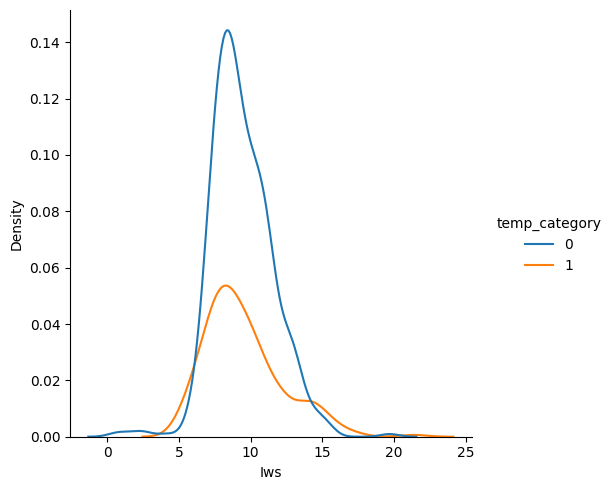

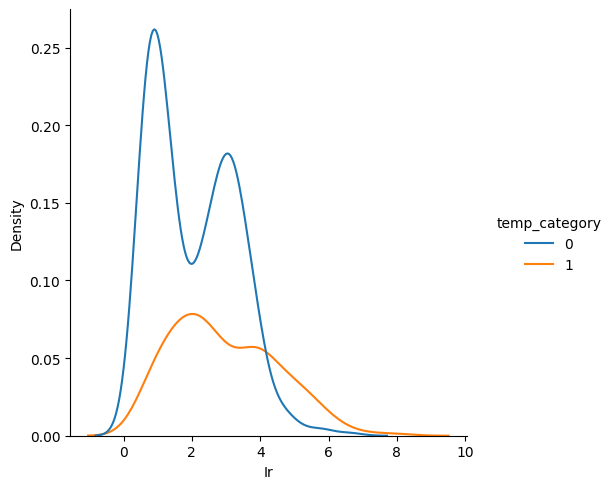

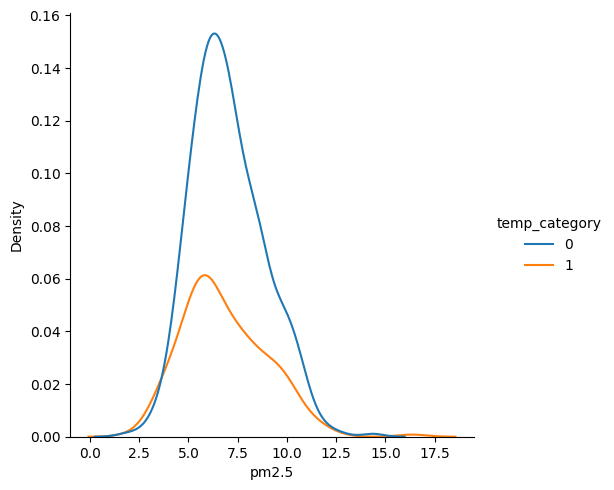

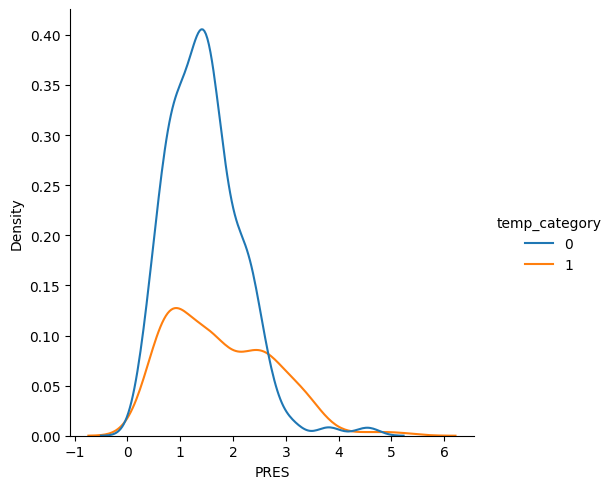

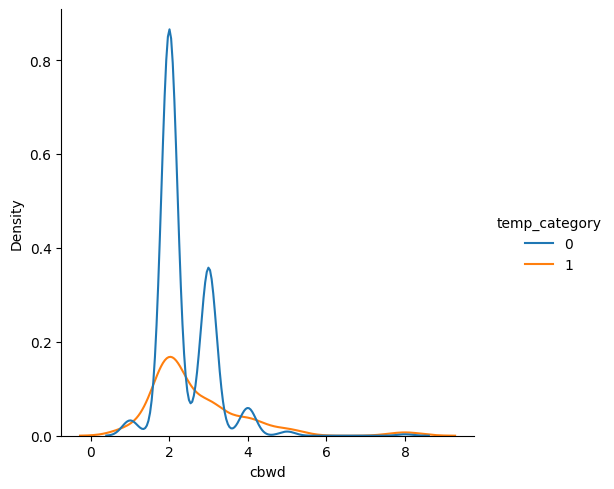

...

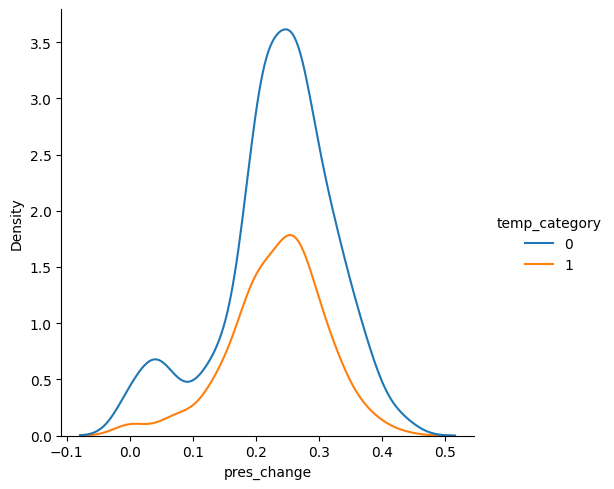

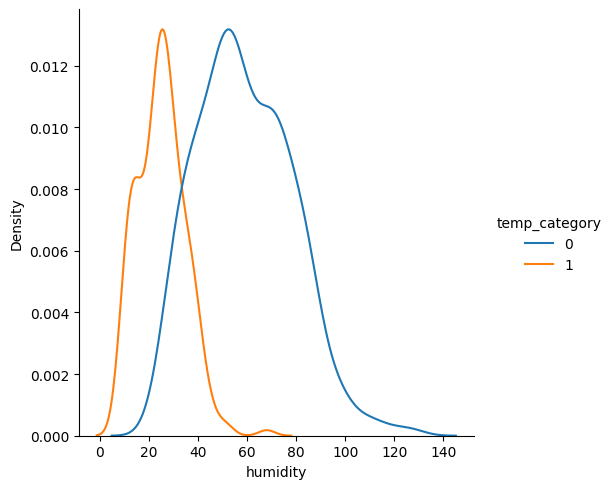

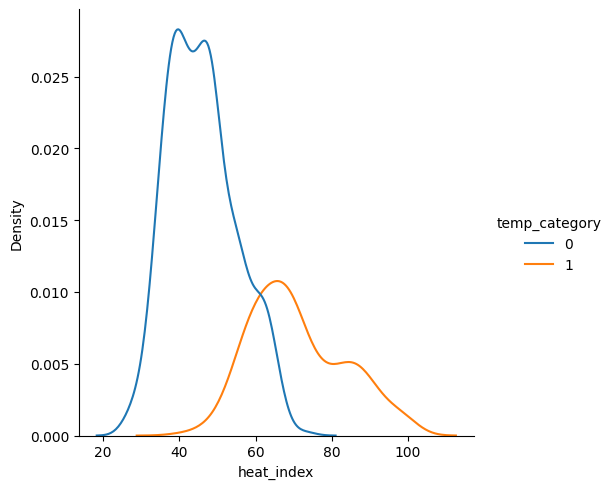

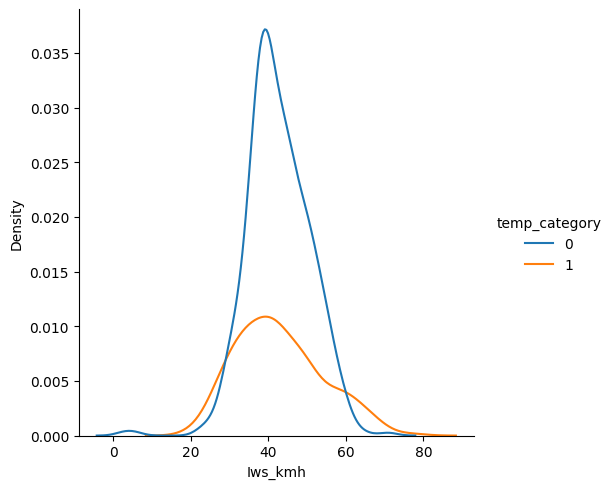

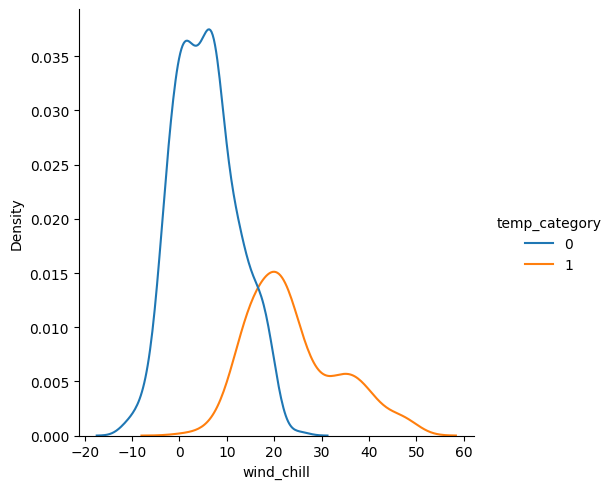

In [ ]:
sns.displot(day2, x= "Iws", hue="temp_category", kind="kde")
sns.displot(day2, x= "Ir", hue="temp_category", kind="kde")
sns.displot(day2, x= "pm2.5", hue="temp_category", kind="kde")
sns.displot(day2, x= "PRES", hue="temp_category", kind="kde")
sns.displot(day2, x= "cbwd", hue="temp_category", kind="kde")
sns.displot(day2, x= "DEWP", hue="temp_category", kind="kde")
sns.displot(day2, x= "Iws_change", hue="temp_category", kind="kde")
sns.displot(day2, x= "Ir_intensity", hue="temp_category", kind="kde")
sns.displot(day2, x= "pres_change", hue="temp_category", kind="kde")
sns.displot(day2, x= "humidity", hue="temp_category", kind="kde")
sns.displot(day2, x= "heat_index", hue="temp_category", kind="kde")
sns.displot(day2, x= "Iws_kmh", hue="temp_category", kind="kde")
sns.displot(day2, x= "wind_chill", hue="temp_category", kind="kde")

#### WoE

##### pm2.5

In [ ]:
def categorize_pm25(value):
    if value < 5:
        return 0  # Excellent
    elif 5 <= value < 6:
        return 1  # Fine
    elif 6 <= value < 8:
        return 2  # Moderate
    else:
        return 3

day2['pm2.5'] = day2['pm2.5'].apply(categorize_pm25)

a = pd.crosstab(day2['pm2.5'], day2['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return ln(df["%nonevent"]/df["%event"])

a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
pm2.5,,,,,,,
0,58,42,100,0.126915,0.199052,-0.450052,0.032466
1,86,41,127,0.188184,0.194313,-0.032050,0.000196
2,185,66,251,0.404814,0.312796,0.257876,0.023729
3,128,62,190,0.280088,0.293839,-0.047929,0.000659
Total,457,211,668,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.05705029605075882

In [ ]:
IV = pd.DataFrame()
IV['pm2.5'] = [a["IV"].sum()]

##### Ir

In [ ]:
def categorize_Ir(value):
    if value <= 1:
        return 0  # Basah ekstrem
    elif 1 < value <= 2:
        return 1  # Basah luar biasa
    elif 2< value <=3 :
        return 2  # Basah luar biasa
    elif 3< value :
        return 3  # Basah luar biasa
    else:
        return 3

day2['Ir'] = day2['Ir'].apply(categorize_Ir)

a = pd.crosstab(day2['Ir'], day2['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return ln(df["%nonevent"]/df["%event"])

a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
Ir,,,,,,,
0,123,17,140,0.269147,0.080569,1.206146,0.227452
1,110,51,161,0.240700,0.241706,-0.004171,0.000004
2,95,51,146,0.207877,0.241706,-0.150774,0.005100
3,129,92,221,0.282276,0.436019,-0.434801,0.066848
Total,457,211,668,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.29940488570941975

In [ ]:
IV['ir'] = [a["IV"].sum()]

##### Ir_intensity

In [ ]:
def categorize_Ir_intensity(value):
    if value < 34.9:
        return 0  # Moderate rain
    elif 35.0 <= value < 59.9:
        return 1  # Heavy rain
    elif 60.0 <= value < 99.9:
        return 2  # Rainstorm
    else:
        return 3  # Heavy rainstorm

day2['Ir_intensity'] = day2['Ir_intensity'].apply(categorize_Ir_intensity)

a = pd.crosstab(day2['Ir_intensity'], day2['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return ln(df["%nonevent"]/df["%event"])

a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
Ir_intensity,,,,,,,
0,144,33,177,0.315098,0.156398,0.700480,0.111167
1,90,43,133,0.196937,0.203791,-0.034216,0.000235
2,125,53,178,0.273523,0.251185,0.085197,0.001903
3,98,82,180,0.214442,0.388626,-0.594577,0.103566
Total,457,211,668,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.2168697409266335

In [ ]:
IV['Ir_intensity'] = [a["IV"].sum()]

##### Iws

In [ ]:
def categorize_Iws(value):
    if value < 8:
        return 0  # Good
    elif 8 <= value < 9:
        return 1  # Bad
    elif 9 <= value < 11:
        return 2  # Bad
    else:
        return 3 #very bad

day2['Iws'] = day2['Iws'].apply(categorize_Iws)

a = pd.crosstab(day2['Iws'], day2['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return ln(df["%nonevent"]/df["%event"])

a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
Iws,,,,,,,
0,117,67,184,0.256018,0.317536,-0.215344,0.013248
1,109,41,150,0.238512,0.194313,0.204951,0.009059
2,138,55,193,0.301969,0.260664,0.147095,0.006076
3,93,48,141,0.203501,0.227488,-0.111427,0.002673
Total,457,211,668,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.031054891519392443

In [ ]:
IV['iws'] = [a["IV"].sum()]

##### Iws_kmh

In [ ]:
def categorize_Iws_kmh(value):
    if value <= 35:
        return 0  # Fresh breeze
    elif 35 < value <= 40:
        return 1  # Gale
    elif 41 <= value <= 47:
        return 2  # Strong gale
    elif 48 <= value <= 55:
        return 3  # Storm
    else:
        return 4  # Hurricane

day2['Iws_kmh'] = day2['Iws_kmh'].apply(categorize_Iws_kmh)

a = pd.crosstab(day2['Iws_kmh'], day2['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return np.log(df["%nonevent"]/df["%event"])

a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
Iws_kmh,,,,,,,
0,62,59,121,0.135667,0.279621,-0.723228,0.104111
1,125,36,161,0.273523,0.170616,0.471970,0.048569
2,117,37,154,0.256018,0.175355,0.378431,0.030525
3,87,30,117,0.190372,0.142180,0.291885,0.014067
4,66,49,115,0.144420,0.232227,-0.474991,0.041708
Total,457,211,668,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.2389793268220938

In [ ]:
IV['Iws_kmh'] = [a["IV"].sum()]

##### PRES

In [ ]:
def categorize_PRES(value):
    if value <= 1:
        return 0
    elif 1 < value <= 1.5:
        return 1
    elif 1.5 < value <= 2.2:
        return 2
    else:
        return 3

day2['PRES'] = day2['PRES'].apply(categorize_PRES)

a = pd.crosstab(day2['PRES'], day2['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return np.log(df["%nonevent"]/df["%event"])

a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
PRES,,,,,,,
0,131,64,195,0.286652,0.303318,-0.056511,0.000942
1,130,36,166,0.284464,0.170616,0.511190,0.058198
2,126,38,164,0.275711,0.180095,0.425870,0.040720
3,70,73,143,0.153173,0.345972,-0.814789,0.157090
Total,457,211,668,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.2569501957145862

In [ ]:
IV['PRES'] = [a["IV"].sum()]

##### cbwd

In [ ]:
def categorize_cbwd(value):
    if value <= 1.9:
        return 0
    elif 1.9 < value <= 2:
        return 1
    elif value > 3:
        return 3
    else:
        return 2

day2['cbwd'] = day2['cbwd'].apply(categorize_cbwd)

a = pd.crosstab(day2['cbwd'], day2['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return np.log(df["%nonevent"]/df["%event"])

a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
cbwd,,,,,,,
0,12,11,23,0.026258,0.052133,-0.685814,0.017745
1,293,116,409,0.641138,0.549763,0.153757,0.014050
2,127,45,172,0.277899,0.213270,0.264699,0.017107
3,25,39,64,0.054705,0.184834,-1.217511,0.158434
Total,457,211,668,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.20733607050278452

In [ ]:
IV['cbwd'] = [a["IV"].sum()]

##### DEWP

In [ ]:
def categorize_DEWP(value):
    if value < 0:
        return 0
    elif value > 1:
        return 2
    else:
        return 1

day2['DEWP'] = day2['DEWP'].apply(categorize_DEWP)

a = pd.crosstab(day2['DEWP'], day2['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return np.log(df["%nonevent"]/df["%event"])

a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
DEWP,,,,,,,
0,32,37,69,0.070022,0.175355,-0.918007,0.096697
1,248,50,298,0.542670,0.236967,0.828580,0.253299
2,177,124,301,0.387309,0.587678,-0.416957,0.083545
Total,457,211,668,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.43354167655767556

In [ ]:
IV['DEWP'] = [a["IV"].sum()]

#### Result

In [ ]:
woe = IV.T.sort_values(by=0, ascending=False)
woe

,0
DEWP,0.433542
ir,0.299405
PRES,0.256950
Iws_kmh,0.238979
Ir_intensity,0.216870
cbwd,0.207336
pm2.5,0.057050
iws,0.031055


In [ ]:
day2

,date_day,Iws,Ir,pm2.5,PRES,cbwd,DEWP,Temperature,Iws_change,Ir_intensity,pres_change,humidity,heat_index,Iws_kmh,wind_chill,temp_category,remarks
0,2016-07-01,0,2,0,0,1,2,21.025677,0.1300,1,0.0400,29.516010,65.435460,0,21.344375,1,temp d3
1,2016-07-02,2,3,2,2,1,2,22.053792,0.3400,2,0.1400,27.356772,67.966073,1,22.397396,1,temp d4
2,2016-07-03,2,3,2,3,2,2,26.355917,0.2700,3,0.2975,20.449202,78.025505,1,27.858958,1,temp d5
3,2016-07-04,2,3,2,3,2,2,27.369385,0.3400,3,0.2100,18.488833,80.072961,4,29.197604,1,temp d6
4,2016-07-05,3,3,2,3,2,2,30.139260,0.4700,3,0.2500,15.876497,83.950486,2,32.905625,1,temp d7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
663,2018-04-25,2,2,3,0,1,2,8.812437,0.7550,2,0.4300,57.939201,45.279570,3,4.792500,0,temp d666
664,2018-04-26,2,2,3,0,2,2,10.027365,0.8500,2,0.3900,53.979208,47.289771,3,6.563646,0,temp d667
665,2018-04-27,2,2,3,1,2,2,11.439469,0.9550,2,0.2900,49.462511,49.535586,3,8.128646,0,temp d668
666,2018-04-28,3,1,3,0,2,2,11.125760,0.6175,2,0.2675,51.542372,48.815295,3,7.756458,0,temp d669


Training Metrics:
            Logistic Regression  Decision Tree  Random Forest   XGBoost  \
accuracy              0.689507       0.890792       0.890792  0.884368   
precision             0.250000       0.841270       0.816176  0.794326   
recall                0.029197       0.773723       0.810219  0.817518   
f1_score              0.052288       0.806084       0.813187  0.805755   
roc_auc               0.664941       0.965118       0.958438  0.953683   

           Gradient Boosting  
accuracy            0.845824  
precision           0.740741  
recall              0.729927  
f1_score            0.735294  
roc_auc             0.904512  
Testing Metrics:
            Logistic Regression  Decision Tree  Random Forest   XGBoost  \
accuracy              0.626866       0.681592       0.721393  0.726368   
precision             0.428571       0.583333       0.640625  0.646154   
recall                0.040541       0.472973       0.554054  0.567568   
f1_score              0.074074      

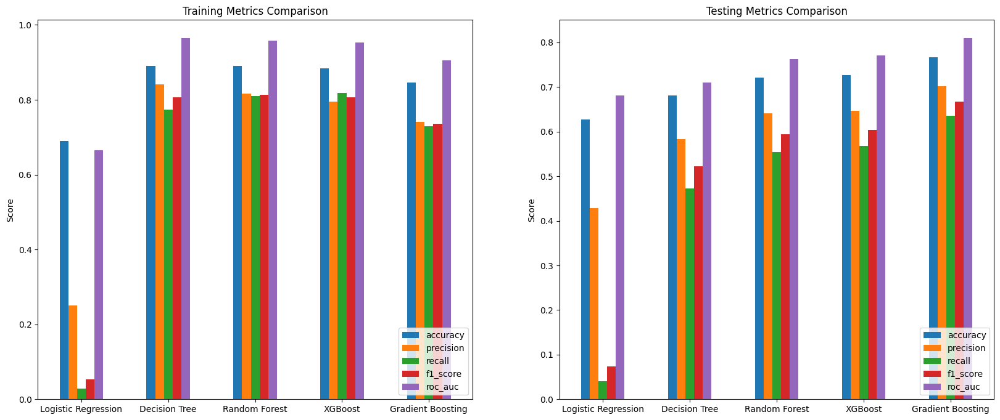

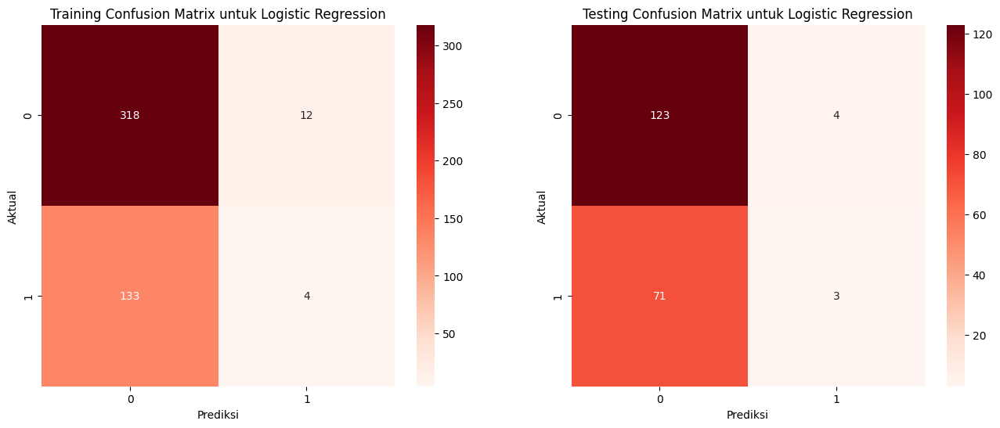

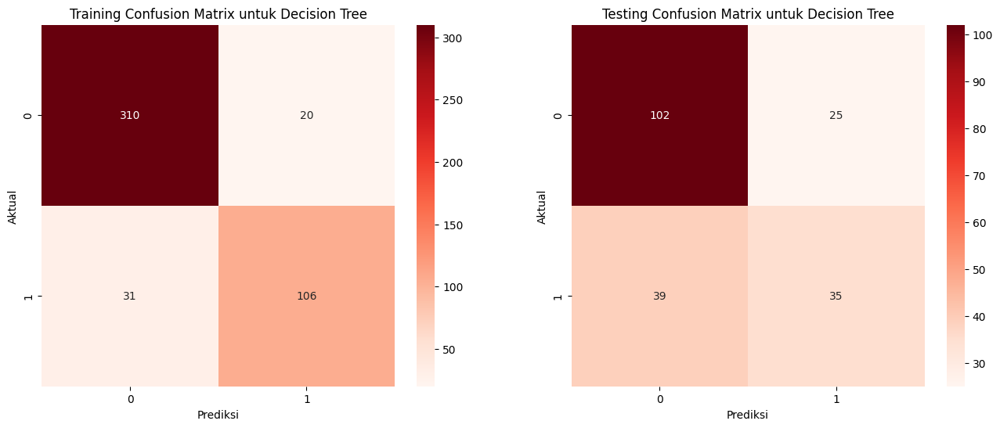

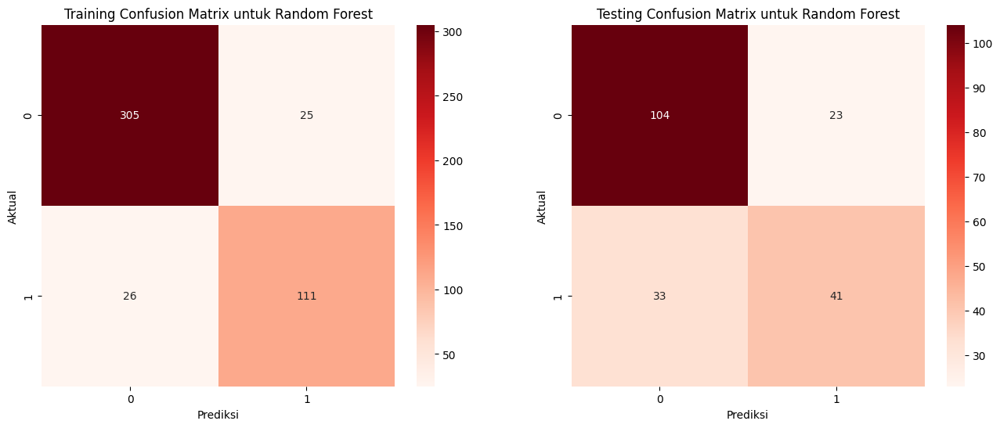

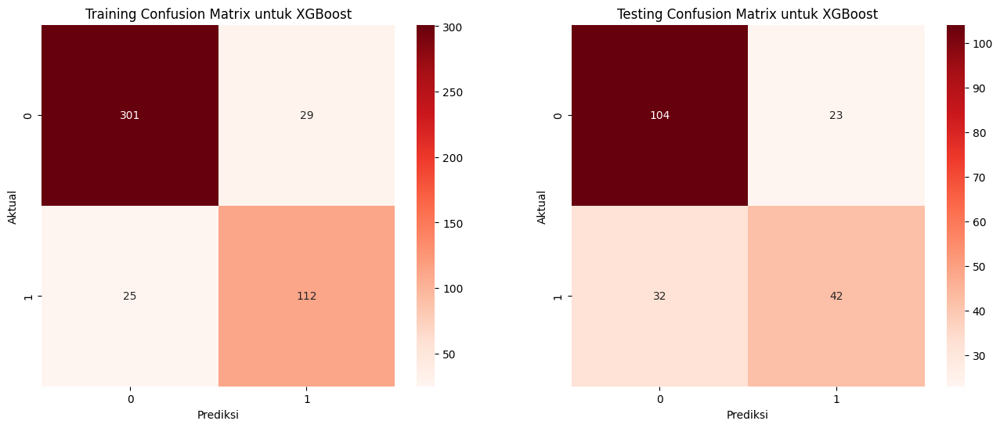

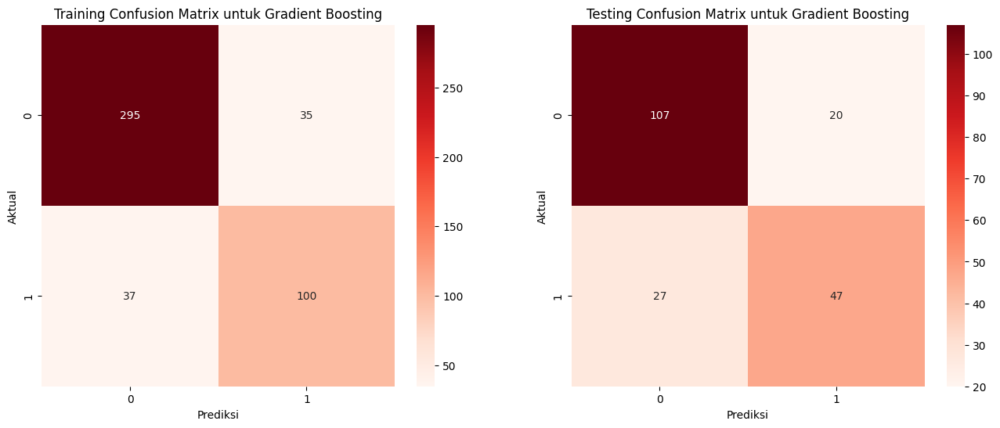

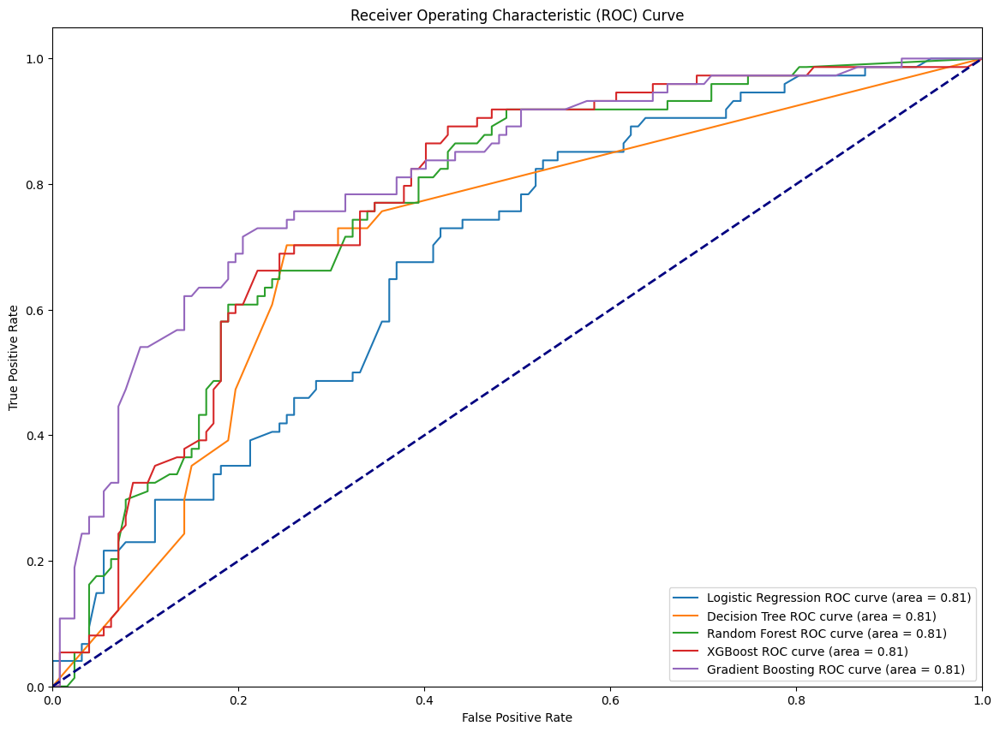

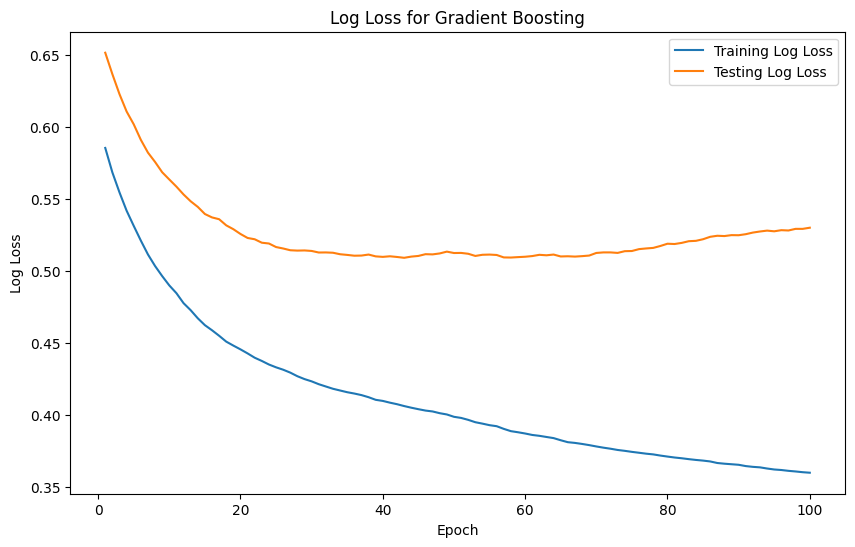

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, learning_curve
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score, roc_curve, log_loss

features = ["Ir_intensity", "Iws_kmh", "PRES", "cbwd", "DEWP", "Ir"]
target = "temp_category"

X = day2[features]
y = day2[target]

# Split data menjadi 70% train dan 30% test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Inisialisasi model
models = {
    "Logistic Regression": LogisticRegression(max_iter=1000),
    "Decision Tree": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier(),
    "XGBoost": XGBClassifier(eval_metric='logloss'),
    "Gradient Boosting": GradientBoostingClassifier()
}

results = {}
metrics = ["accuracy", "precision", "recall", "f1_score", "roc_auc"]

# Train dan evaluasi model
for model_name, model in models.items():
    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    y_proba_train = model.predict_proba(X_train)[:, 1]
    y_proba_test = model.predict_proba(X_test)[:, 1]

    accuracy_train = accuracy_score(y_train, y_pred_train)
    precision_train = precision_score(y_train, y_pred_train)
    recall_train = recall_score(y_train, y_pred_train)
    f1_train = f1_score(y_train, y_pred_train)
    roc_auc_train = roc_auc_score(y_train, y_proba_train)

    accuracy_test = accuracy_score(y_test, y_pred_test)
    precision_test = precision_score(y_test, y_pred_test)
    recall_test = recall_score(y_test, y_pred_test)
    f1_test = f1_score(y_test, y_pred_test)
    roc_auc_test = roc_auc_score(y_test, y_proba_test)

    conf_matrix_train = confusion_matrix(y_train, y_pred_train)
    conf_matrix_test = confusion_matrix(y_test, y_pred_test)

    results[model_name] = {
        "model": model,
        "train": {
            "accuracy": accuracy_train,
            "precision": precision_train,
            "recall": recall_train,
            "f1_score": f1_train,
            "roc_auc": roc_auc_train,
            "confusion_matrix": conf_matrix_train
        },
        "test": {
            "accuracy": accuracy_test,
            "precision": precision_test,
            "recall": recall_test,
            "f1_score": f1_test,
            "roc_auc": roc_auc_test,
            "confusion_matrix": conf_matrix_test
        }
    }

# Membuat DataFrame hasil evaluasi model
metrics_df_train = pd.DataFrame({model_name: [results[model_name]["train"][metric] for metric in metrics] for model_name in models.keys()}, index=metrics)
metrics_df_test = pd.DataFrame({model_name: [results[model_name]["test"][metric] for metric in metrics] for model_name in models.keys()}, index=metrics)

print("Training Metrics:\n", metrics_df_train)
print("Testing Metrics:\n", metrics_df_test)

# Visualisasi metrik untuk semua model
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

metrics_df_train.T.plot(kind='bar', ax=axes[0])
axes[0].set_title('Training Metrics Comparison')
axes[0].set_ylabel('Score')
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=0)
axes[0].legend(loc='lower right')

metrics_df_test.T.plot(kind='bar', ax=axes[1])
axes[1].set_title('Testing Metrics Comparison')
axes[1].set_ylabel('Score')
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=0)
axes[1].legend(loc='lower right')

plt.show()

# Menampilkan Confusion Matrix untuk setiap model
for model_name, result in results.items():
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    sns.heatmap(result["train"]["confusion_matrix"], annot=True, fmt='d', cmap='Reds', xticklabels=[0, 1], yticklabels=[0, 1], ax=axes[0])
    sns.heatmap(result["test"]["confusion_matrix"], annot=True, fmt='d', cmap='Reds', xticklabels=[0, 1], yticklabels=[0, 1], ax=axes[1])
    axes[0].set_xlabel('Prediksi')
    axes[0].set_ylabel('Aktual')
    axes[0].set_title(f'Training Confusion Matrix untuk {model_name}')
    axes[1].set_xlabel('Prediksi')
    axes[1].set_ylabel('Aktual')
    axes[1].set_title(f'Testing Confusion Matrix untuk {model_name}')
    plt.show()

# Menampilkan ROC Curve untuk setiap model
plt.figure(figsize=(14, 10))
for model_name, model in models.items():
    y_proba_test = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_proba_test)
    plt.plot(fpr, tpr, label=f'{model_name} ROC curve (area = {roc_auc_test:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Visualisasi log loss untuk Gradient Boosting
gbr = models["Gradient Boosting"]
n_estimators = gbr.n_estimators
log_loss_train = []
log_loss_test = []

for y_pred_train, y_pred_test in zip(gbr.staged_predict_proba(X_train), gbr.staged_predict_proba(X_test)):
    log_loss_train.append(log_loss(y_train, y_pred_train))
    log_loss_test.append(log_loss(y_test, y_pred_test))

plt.figure(figsize=(10, 6))
plt.plot(range(1, n_estimators + 1), log_loss_train, label='Training Log Loss')
plt.plot(range(1, n_estimators + 1), log_loss_test, label='Testing Log Loss')
plt.xlabel('Epoch')
plt.ylabel('Log Loss')
plt.title('Log Loss for Gradient Boosting')
plt.legend()
plt.show()


### 3 Hari

In [ ]:
day3=pd.read_excel('/content/drive/MyDrive/dataset-4/3Day.xlsx')
d3 = day3.copy()
day3

,date_day,Iws,Ir,pm2.5,PRES,cbwd,DEWP,Temperature,Iws_change,Ir_intensity,pres_change,humidity,heat_index,Iws_kmh,wind_chill,temp_category,remarks
0,2016-07-01,5.2240,2.6790,2.1320,0.8880,2.0,1.492,21.025677,0.1300,50.2250,0.0400,29.516010,65.435460,19.831500,21.344375,1,temp d4
1,2016-07-02,9.4105,4.2870,6.3255,1.9540,2.0,1.736,22.053792,0.3400,77.3400,0.1400,27.356772,67.966073,37.194299,22.397396,1,temp d5
2,2016-07-03,10.4490,5.0230,7.1070,2.5590,3.0,1.888,26.355917,0.2700,121.4650,0.2975,20.449202,78.025505,39.606299,27.858958,1,temp d6
3,2016-07-04,10.5160,5.4250,6.9825,2.8250,3.0,1.980,27.369385,0.3400,129.9225,0.2100,18.488833,80.072961,40.751999,29.197604,1,temp d7
4,2016-07-05,11.0855,5.3580,7.4620,2.7010,3.0,2.010,30.139260,0.4700,133.5350,0.2500,15.876497,83.950486,42.017399,32.905625,1,temp d8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
662,2018-04-24,9.5110,2.0425,7.8355,0.9060,2.0,1.066,7.202521,0.9575,62.4900,0.2800,64.775988,42.414249,54.073799,2.782396,0,temp d666
663,2018-04-25,10.4155,2.1430,9.5585,0.8880,2.0,1.157,8.812437,0.7550,64.1350,0.4300,57.939201,45.279570,52.506900,4.792500,0,temp d667
664,2018-04-26,9.4440,2.1430,8.0130,0.9060,2.5,1.218,10.027365,0.8500,61.9050,0.3900,53.979208,47.289771,49.612500,6.563646,0,temp d668
665,2018-04-27,10.9850,2.5450,9.7190,1.1020,3.0,1.279,11.439469,0.9550,65.6325,0.2900,49.462511,49.535586,51.542101,8.128646,0,temp d669


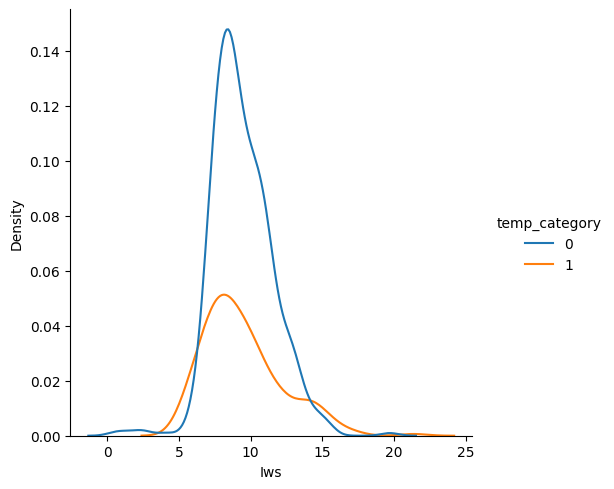

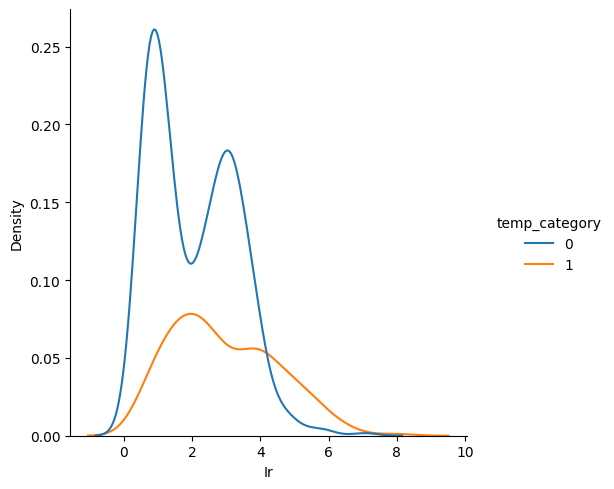

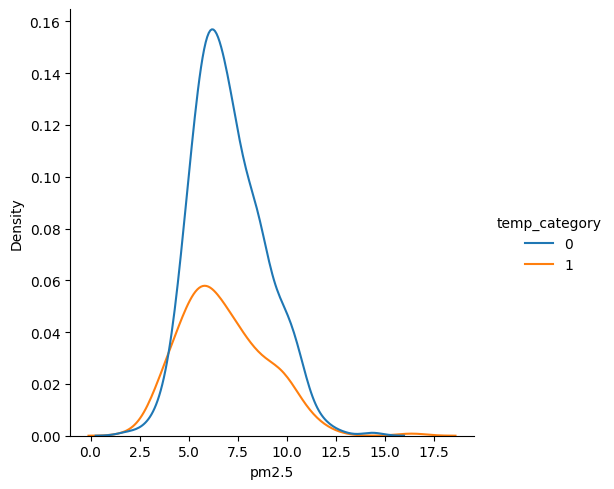

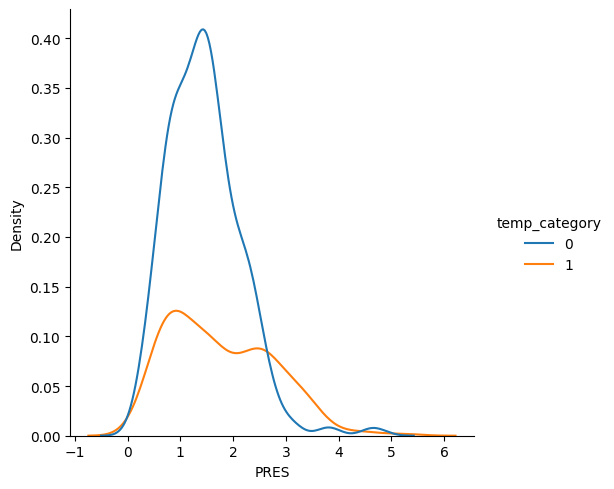

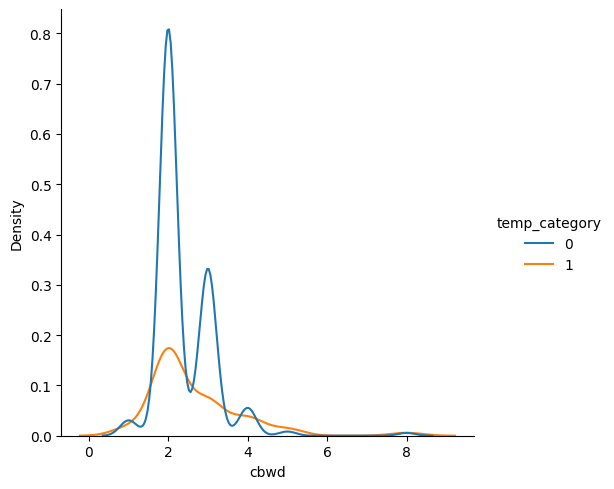

...

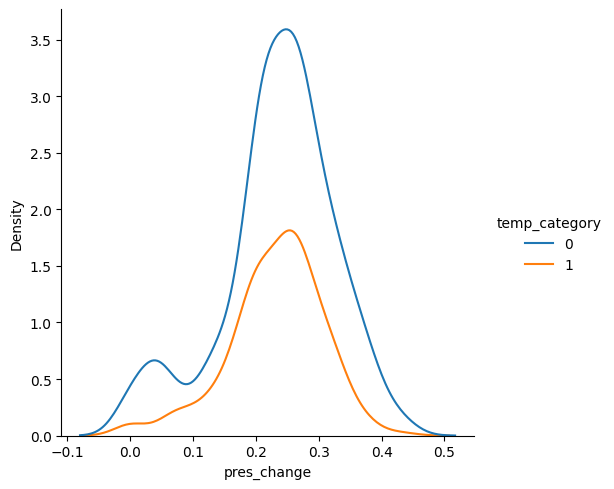

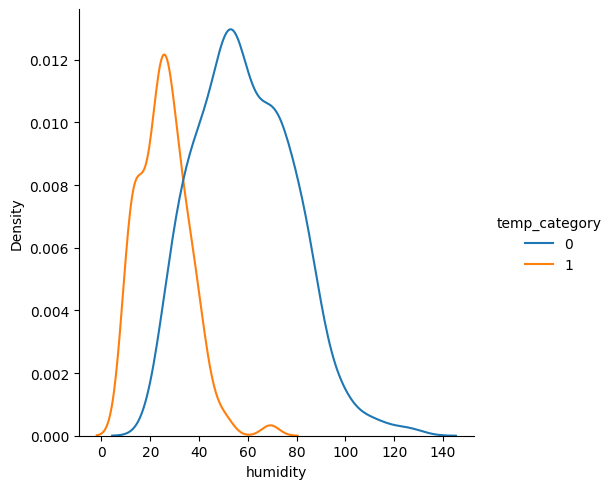

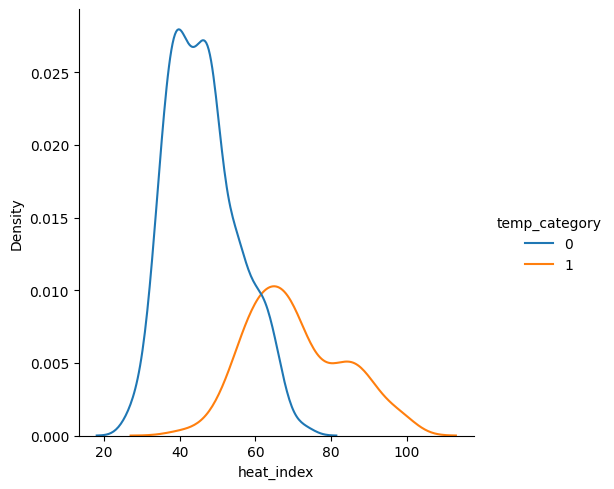

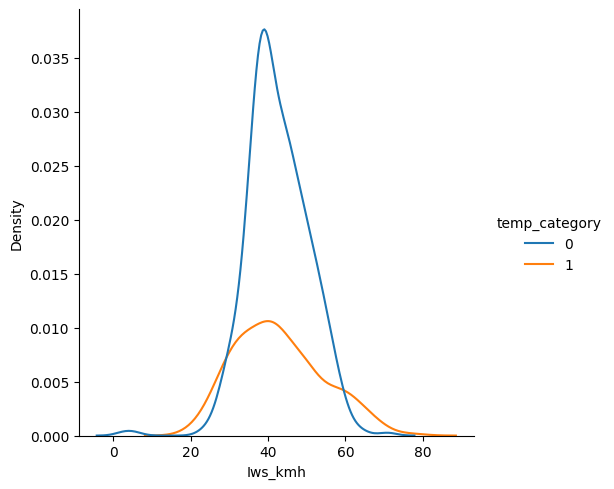

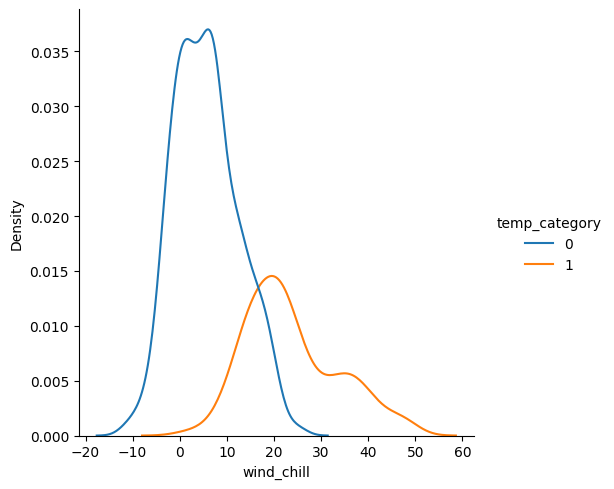

In [ ]:
sns.displot(day3, x= "Iws", hue="temp_category", kind="kde")
sns.displot(day3, x= "Ir", hue="temp_category", kind="kde")
sns.displot(day3, x= "pm2.5", hue="temp_category", kind="kde")
sns.displot(day3, x= "PRES", hue="temp_category", kind="kde")
sns.displot(day3, x= "cbwd", hue="temp_category", kind="kde")
sns.displot(day3, x= "DEWP", hue="temp_category", kind="kde")
sns.displot(day3, x= "Iws_change", hue="temp_category", kind="kde")
sns.displot(day3, x= "Ir_intensity", hue="temp_category", kind="kde")
sns.displot(day3, x= "pres_change", hue="temp_category", kind="kde")
sns.displot(day3, x= "humidity", hue="temp_category", kind="kde")
sns.displot(day3, x= "heat_index", hue="temp_category", kind="kde")
sns.displot(day3, x= "Iws_kmh", hue="temp_category", kind="kde")
sns.displot(day3, x= "wind_chill", hue="temp_category", kind="kde")

#### WoE

##### pm2.5

In [ ]:
def categorize_pm25(value):
    if value < 5:
        return 0  # Excellent
    elif 5 <= value < 6:
        return 1  # Fine
    elif 6 <= value < 8:
        return 2  # Moderate
    else:
        return 3

day3['pm2.5'] = day3['pm2.5'].apply(categorize_pm25)

a = pd.crosstab(day3['pm2.5'], day3['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return ln(df["%nonevent"]/df["%event"])

a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
pm2.5,,,,,,,
0,53,47,100,0.115974,0.223810,-0.657432,0.070895
1,90,37,127,0.196937,0.176190,0.111316,0.002309
2,184,66,250,0.402626,0.314286,0.247705,0.021882
3,130,60,190,0.284464,0.285714,-0.004386,0.000005
Total,457,210,667,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.09509179608023677

In [ ]:
IV = pd.DataFrame()
IV['pm2.5'] = [a["IV"].sum()]

##### Ir

In [ ]:
def categorize_Ir(value):
    if value <= 1:
        return 0  # Basah ekstrem
    elif 1 < value <= 2:
        return 1  # Basah luar biasa
    elif 2< value <=3 :
        return 2  # Basah luar biasa
    elif 3< value :
        return 3  # Basah luar biasa
    else:
        return 3

day3['Ir'] = day3['Ir'].apply(categorize_Ir)

a = pd.crosstab(day3['Ir'], day3['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return ln(df["%nonevent"]/df["%event"])

a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
Ir,,,,,,,
0,123,17,140,0.269147,0.080952,1.201395,0.226096
1,108,52,160,0.236324,0.247619,-0.046688,0.000527
2,96,50,146,0.210066,0.238095,-0.125251,0.003511
3,130,91,221,0.284464,0.433333,-0.420901,0.062659
Total,457,210,667,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.29279299470274145

In [ ]:
IV['ir'] = [a["IV"].sum()]

##### Ir_intensity

In [ ]:
def categorize_Ir_intensity(value):
    if value < 34.9:
        return 0  # Moderate rain
    elif 35.0 <= value < 59.9:
        return 1  # Heavy rain
    elif 60.0 <= value < 99.9:
        return 2  # Rainstorm
    else:
        return 3  # Heavy rainstorm

day3['Ir_intensity'] = day3['Ir_intensity'].apply(categorize_Ir_intensity)

a = pd.crosstab(day3['Ir_intensity'], day3['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return ln(df["%nonevent"]/df["%event"])

a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
Ir_intensity,,,,,,,
0,145,32,177,0.317287,0.152381,0.733422,0.120945
1,85,48,133,0.185996,0.228571,-0.206126,0.008776
2,127,50,177,0.277899,0.238095,0.154588,0.006153
3,100,80,180,0.218818,0.380952,-0.554432,0.089892
Total,457,210,667,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.22576700257869065

In [ ]:
IV['Ir_intensity'] = [a["IV"].sum()]

##### Iws

In [ ]:
def categorize_Iws(value):
    if value < 8:
        return 0  # Good
    elif 8 <= value < 9:
        return 1  # Bad
    elif 9 <= value < 11:
        return 2  # Bad
    else:
        return 3 #very bad

day3['Iws'] = day3['Iws'].apply(categorize_Iws)

a = pd.crosstab(day3['Iws'], day3['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return ln(df["%nonevent"]/df["%event"])

a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
Iws,,,,,,,
0,112,71,183,0.245077,0.338095,-0.321757,0.029929
1,112,38,150,0.245077,0.180952,0.303337,0.019451
2,141,52,193,0.308534,0.247619,0.219940,0.013398
3,92,49,141,0.201313,0.233333,-0.147608,0.004726
Total,457,210,667,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.06750471693692145

In [ ]:
IV['iws'] = [a["IV"].sum()]

##### Iws_kmh

In [ ]:
def categorize_Iws_kmh(value):
    if value <= 35:
        return 0  # Fresh breeze
    elif 35 < value <= 40:
        return 1  # Gale
    elif 41 <= value <= 47:
        return 2  # Strong gale
    elif 48 <= value <= 55:
        return 3  # Storm
    else:
        return 4  # Hurricane

day3['Iws_kmh'] = day3['Iws_kmh'].apply(categorize_Iws_kmh)

a = pd.crosstab(day3['Iws_kmh'], day3['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return np.log(df["%nonevent"]/df["%event"])

a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
Iws_kmh,,,,,,,
0,61,60,121,0.133479,0.285714,-0.761047,0.115858
1,127,34,161,0.277899,0.161905,0.540251,0.062666
2,118,36,154,0.258206,0.171429,0.409590,0.035543
3,86,30,116,0.188184,0.142857,0.275574,0.012491
4,65,50,115,0.142232,0.238095,-0.515212,0.049390
Total,457,210,667,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.27594788906305906

In [ ]:
IV['Iws_kmh'] = [a["IV"].sum()]

##### PRES

In [ ]:
day3['PRES'].unique()

array([0.88800001, 1.954     , 2.55900002, 2.82499993, 2.70099998,
       2.4519999 , 2.29199994, 2.13199997, 1.56400001, 1.66999996,
       1.24399996, 1.4745    , 1.24400002, 0.97750002, 0.81699997,
       0.95899999, 1.01300001, 0.83499998, 0.78200001, 1.77650005,
       1.45700002, 1.61699998, 1.35000002, 0.8705    , 0.426     ,
       0.49700001, 0.53299999, 0.60399997, 0.551     , 1.23214999,
       2.66499996, 3.19799995, 3.23399997, 3.33999991, 3.37599993,
       3.48200011, 3.55299997, 3.44700003, 3.16300011, 3.60699999,
       2.68299997, 2.75400007, 2.5940001 , 2.87800002, 2.91400003,
       2.7895    , 3.21599996, 3.05599999, 2.57650006, 3.12700009,
       3.41100001, 2.71850002, 3.10950005, 2.86049998, 3.19850004,
       2.523     , 2.61200011, 2.48699999, 2.96699989, 1.528     ,
       1.63499999, 2.27399993, 2.505     , 2.38100004, 1.759     ,
       1.74100006, 2.23900008, 2.4339999 , 2.34500003, 1.43900001,
       2.30999994, 0.72850001, 1.49199998, 2.46949995, 2.09699

In [ ]:
def categorize_PRES(value):
    if value <= 1:
        return 0
    elif 1 < value <= 1.5:
        return 1
    elif 1.5 < value <= 2.2:
        return 2
    else:
        return 3

day3['PRES'] = day3['PRES'].apply(categorize_PRES)

a = pd.crosstab(day3['PRES'], day3['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return np.log(df["%nonevent"]/df["%event"])

a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
PRES,,,,,,,
0,129,65,194,0.282276,0.309524,-0.092151,0.002511
1,132,34,166,0.288840,0.161905,0.578866,0.073479
2,128,36,164,0.280088,0.171429,0.490935,0.053345
3,68,75,143,0.148796,0.357143,-0.875556,0.182419
Total,457,210,667,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.31175301396832483

In [ ]:
IV['PRES'] = [a["IV"].sum()]

##### cbwd

In [ ]:
day3['cbwd'].unique()

array([2. , 3. , 3.5, 4. , 5. , 4.5, 1. , 1.5, 2.5, 8. ])

In [ ]:
def categorize_cbwd(value):
    if value <= 1.9:
        return 0
    elif 1.9 < value <= 2:
        return 1
    elif value > 3:
        return 3
    else:
        return 2

day3['cbwd'] = day3['cbwd'].apply(categorize_cbwd)

a = pd.crosstab(day3['cbwd'], day3['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return np.log(df["%nonevent"]/df["%event"])

a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
cbwd,,,,,,,
0,12,11,23,0.026258,0.052381,-0.690564,0.018039
1,293,116,409,0.641138,0.552381,0.149007,0.013225
2,126,45,171,0.275711,0.214286,0.252044,0.015482
3,26,38,64,0.056893,0.180952,-1.157065,0.143545
Total,457,210,667,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.1902917725742615

In [ ]:
IV['cbwd'] = [a["IV"].sum()]

##### DEWP

In [ ]:
day3['DEWP'].unique()

array([ 1.49199998,  1.73599994,  1.88800001,  1.98000002,  2.00999999,
        1.79700005,  1.64499998,  1.67499995,  1.70599997,  1.30999994,
        1.06599998,  1.18799996,  1.03600001,  0.99000001,  1.21800005,
        1.005     ,  1.2335    ,  1.097     ,  1.32499999,  1.15699995,
        1.37100005,  1.29449999,  1.44700003,  1.40100002,  1.477     ,
        1.24899995,  1.27900004,  1.34000003,  0.88300002,  0.91399997,
        1.12699997,  1.53799999,  1.43200004,  1.46200001,  1.61399996,
        1.20300001,  0.94400001,  0.97500002,  0.82200003,  1.0205    ,
        1.051     ,  1.08149999,  0.70099998,  0.85299999,  0.8985    ,
        0.63999999,  0.73100001,  0.95950001,  0.51800001,  0.71599999,
        0.60900003, -0.85299999, -1.03600001, -1.005     , -0.67000002,
       -0.792     , -0.7615    ,  0.579     , -0.73100001, -0.71599999,
       -0.99000001, -0.54799998, -0.97500002, -0.94400001, -0.655     ,
       -0.8985    , -0.59400001, -0.60900003,  0.67000002,  0.53

In [ ]:
def categorize_DEWP(value):
    if value < 0:
        return 0
    elif value > 1:
        return 2
    else:
        return 1

day3['DEWP'] = day3['DEWP'].apply(categorize_DEWP)

a = pd.crosstab(day3['DEWP'], day3['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return np.log(df["%nonevent"]/df["%event"])

a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
DEWP,,,,,,,
0,32,37,69,0.070022,0.176190,-0.922758,0.097968
1,248,50,298,0.542670,0.238095,0.823830,0.250917
2,177,123,300,0.387309,0.585714,-0.413610,0.082063
Total,457,210,667,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.43094805202408293

In [ ]:
IV['DEWP'] = [a["IV"].sum()]

#### Result

In [ ]:
woe = IV.T.sort_values(by=0, ascending=False)
woe

,0
DEWP,0.430948
PRES,0.311753
ir,0.292793
Iws_kmh,0.275948
Ir_intensity,0.225767
cbwd,0.190292
pm2.5,0.095092
iws,0.067505


Training Metrics:
            Logistic Regression  Decision Tree  Random Forest   XGBoost  \
accuracy              0.699571       0.886266       0.886266  0.881974   
precision             0.500000       0.822222       0.788079  0.785235   
recall                0.042857       0.792857       0.850000  0.835714   
f1_score              0.078947       0.807273       0.817869  0.809689   
roc_auc               0.650986       0.961656       0.954163  0.953725   

           Gradient Boosting  
accuracy            0.830472  
precision           0.719424  
recall              0.714286  
f1_score            0.716846  
roc_auc             0.898291  
Testing Metrics:
            Logistic Regression  Decision Tree  Random Forest   XGBoost  \
accuracy              0.661692       0.721393       0.751244  0.716418   
precision             0.600000       0.625000       0.672414  0.600000   
recall                0.085714       0.500000       0.557143  0.557143   
f1_score              0.150000      

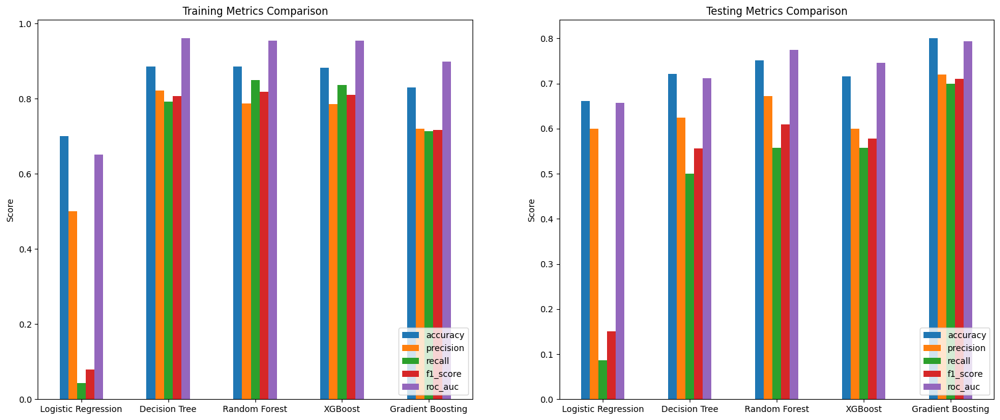

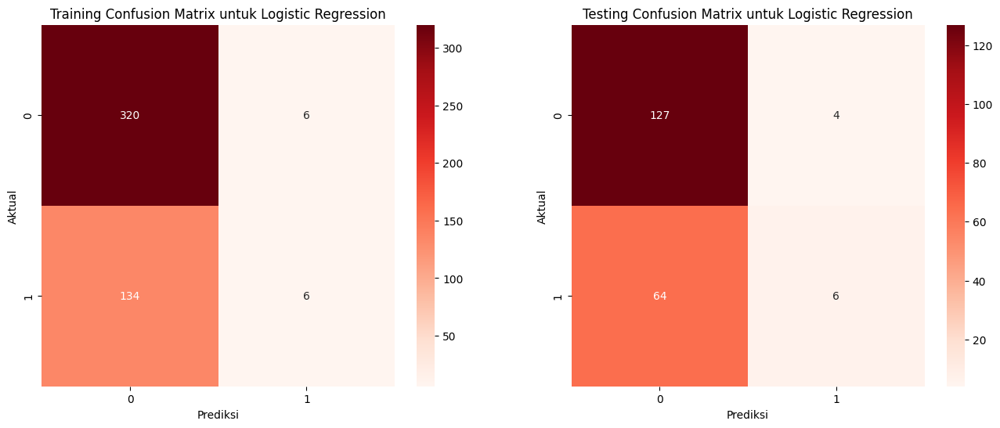

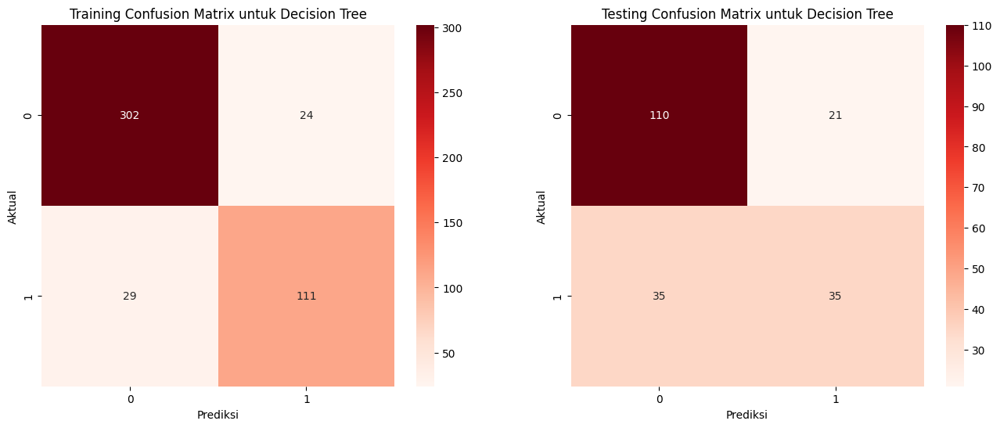

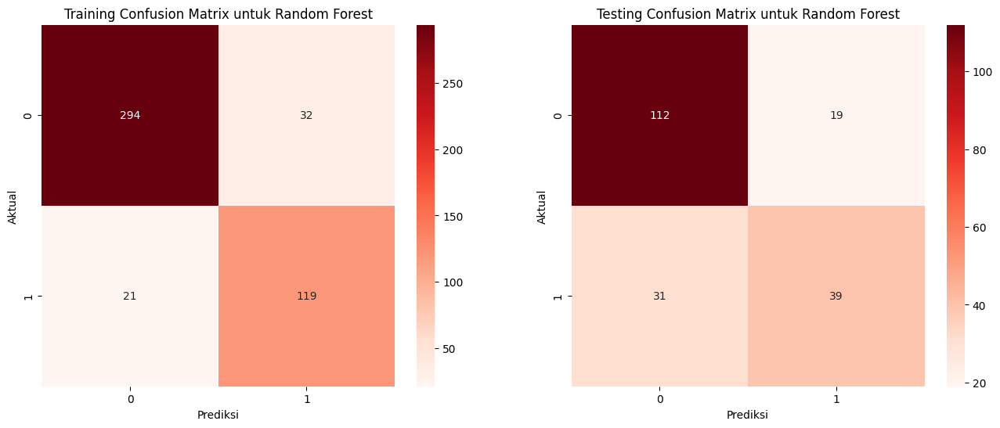

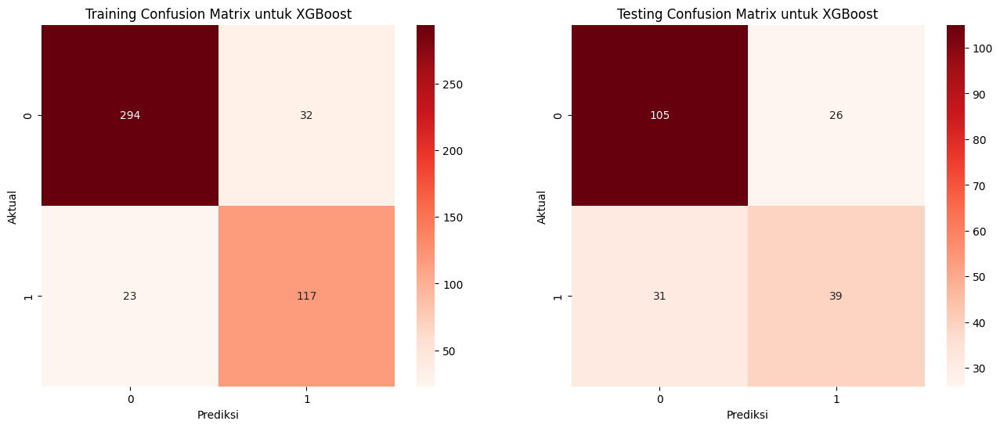

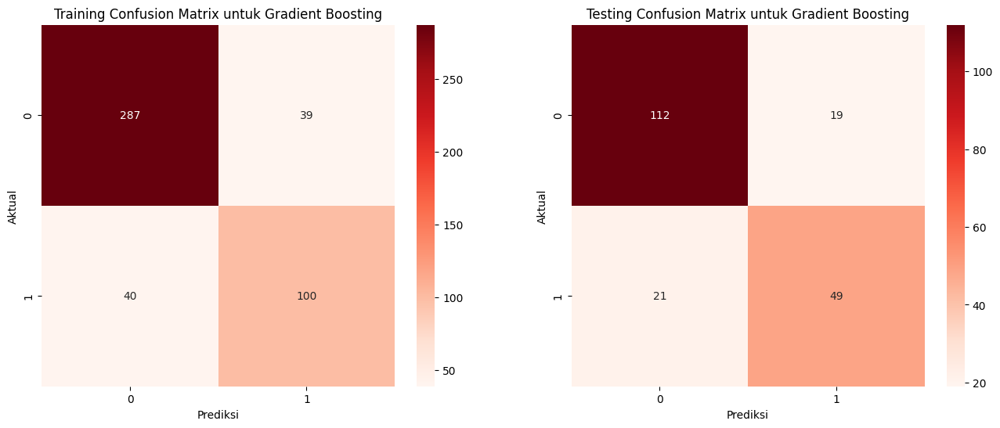

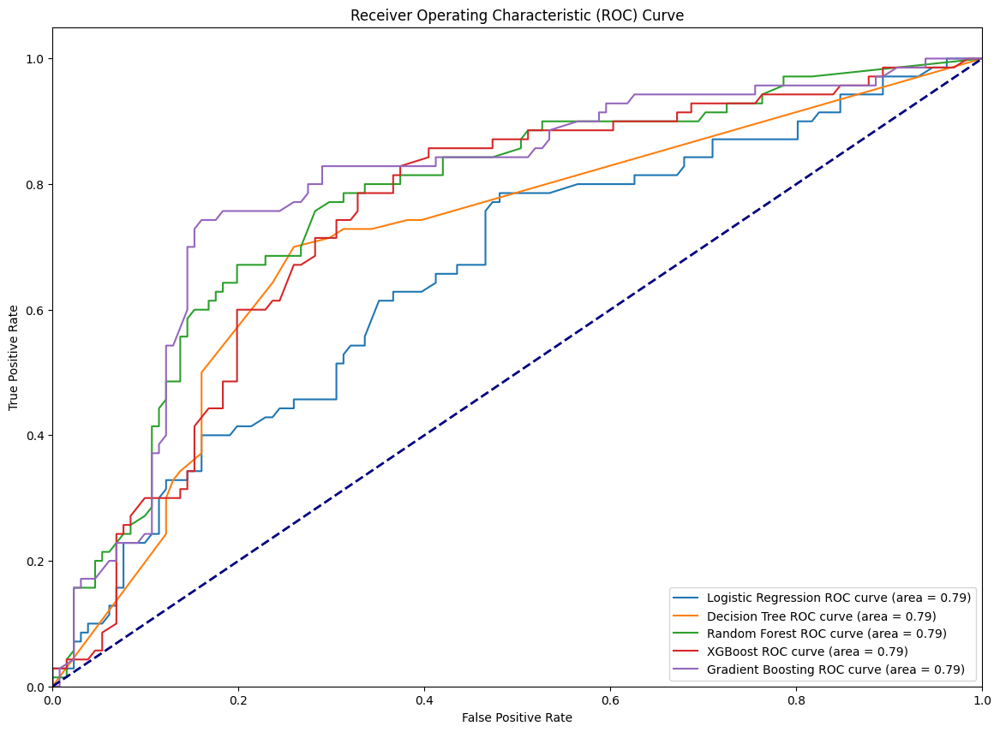

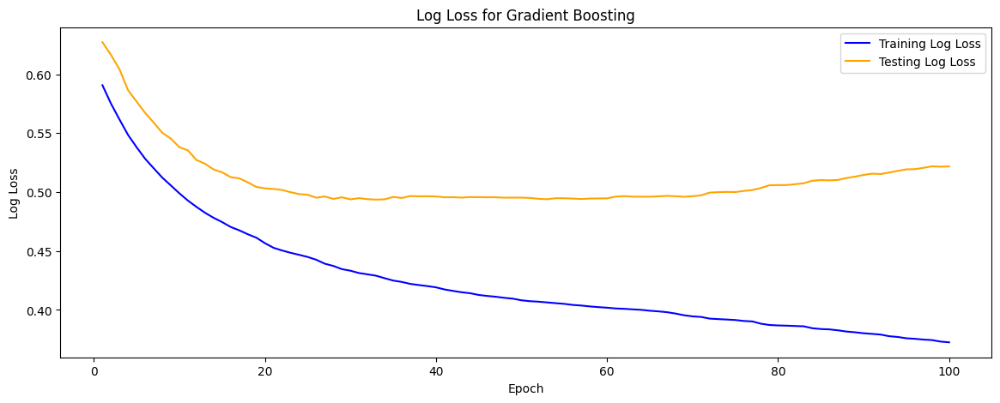

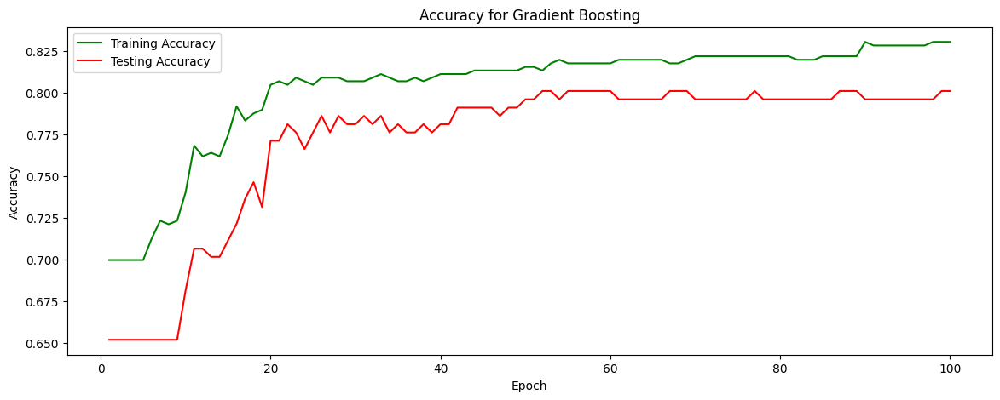

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, learning_curve, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score, roc_curve, log_loss

features = ["Ir_intensity", "Iws_kmh", "PRES", "cbwd", "DEWP", "Ir"]
target = "temp_category"

X = day3[features]
y = day3[target]

# Split data menjadi 70% train dan 30% test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Inisialisasi model
models = {
    "Logistic Regression": LogisticRegression(max_iter=1000),
    "Decision Tree": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier(),
    "XGBoost": XGBClassifier(eval_metric='logloss'),
    "Gradient Boosting": GradientBoostingClassifier()
}

results = {}
metrics = ["accuracy", "precision", "recall", "f1_score", "roc_auc"]

# Train dan evaluasi model
for model_name, model in models.items():
    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    y_proba_train = model.predict_proba(X_train)[:, 1]
    y_proba_test = model.predict_proba(X_test)[:, 1]

    accuracy_train = accuracy_score(y_train, y_pred_train)
    precision_train = precision_score(y_train, y_pred_train)
    recall_train = recall_score(y_train, y_pred_train)
    f1_train = f1_score(y_train, y_pred_train)
    roc_auc_train = roc_auc_score(y_train, y_proba_train)

    accuracy_test = accuracy_score(y_test, y_pred_test)
    precision_test = precision_score(y_test, y_pred_test)
    recall_test = recall_score(y_test, y_pred_test)
    f1_test = f1_score(y_test, y_pred_test)
    roc_auc_test = roc_auc_score(y_test, y_proba_test)

    conf_matrix_train = confusion_matrix(y_train, y_pred_train)
    conf_matrix_test = confusion_matrix(y_test, y_pred_test)

    results[model_name] = {
        "model": model,
        "train": {
            "accuracy": accuracy_train,
            "precision": precision_train,
            "recall": recall_train,
            "f1_score": f1_train,
            "roc_auc": roc_auc_train,
            "confusion_matrix": conf_matrix_train
        },
        "test": {
            "accuracy": accuracy_test,
            "precision": precision_test,
            "recall": recall_test,
            "f1_score": f1_test,
            "roc_auc": roc_auc_test,
            "confusion_matrix": conf_matrix_test
        }
    }

# Membuat DataFrame hasil evaluasi model
metrics_df_train = pd.DataFrame({model_name: [results[model_name]["train"][metric] for metric in metrics] for model_name in models.keys()}, index=metrics)
metrics_df_test = pd.DataFrame({model_name: [results[model_name]["test"][metric] for metric in metrics] for model_name in models.keys()}, index=metrics)

print("Training Metrics:\n", metrics_df_train)
print("Testing Metrics:\n", metrics_df_test)

# Visualisasi metrik untuk semua model
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

metrics_df_train.T.plot(kind='bar', ax=axes[0])
axes[0].set_title('Training Metrics Comparison')
axes[0].set_ylabel('Score')
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=0)
axes[0].legend(loc='lower right')

metrics_df_test.T.plot(kind='bar', ax=axes[1])
axes[1].set_title('Testing Metrics Comparison')
axes[1].set_ylabel('Score')
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=0)
axes[1].legend(loc='lower right')

plt.show()

# Menampilkan Confusion Matrix untuk setiap model
for model_name, result in results.items():
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    sns.heatmap(result["train"]["confusion_matrix"], annot=True, fmt='d', cmap='Reds', xticklabels=[0, 1], yticklabels=[0, 1], ax=axes[0])
    sns.heatmap(result["test"]["confusion_matrix"], annot=True, fmt='d', cmap='Reds', xticklabels=[0, 1], yticklabels=[0, 1], ax=axes[1])
    axes[0].set_xlabel('Prediksi')
    axes[0].set_ylabel('Aktual')
    axes[0].set_title(f'Training Confusion Matrix untuk {model_name}')
    axes[1].set_xlabel('Prediksi')
    axes[1].set_ylabel('Aktual')
    axes[1].set_title(f'Testing Confusion Matrix untuk {model_name}')
    plt.show()

# Menampilkan ROC Curve untuk setiap model
plt.figure(figsize=(14, 10))
for model_name, model in models.items():
    y_proba_test = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_proba_test)
    plt.plot(fpr, tpr, label=f'{model_name} ROC curve (area = {roc_auc_test:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Visualisasi log loss untuk Gradient Boosting
gbr = models["Gradient Boosting"]
n_estimators = gbr.n_estimators
log_loss_train = []
log_loss_test = []

for y_pred_train, y_pred_test in zip(gbr.staged_predict_proba(X_train), gbr.staged_predict_proba(X_test)):
    log_loss_train.append(log_loss(y_train, y_pred_train))
    log_loss_test.append(log_loss(y_test, y_pred_test))

plt.figure(figsize=(14, 5))
plt.plot(range(1, n_estimators + 1), log_loss_train, label='Training Log Loss', color='blue')
plt.plot(range(1, n_estimators + 1), log_loss_test, label='Testing Log Loss', color='orange')
plt.xlabel('Epoch')
plt.ylabel('Log Loss')
plt.title('Log Loss for Gradient Boosting')
plt.legend()
plt.show()

# Visualisasi akurasi untuk Gradient Boosting
accuracy_train = []
accuracy_test = []

for y_pred_train, y_pred_test in zip(gbr.staged_predict(X_train), gbr.staged_predict(X_test)):
    accuracy_train.append(accuracy_score(y_train, y_pred_train))
    accuracy_test.append(accuracy_score(y_test, y_pred_test))

plt.figure(figsize=(14, 5))
plt.plot(range(1, n_estimators + 1), accuracy_train, label='Training Accuracy', color='green')
plt.plot(range(1, n_estimators + 1), accuracy_test, label='Testing Accuracy', color='red')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy for Gradient Boosting')
plt.legend()
plt.show()


Training Metrics:
            Logistic Regression  Decision Tree  Random Forest   XGBoost  \
accuracy              0.727468            1.0            1.0  0.997854   
precision             0.675676            1.0            1.0  0.992908   
recall                0.178571            1.0            1.0  1.000000   
f1_score              0.282486            1.0            1.0  0.996441   
roc_auc               0.705894            1.0            1.0  1.000000   

           Gradient Boosting  
accuracy            0.950644  
precision           0.968000  
recall              0.864286  
f1_score            0.913208  
roc_auc             0.991039  
Testing Metrics:
            Logistic Regression  Decision Tree  Random Forest   XGBoost  \
accuracy              0.711443       0.761194       0.820896  0.800995   
precision             0.772727       0.666667       0.814815  0.777778   
recall                0.242857       0.628571       0.628571  0.600000   
f1_score              0.369565      

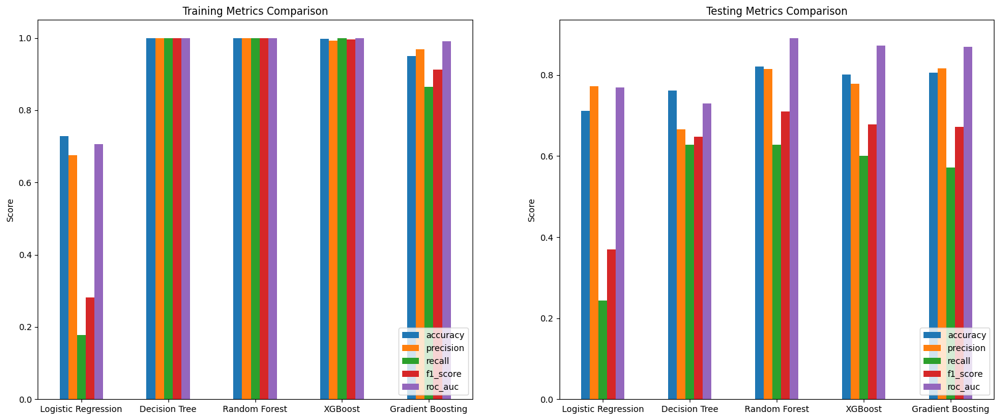

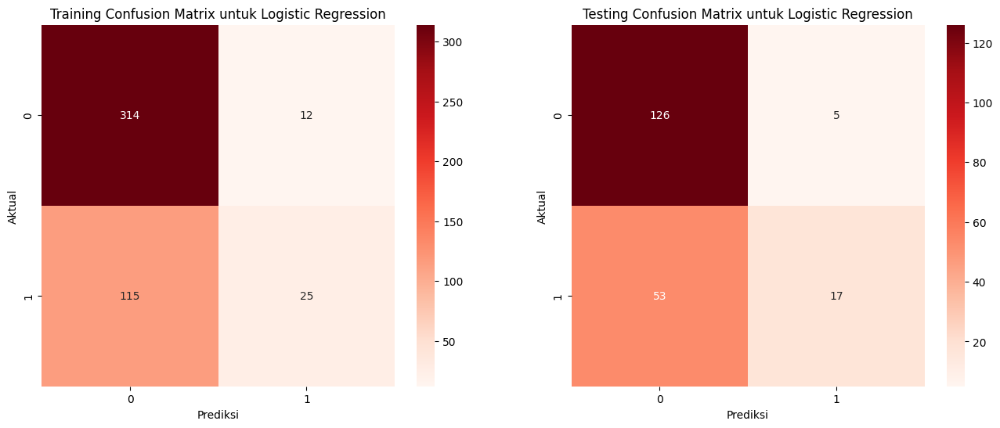

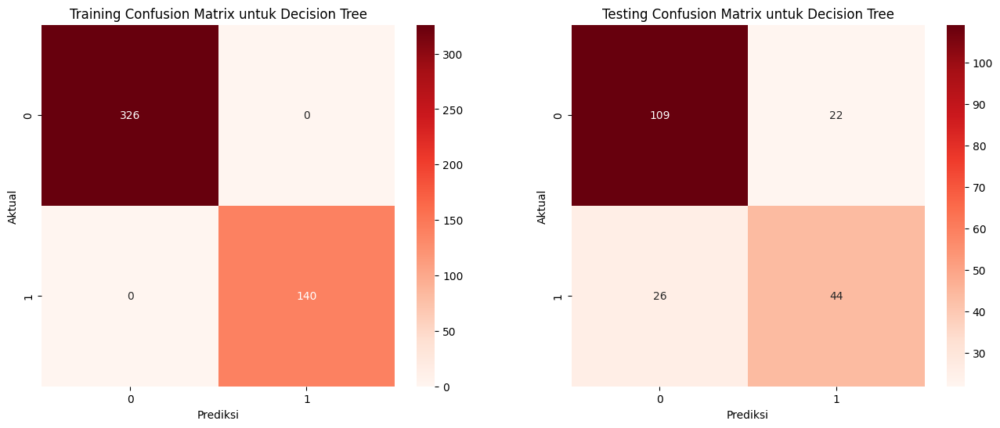

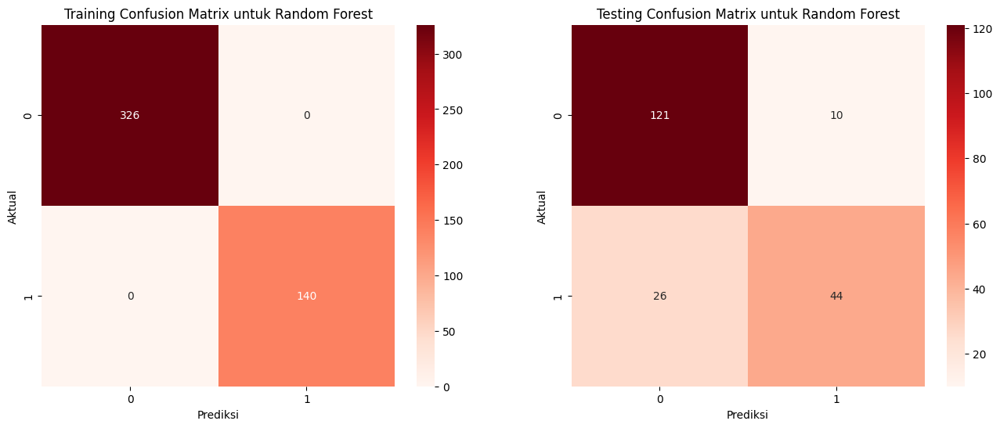

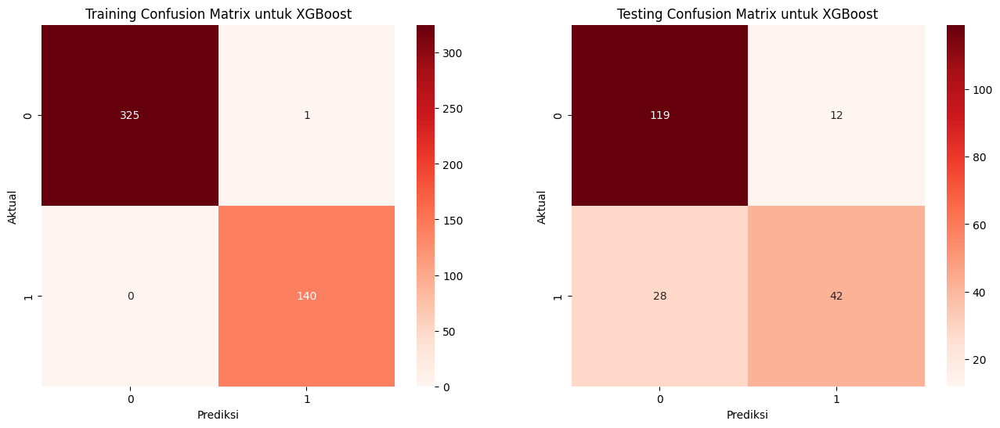

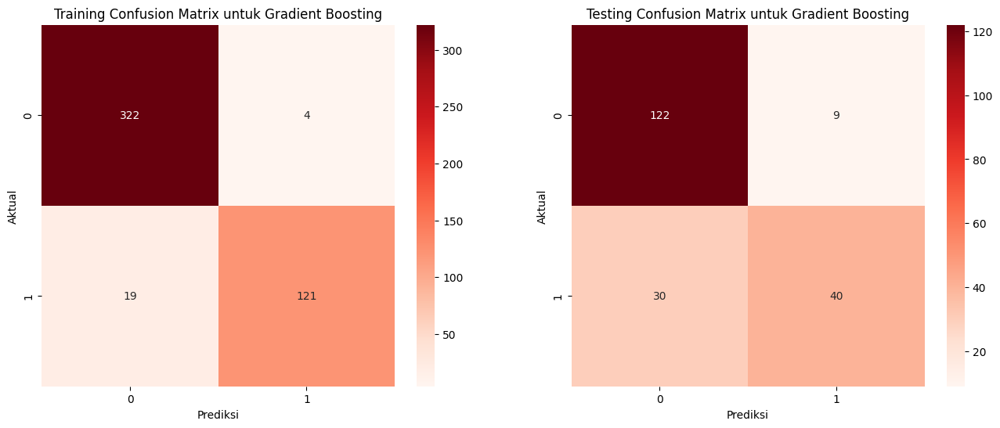

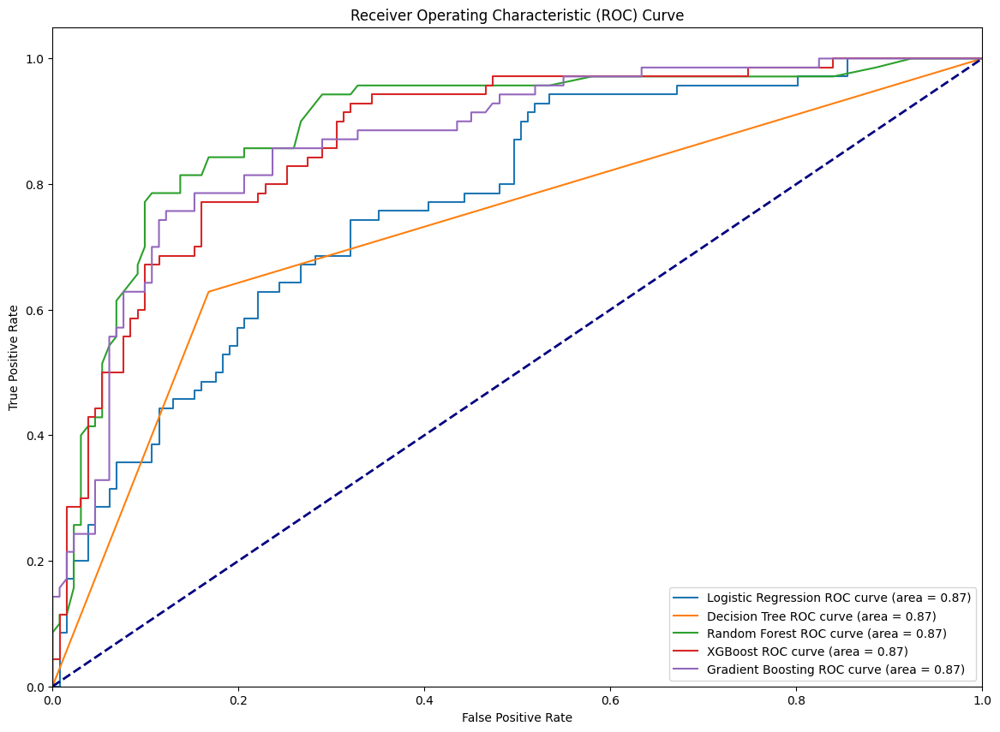

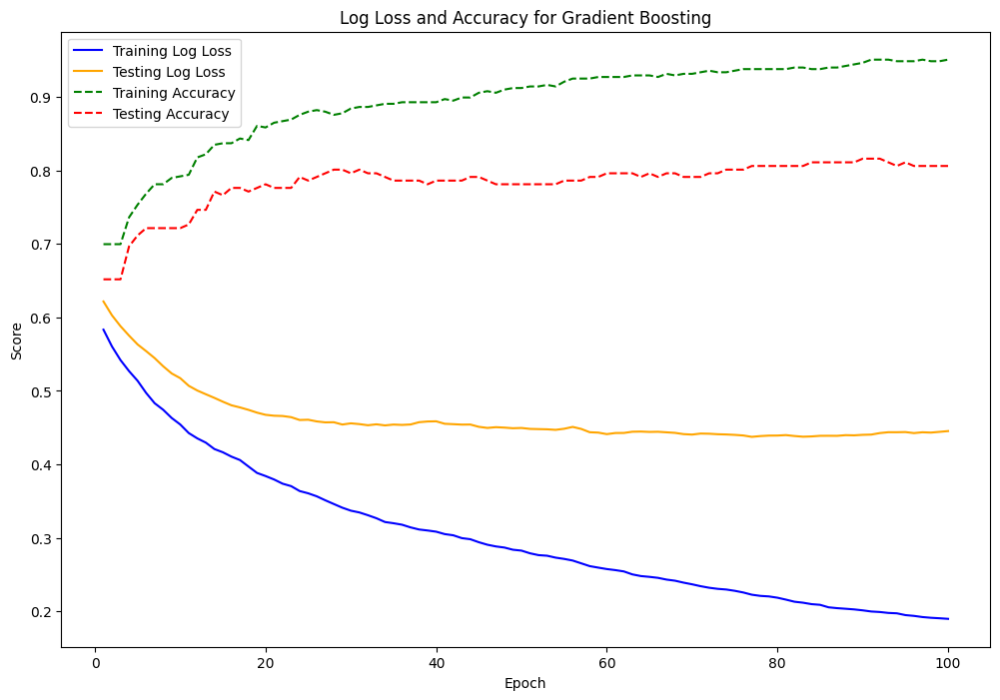

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, learning_curve, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score, roc_curve, log_loss

features = ["Ir_intensity", "Iws_kmh", "PRES", "cbwd", "DEWP", "Ir"]
target = "temp_category"

X = d3[features]
y = d3[target]

# Split data menjadi 70% train dan 30% test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Inisialisasi model
models = {
    "Logistic Regression": LogisticRegression(max_iter=1000),
    "Decision Tree": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier(),
    "XGBoost": XGBClassifier(eval_metric='logloss'),
    "Gradient Boosting": GradientBoostingClassifier()
}

results = {}
metrics = ["accuracy", "precision", "recall", "f1_score", "roc_auc"]

# Train dan evaluasi model
for model_name, model in models.items():
    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    y_proba_train = model.predict_proba(X_train)[:, 1]
    y_proba_test = model.predict_proba(X_test)[:, 1]

    accuracy_train = accuracy_score(y_train, y_pred_train)
    precision_train = precision_score(y_train, y_pred_train)
    recall_train = recall_score(y_train, y_pred_train)
    f1_train = f1_score(y_train, y_pred_train)
    roc_auc_train = roc_auc_score(y_train, y_proba_train)

    accuracy_test = accuracy_score(y_test, y_pred_test)
    precision_test = precision_score(y_test, y_pred_test)
    recall_test = recall_score(y_test, y_pred_test)
    f1_test = f1_score(y_test, y_pred_test)
    roc_auc_test = roc_auc_score(y_test, y_proba_test)

    conf_matrix_train = confusion_matrix(y_train, y_pred_train)
    conf_matrix_test = confusion_matrix(y_test, y_pred_test)

    results[model_name] = {
        "model": model,
        "train": {
            "accuracy": accuracy_train,
            "precision": precision_train,
            "recall": recall_train,
            "f1_score": f1_train,
            "roc_auc": roc_auc_train,
            "confusion_matrix": conf_matrix_train
        },
        "test": {
            "accuracy": accuracy_test,
            "precision": precision_test,
            "recall": recall_test,
            "f1_score": f1_test,
            "roc_auc": roc_auc_test,
            "confusion_matrix": conf_matrix_test
        }
    }

# Membuat DataFrame hasil evaluasi model
metrics_df_train = pd.DataFrame({model_name: [results[model_name]["train"][metric] for metric in metrics] for model_name in models.keys()}, index=metrics)
metrics_df_test = pd.DataFrame({model_name: [results[model_name]["test"][metric] for metric in metrics] for model_name in models.keys()}, index=metrics)

print("Training Metrics:\n", metrics_df_train)
print("Testing Metrics:\n", metrics_df_test)

# Visualisasi metrik untuk semua model
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

metrics_df_train.T.plot(kind='bar', ax=axes[0])
axes[0].set_title('Training Metrics Comparison')
axes[0].set_ylabel('Score')
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=0)
axes[0].legend(loc='lower right')

metrics_df_test.T.plot(kind='bar', ax=axes[1])
axes[1].set_title('Testing Metrics Comparison')
axes[1].set_ylabel('Score')
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=0)
axes[1].legend(loc='lower right')

plt.show()

# Menampilkan Confusion Matrix untuk setiap model
for model_name, result in results.items():
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    sns.heatmap(result["train"]["confusion_matrix"], annot=True, fmt='d', cmap='Reds', xticklabels=[0, 1], yticklabels=[0, 1], ax=axes[0])
    sns.heatmap(result["test"]["confusion_matrix"], annot=True, fmt='d', cmap='Reds', xticklabels=[0, 1], yticklabels=[0, 1], ax=axes[1])
    axes[0].set_xlabel('Prediksi')
    axes[0].set_ylabel('Aktual')
    axes[0].set_title(f'Training Confusion Matrix untuk {model_name}')
    axes[1].set_xlabel('Prediksi')
    axes[1].set_ylabel('Aktual')
    axes[1].set_title(f'Testing Confusion Matrix untuk {model_name}')
    plt.show()

# Menampilkan ROC Curve untuk setiap model
plt.figure(figsize=(14, 10))
for model_name, model in models.items():
    y_proba_test = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_proba_test)
    plt.plot(fpr, tpr, label=f'{model_name} ROC curve (area = {roc_auc_test:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Visualisasi log loss dan akurasi untuk Gradient Boosting
gbr = models["Gradient Boosting"]
n_estimators = gbr.n_estimators
log_loss_train = []
log_loss_test = []
accuracy_train = []
accuracy_test = []

for y_pred_train, y_pred_test in zip(gbr.staged_predict_proba(X_train), gbr.staged_predict_proba(X_test)):
    log_loss_train.append(log_loss(y_train, y_pred_train))
    log_loss_test.append(log_loss(y_test, y_pred_test))
    accuracy_train.append(accuracy_score(y_train, np.argmax(y_pred_train, axis=1)))
    accuracy_test.append(accuracy_score(y_test, np.argmax(y_pred_test, axis=1)))

plt.figure(figsize=(12, 8))
plt.plot(range(1, n_estimators + 1), log_loss_train, label='Training Log Loss', color='blue')
plt.plot(range(1, n_estimators + 1), log_loss_test, label='Testing Log Loss', color='orange')
plt.plot(range(1, n_estimators + 1), accuracy_train, label='Training Accuracy', linestyle='dashed', color='green')
plt.plot(range(1, n_estimators + 1), accuracy_test, label='Testing Accuracy', linestyle='dashed', color='red')
plt.xlabel('Epoch')
plt.ylabel('Score')
plt.title('Log Loss and Accuracy for Gradient Boosting')
plt.legend()
plt.show()


Training Metrics:
            Logistic Regression  Decision Tree  Random Forest   XGBoost  \
accuracy              0.699571       0.886266       0.886266  0.881974   
precision             0.500000       0.822222       0.795918  0.785235   
recall                0.042857       0.792857       0.835714  0.835714   
f1_score              0.078947       0.807273       0.815331  0.809689   
roc_auc               0.650986       0.961656       0.953550  0.953725   

           Gradient Boosting  
accuracy            0.830472  
precision           0.719424  
recall              0.714286  
f1_score            0.716846  
roc_auc             0.898291  
Testing Metrics:
            Logistic Regression  Decision Tree  Random Forest   XGBoost  \
accuracy              0.661692       0.686567       0.736318  0.716418   
precision             0.600000       0.561404       0.654545  0.600000   
recall                0.085714       0.457143       0.514286  0.557143   
f1_score              0.150000      

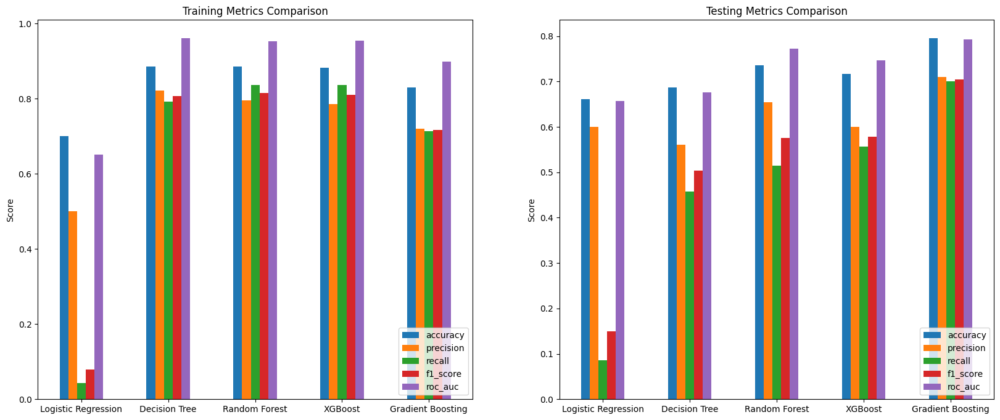

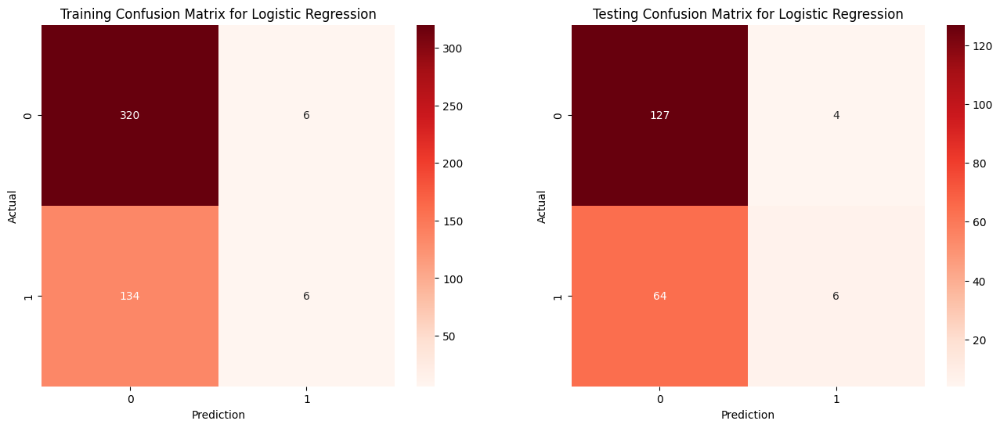

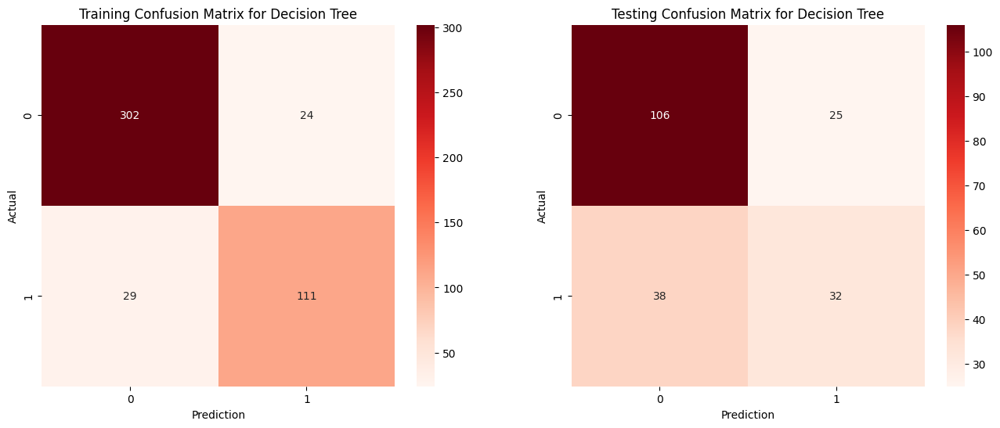

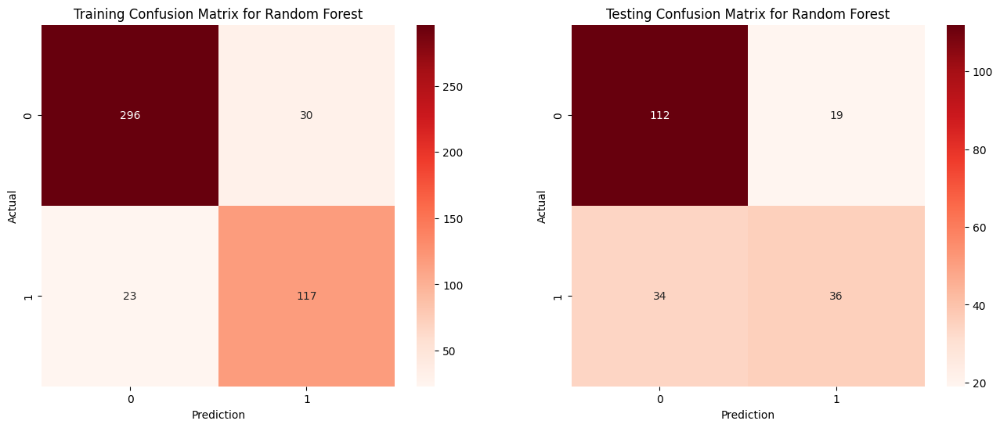

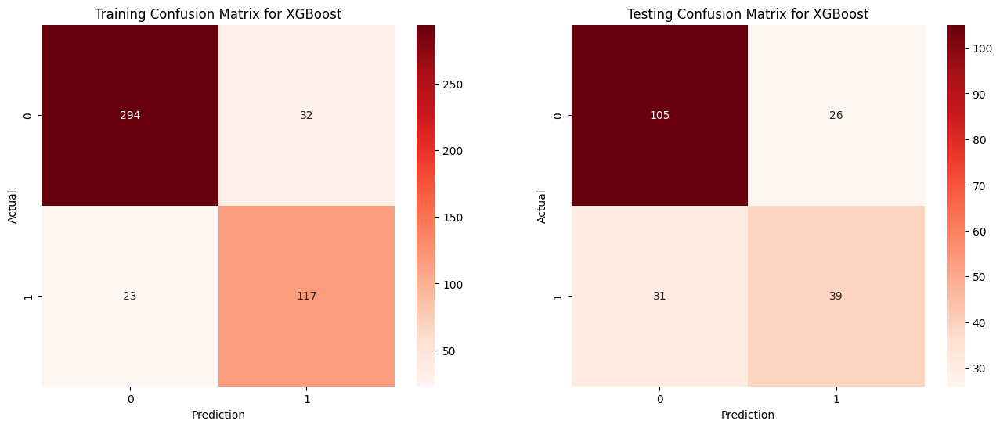

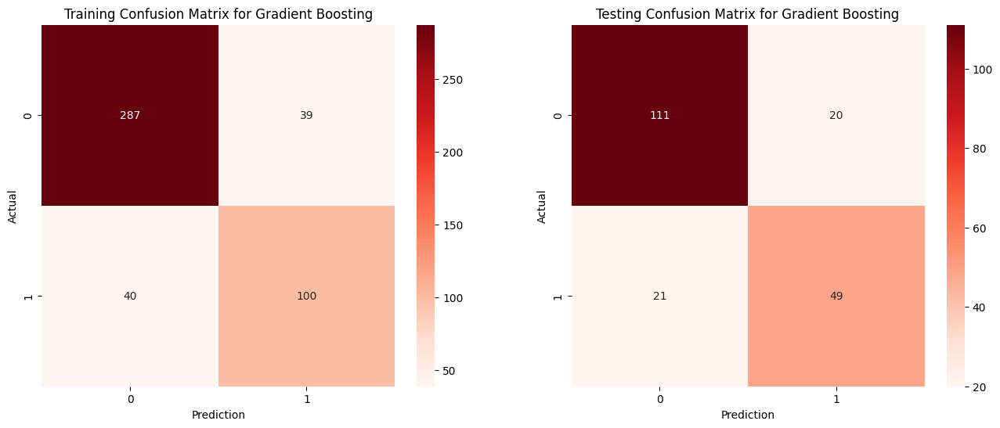

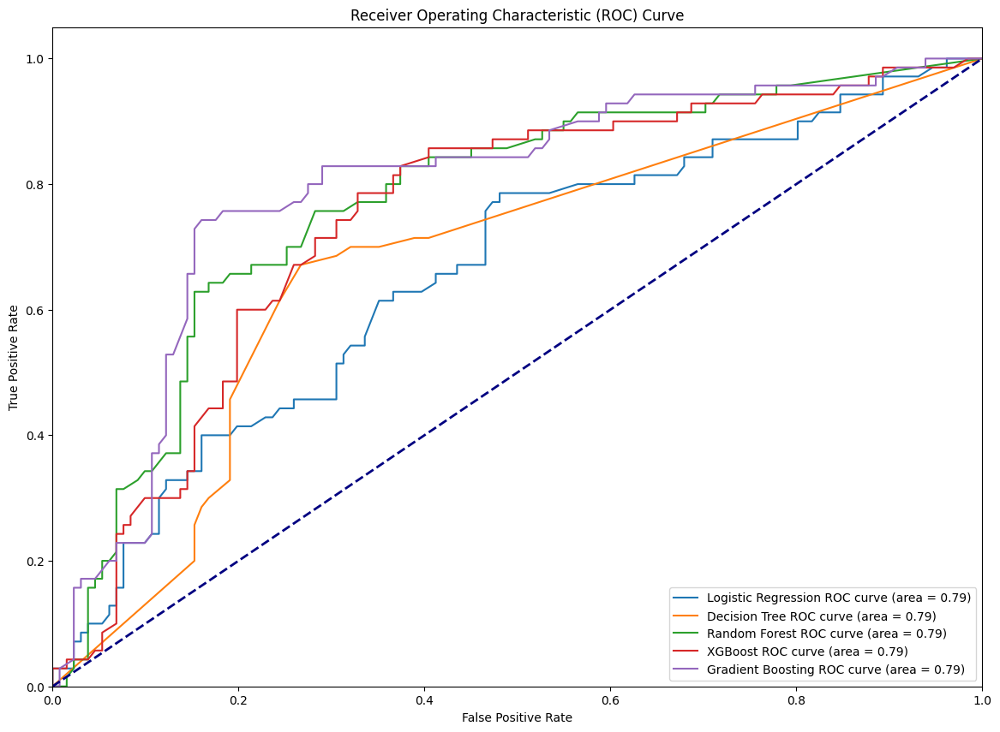

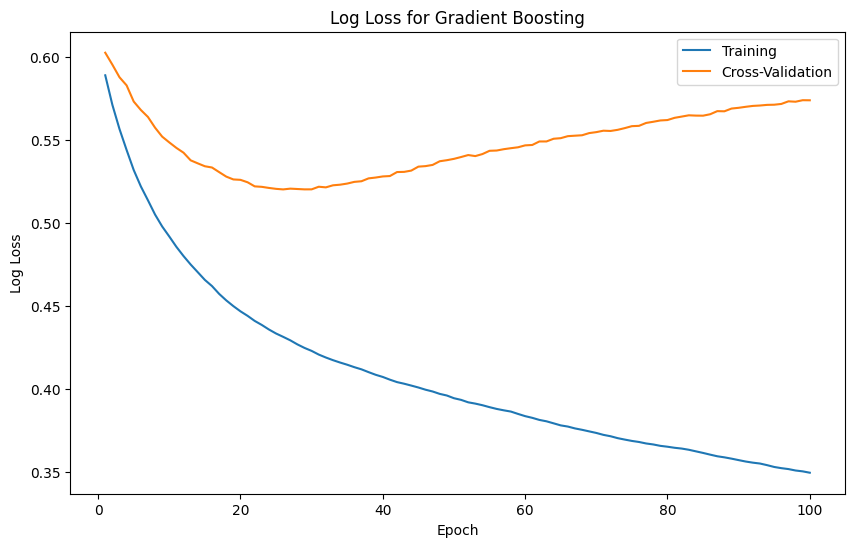

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, cross_val_predict, KFold
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score, roc_curve, log_loss

features = ["Ir_intensity", "Iws_kmh", "PRES", "cbwd", "DEWP", "Ir"]
target = "temp_category"

X = day3[features]
y = day3[target]

# Split data into 70% train and 30% test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initialize models
models = {
    "Logistic Regression": LogisticRegression(max_iter=1000),
    "Decision Tree": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier(),
    "XGBoost": XGBClassifier(eval_metric='logloss'),
    "Gradient Boosting": GradientBoostingClassifier()
}

results = {}
metrics = ["accuracy", "precision", "recall", "f1_score", "roc_auc"]

# Train and evaluate models
for model_name, model in models.items():
    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    y_proba_train = model.predict_proba(X_train)[:, 1]
    y_proba_test = model.predict_proba(X_test)[:, 1]

    accuracy_train = accuracy_score(y_train, y_pred_train)
    precision_train = precision_score(y_train, y_pred_train)
    recall_train = recall_score(y_train, y_pred_train)
    f1_train = f1_score(y_train, y_pred_train)
    roc_auc_train = roc_auc_score(y_train, y_proba_train)

    accuracy_test = accuracy_score(y_test, y_pred_test)
    precision_test = precision_score(y_test, y_pred_test)
    recall_test = recall_score(y_test, y_pred_test)
    f1_test = f1_score(y_test, y_pred_test)
    roc_auc_test = roc_auc_score(y_test, y_proba_test)

    conf_matrix_train = confusion_matrix(y_train, y_pred_train)
    conf_matrix_test = confusion_matrix(y_test, y_pred_test)

    results[model_name] = {
        "model": model,
        "train": {
            "accuracy": accuracy_train,
            "precision": precision_train,
            "recall": recall_train,
            "f1_score": f1_train,
            "roc_auc": roc_auc_train,
            "confusion_matrix": conf_matrix_train
        },
        "test": {
            "accuracy": accuracy_test,
            "precision": precision_test,
            "recall": recall_test,
            "f1_score": f1_test,
            "roc_auc": roc_auc_test,
            "confusion_matrix": conf_matrix_test
        }
    }

# Create DataFrame of model evaluation results
metrics_df_train = pd.DataFrame({model_name: [results[model_name]["train"][metric] for metric in metrics] for model_name in models.keys()}, index=metrics)
metrics_df_test = pd.DataFrame({model_name: [results[model_name]["test"][metric] for metric in metrics] for model_name in models.keys()}, index=metrics)

print("Training Metrics:\n", metrics_df_train)
print("Testing Metrics:\n", metrics_df_test)

# Visualize metrics for all models
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

metrics_df_train.T.plot(kind='bar', ax=axes[0])
axes[0].set_title('Training Metrics Comparison')
axes[0].set_ylabel('Score')
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=0)
axes[0].legend(loc='lower right')

metrics_df_test.T.plot(kind='bar', ax=axes[1])
axes[1].set_title('Testing Metrics Comparison')
axes[1].set_ylabel('Score')
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=0)
axes[1].legend(loc='lower right')

plt.show()

# Display Confusion Matrix for each model
for model_name, result in results.items():
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    sns.heatmap(result["train"]["confusion_matrix"], annot=True, fmt='d', cmap='Reds', xticklabels=[0, 1], yticklabels=[0, 1], ax=axes[0])
    sns.heatmap(result["test"]["confusion_matrix"], annot=True, fmt='d', cmap='Reds', xticklabels=[0, 1], yticklabels=[0, 1], ax=axes[1])
    axes[0].set_xlabel('Prediction')
    axes[0].set_ylabel('Actual')
    axes[0].set_title(f'Training Confusion Matrix for {model_name}')
    axes[1].set_xlabel('Prediction')
    axes[1].set_ylabel('Actual')
    axes[1].set_title(f'Testing Confusion Matrix for {model_name}')
    plt.show()

# Display ROC Curve for each model
plt.figure(figsize=(14, 10))
for model_name, model in models.items():
    y_proba_test = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_proba_test)
    plt.plot(fpr, tpr, label=f'{model_name} ROC curve (area = {roc_auc_test:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Visualize log loss for Gradient Boosting with cross-validation
gbr = models["Gradient Boosting"]
n_estimators = gbr.n_estimators

kf = KFold(n_splits=5, shuffle=True, random_state=42)
log_loss_train = np.zeros(n_estimators)
log_loss_cv = np.zeros(n_estimators)

for train_idx, val_idx in kf.split(X_train):
    X_train_kf, X_val_kf = X_train.iloc[train_idx], X_train.iloc[val_idx]
    y_train_kf, y_val_kf = y_train.iloc[train_idx], y_train.iloc[val_idx]

    gbr.fit(X_train_kf, y_train_kf)

    for i, (y_pred_train, y_pred_val) in enumerate(zip(gbr.staged_predict_proba(X_train_kf), gbr.staged_predict_proba(X_val_kf))):
        log_loss_train[i] += log_loss(y_train_kf, y_pred_train) / kf.n_splits
        log_loss_cv[i] += log_loss(y_val_kf, y_pred_val) / kf.n_splits

plt.figure(figsize=(10, 6))
plt.plot(range(1, n_estimators + 1), log_loss_train, label='Training')
plt.plot(range(1, n_estimators + 1), log_loss_cv, label='Cross-Validation')
plt.xlabel('Epoch')
plt.ylabel('Log Loss')
plt.title('Log Loss for Gradient Boosting')
plt.legend()
plt.show()


### 4 Hari

In [ ]:
day4=pd.read_excel('/content/drive/MyDrive/dataset-4/4Day.xlsx')

day4

,date_day,Iws,Ir,pm2.5,PRES,cbwd,DEWP,Temperature,Iws_change,Ir_intensity,pres_change,humidity,heat_index,Iws_kmh,wind_chill,temp_category,remarks
0,2016-07-01,5.2240,2.6790,2.1320,0.8880,2.0,1.492,21.025677,0.1300,50.2250,0.0400,29.516010,65.435460,19.831500,21.344375,1,temp d5
1,2016-07-02,9.4105,4.2870,6.3255,1.9540,2.0,1.736,22.053792,0.3400,77.3400,0.1400,27.356772,67.966073,37.194299,22.397396,1,temp d6
2,2016-07-03,10.4490,5.0230,7.1070,2.5590,3.0,1.888,26.355917,0.2700,121.4650,0.2975,20.449202,78.025505,39.606299,27.858958,1,temp d7
3,2016-07-04,10.5160,5.4250,6.9825,2.8250,3.0,1.980,27.369385,0.3400,129.9225,0.2100,18.488833,80.072961,40.751999,29.197604,1,temp d8
4,2016-07-05,11.0855,5.3580,7.4620,2.7010,3.0,2.010,30.139260,0.4700,133.5350,0.2500,15.876497,83.950486,42.017399,32.905625,1,temp d9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
661,2018-04-23,8.9080,1.2060,5.8100,0.6575,3.0,1.005,4.762365,0.6700,51.8550,0.2100,76.325218,38.427647,51.361201,-0.600000,0,temp d666
662,2018-04-24,9.5110,2.0425,7.8355,0.9060,2.0,1.066,7.202521,0.9575,62.4900,0.2800,64.775988,42.414249,54.073799,2.782396,0,temp d667
663,2018-04-25,10.4155,2.1430,9.5585,0.8880,2.0,1.157,8.812437,0.7550,64.1350,0.4300,57.939201,45.279570,52.506900,4.792500,0,temp d668
664,2018-04-26,9.4440,2.1430,8.0130,0.9060,2.5,1.218,10.027365,0.8500,61.9050,0.3900,53.979208,47.289771,49.612500,6.563646,0,temp d669


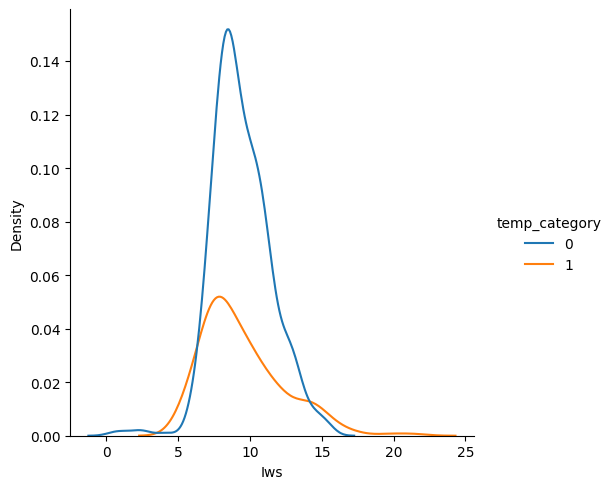

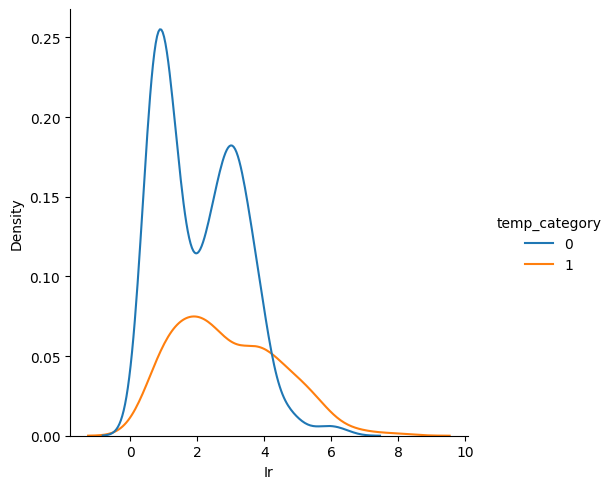

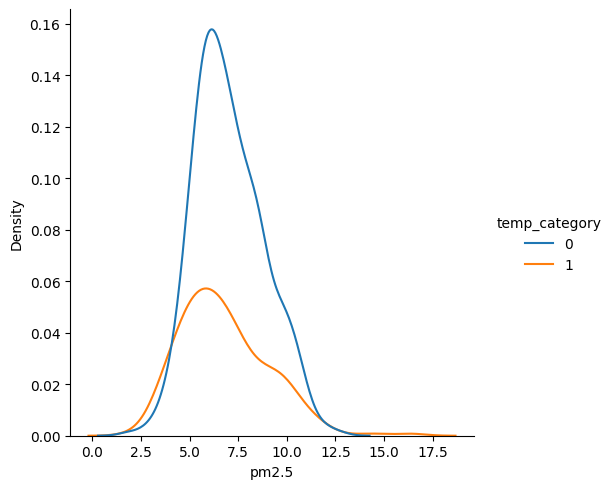

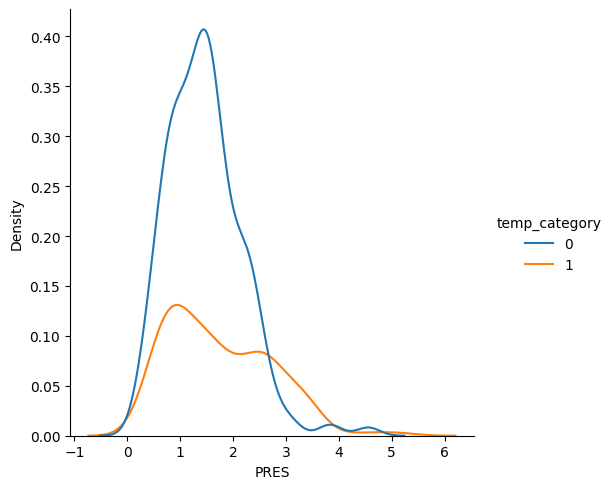

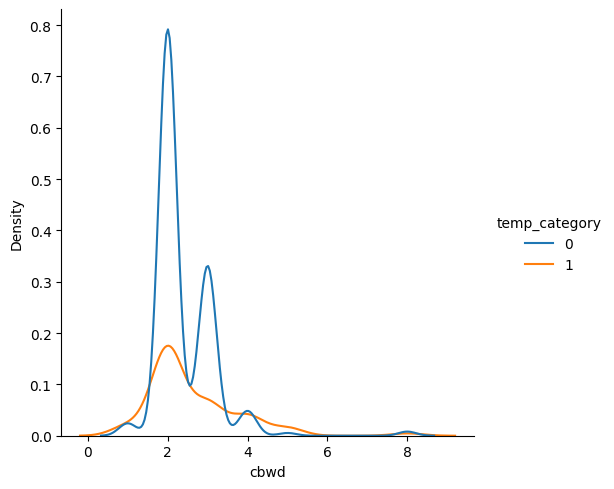

...

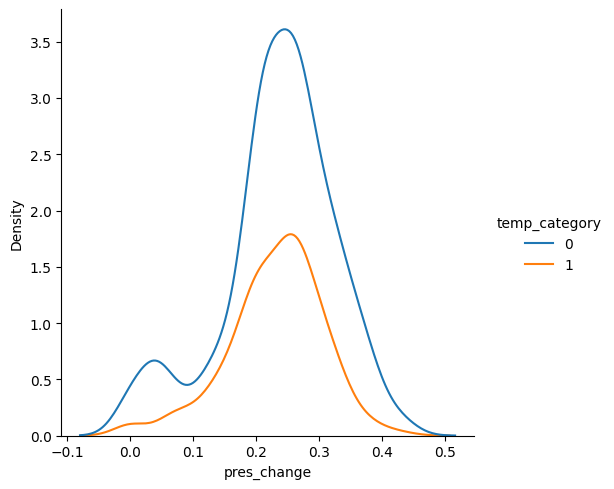

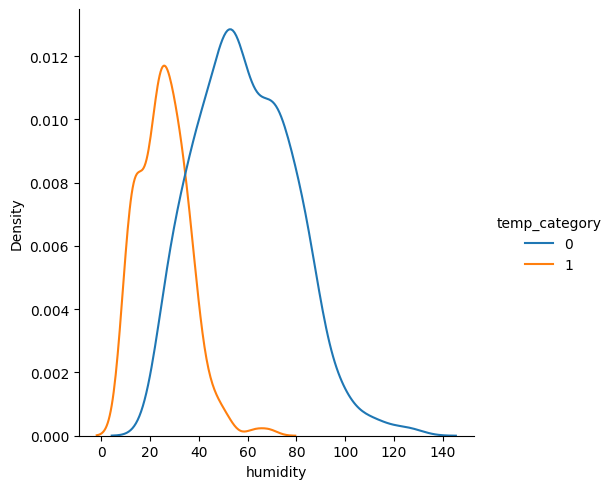

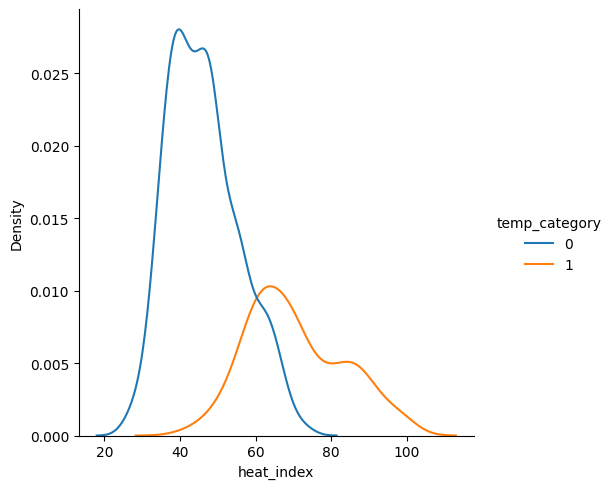

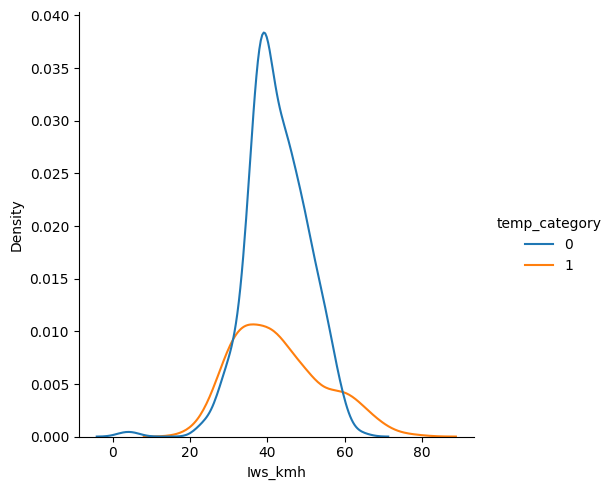

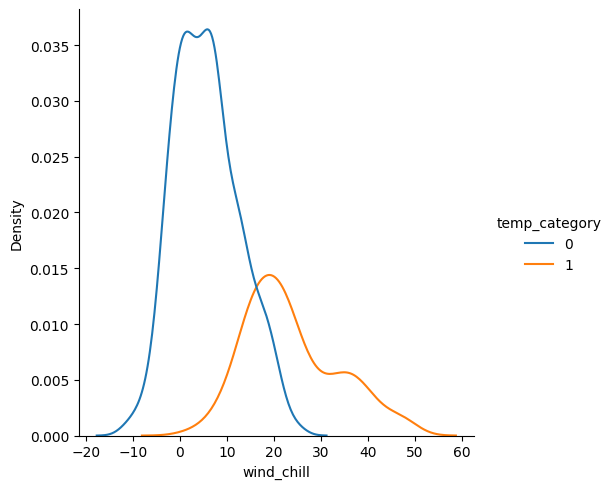

In [ ]:
sns.displot(day4, x= "Iws", hue="temp_category", kind="kde")
sns.displot(day4, x= "Ir", hue="temp_category", kind="kde")
sns.displot(day4, x= "pm2.5", hue="temp_category", kind="kde")
sns.displot(day4, x= "PRES", hue="temp_category", kind="kde")
sns.displot(day4, x= "cbwd", hue="temp_category", kind="kde")
sns.displot(day4, x= "DEWP", hue="temp_category", kind="kde")
sns.displot(day4, x= "Iws_change", hue="temp_category", kind="kde")
sns.displot(day4, x= "Ir_intensity", hue="temp_category", kind="kde")
sns.displot(day4, x= "pres_change", hue="temp_category", kind="kde")
sns.displot(day4, x= "humidity", hue="temp_category", kind="kde")
sns.displot(day4, x= "heat_index", hue="temp_category", kind="kde")
sns.displot(day4, x= "Iws_kmh", hue="temp_category", kind="kde")
sns.displot(day4, x= "wind_chill", hue="temp_category", kind="kde")

#### WoE

##### pm2.5

In [ ]:
def categorize_pm25(value):
    if value < 6:
        return 0  # Excellent
    elif 6 <= value < 8:
        return 1  # Fine
    elif 8 <= value < 20:
        return 2  # Moderate
    else:
        return 2

day4['pm2.5'] = day4['pm2.5'].apply(categorize_pm25)

a = pd.crosstab(day4['pm2.5'], day4['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return ln(df["%nonevent"]/df["%event"])

a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
pm2.5,,,,,,,
0,144,83,227,0.315098,0.397129,-0.231376,0.018980
1,183,67,250,0.400438,0.320574,0.222444,0.017765
2,130,59,189,0.284464,0.282297,0.007648,0.000017
Total,457,209,666,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.03676173309836641

In [ ]:
IV = pd.DataFrame()
IV['pm2.5'] = [a["IV"].sum()]

##### Ir

In [ ]:
def categorize_Ir(value):
    if value <= 1:
        return 0  # Basah ekstrem
    elif 1 < value <= 2:
        return 1  # Basah luar biasa
    elif 2< value <=3 :
        return 2  # Basah luar biasa
    elif 3< value :
        return 3  # Basah luar biasa
    else:
        return 3

day4['Ir'] = day4['Ir'].apply(categorize_Ir)

a = pd.crosstab(day4['Ir'], day4['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return ln(df["%nonevent"]/df["%event"])

a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
Ir,,,,,,,
0,121,19,140,0.264770,0.090909,1.069002,0.185858
1,107,52,159,0.234136,0.248804,-0.060764,0.000891
2,99,47,146,0.216630,0.224880,-0.037377,0.000308
3,130,91,221,0.284464,0.435407,-0.425674,0.064252
Total,457,209,666,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.25131011031241596

In [ ]:
IV['ir'] = [a["IV"].sum()]

##### Ir_intensity

In [ ]:
def categorize_Ir_intensity(value):
    if value < 39.9:
        return 0  # Moderate rain
    elif 40.0 <= value < 69.9:
        return 1  # Heavy rain
    elif 70.0 <= value < 109.9:
        return 2  # Rainstorm
    else:
        return 3  # Heavy rainstorm

day4['Ir_intensity'] = day4['Ir_intensity'].apply(categorize_Ir_intensity)

a = pd.crosstab(day4['Ir_intensity'], day4['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return ln(df["%nonevent"]/df["%event"])

a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
Ir_intensity,,,,,,,
0,154,47,201,0.336980,0.224880,0.404456,0.045339
1,102,48,150,0.223195,0.229665,-0.028577,0.000185
2,130,51,181,0.284464,0.244019,0.153360,0.006203
3,71,63,134,0.155361,0.301435,-0.662804,0.096819
Total,457,209,666,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.1485456366117136

In [ ]:
IV['Ir_intensity'] = [a["IV"].sum()]

##### Iws

In [ ]:
def categorize_Iws(value):
    if value < 8:
        return 0  # Good
    elif 8 <= value < 9:
        return 1  # Bad
    elif 9 <= value < 12:
        return 2  # Bad
    else:
        return 3 #very bad

day4['Iws'] = day4['Iws'].apply(categorize_Iws)

a = pd.crosstab(day4['Iws'], day4['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return ln(df["%nonevent"]/df["%event"])

a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
Iws,,,,,,,
0,104,79,183,0.227571,0.377990,-0.507406,0.076324
1,117,33,150,0.256018,0.157895,0.483317,0.047424
2,187,57,244,0.409190,0.272727,0.405708,0.055364
3,49,40,89,0.107221,0.191388,-0.579408,0.048767
Total,457,209,666,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.22787910066198397

In [ ]:
IV['iws'] = [a["IV"].sum()]

##### Iws_kmh

In [ ]:
def categorize_Iws_kmh(value):
    if value <= 35:
        return 0  # Fresh breeze
    elif 35 < value <= 40:
        return 1  # Gale
    elif 41 <= value <= 47:
        return 2  # Strong gale
    elif 48 <= value <= 55:
        return 3  # Storm
    else:
        return 4  # Hurricane

day4['Iws_kmh'] = day4['Iws_kmh'].apply(categorize_Iws_kmh)

a = pd.crosstab(day4['Iws_kmh'], day4['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return np.log(df["%nonevent"]/df["%event"])

a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
Iws_kmh,,,,,,,
0,57,64,121,0.124726,0.306220,-0.898181,0.163014
1,128,33,161,0.280088,0.157895,0.573174,0.070038
2,118,36,154,0.258206,0.172249,0.404817,0.034797
3,89,26,115,0.194748,0.124402,0.448191,0.031529
4,65,50,115,0.142232,0.239234,-0.519985,0.050440
Total,457,209,666,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.34981701426580253

In [ ]:
IV['Iws_kmh'] = [a["IV"].sum()]

##### PRES

In [ ]:
day4['PRES'].unique()

array([0.88800001, 1.954     , 2.55900002, 2.82499993, 2.70099998,
       2.4519999 , 2.29199994, 2.13199997, 1.56400001, 1.66999996,
       1.24399996, 1.4745    , 1.24400002, 0.97750002, 0.81699997,
       0.95899999, 1.01300001, 0.83499998, 0.78200001, 1.77650005,
       1.45700002, 1.61699998, 1.35000002, 0.8705    , 0.426     ,
       0.49700001, 0.53299999, 0.60399997, 0.551     , 1.23214999,
       2.66499996, 3.19799995, 3.23399997, 3.33999991, 3.37599993,
       3.48200011, 3.55299997, 3.44700003, 3.16300011, 3.60699999,
       2.68299997, 2.75400007, 2.5940001 , 2.87800002, 2.91400003,
       2.7895    , 3.21599996, 3.05599999, 2.57650006, 3.12700009,
       3.41100001, 2.71850002, 3.10950005, 2.86049998, 3.19850004,
       2.523     , 2.61200011, 2.48699999, 2.96699989, 1.528     ,
       1.63499999, 2.27399993, 2.505     , 2.38100004, 1.759     ,
       1.74100006, 2.23900008, 2.4339999 , 2.34500003, 1.43900001,
       2.30999994, 0.72850001, 1.49199998, 2.46949995, 2.09699

In [ ]:
def categorize_PRES(value):
    if value <= 1:
        return 0
    elif 1 < value <= 1.5:
        return 1
    elif 1.5 < value <= 2.2:
        return 2
    else:
        return 3

day4['PRES'] = day4['PRES'].apply(categorize_PRES)

a = pd.crosstab(day4['PRES'], day4['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return np.log(df["%nonevent"]/df["%event"])

a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
PRES,,,,,,,
0,128,65,193,0.280088,0.311005,-0.104706,0.003237
1,128,38,166,0.280088,0.181818,0.432095,0.042462
2,128,36,164,0.280088,0.172249,0.486162,0.052427
3,73,70,143,0.159737,0.334928,-0.740385,0.129709
Total,457,209,666,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.22783466448917816

In [ ]:
IV['PRES'] = [a["IV"].sum()]

##### cbwd

In [ ]:
day4['cbwd'].unique()

array([2. , 3. , 3.5, 4. , 5. , 4.5, 1. , 1.5, 2.5, 8. ])

In [ ]:
def categorize_cbwd(value):
    if value <= 1.9:
        return 0
    elif 1.9 < value <= 2:
        return 1
    elif value > 3:
        return 3
    else:
        return 2

day4['cbwd'] = day4['cbwd'].apply(categorize_cbwd)

a = pd.crosstab(day4['cbwd'], day4['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return np.log(df["%nonevent"]/df["%event"])

a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
cbwd,,,,,,,
0,9,14,23,0.019694,0.066986,-1.224182,0.057894
1,295,114,409,0.645514,0.545455,0.168428,0.016853
2,129,41,170,0.282276,0.196172,0.363891,0.031332
3,24,40,64,0.052516,0.191388,-1.293175,0.179585
Total,457,209,666,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.28566378463459585

In [ ]:
IV['cbwd'] = [a["IV"].sum()]

##### DEWP

In [ ]:
day4['DEWP'].unique()

array([ 1.49199998,  1.73599994,  1.88800001,  1.98000002,  2.00999999,
        1.79700005,  1.64499998,  1.67499995,  1.70599997,  1.30999994,
        1.06599998,  1.18799996,  1.03600001,  0.99000001,  1.21800005,
        1.005     ,  1.2335    ,  1.097     ,  1.32499999,  1.15699995,
        1.37100005,  1.29449999,  1.44700003,  1.40100002,  1.477     ,
        1.24899995,  1.27900004,  1.34000003,  0.88300002,  0.91399997,
        1.12699997,  1.53799999,  1.43200004,  1.46200001,  1.61399996,
        1.20300001,  0.94400001,  0.97500002,  0.82200003,  1.0205    ,
        1.051     ,  1.08149999,  0.70099998,  0.85299999,  0.8985    ,
        0.63999999,  0.73100001,  0.95950001,  0.51800001,  0.71599999,
        0.60900003, -0.85299999, -1.03600001, -1.005     , -0.67000002,
       -0.792     , -0.7615    ,  0.579     , -0.73100001, -0.71599999,
       -0.99000001, -0.54799998, -0.97500002, -0.94400001, -0.655     ,
       -0.8985    , -0.59400001, -0.60900003,  0.67000002,  0.53

In [ ]:
def categorize_DEWP(value):
    if value < 0.6:
        return 0
    elif value > 1:
        return 2
    else:
        return 1

day4['DEWP'] = day4['DEWP'].apply(categorize_DEWP)

a = pd.crosstab(day4['DEWP'], day4['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return np.log(df["%nonevent"]/df["%event"])

a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
DEWP,,,,,,,
0,72,40,112,0.157549,0.191388,-0.194562,0.006584
1,209,46,255,0.457330,0.220096,0.731344,0.173500
2,176,123,299,0.385120,0.588517,-0.424049,0.086250
Total,457,209,666,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.26633393162684005

In [ ]:
IV['DEWP'] = [a["IV"].sum()]

#### Result

In [ ]:
woe = IV.T.sort_values(by=0, ascending=False)
woe

,0
Iws_kmh,0.349817
cbwd,0.285664
DEWP,0.266334
ir,0.251310
iws,0.227879
PRES,0.227835
Ir_intensity,0.148546
pm2.5,0.036762


Training Metrics:
            Logistic Regression  Decision Tree  Random Forest   XGBoost  \
accuracy              0.675966       0.894850       0.894850  0.894850   
precision             0.416667       0.869231       0.842857  0.842857   
recall                0.103448       0.779310       0.813793  0.813793   
f1_score              0.165746       0.821818       0.828070  0.828070   
roc_auc               0.677656       0.967247       0.961145  0.960071   

           Gradient Boosting  
accuracy            0.849785  
precision           0.790698  
recall              0.703448  
f1_score            0.744526  
roc_auc             0.909195  
Testing Metrics:
            Logistic Regression  Decision Tree  Random Forest   XGBoost  \
accuracy              0.685000       0.715000       0.740000  0.725000   
precision             0.533333       0.566038       0.596774  0.573770   
recall                0.125000       0.468750       0.578125  0.546875   
f1_score              0.202532      

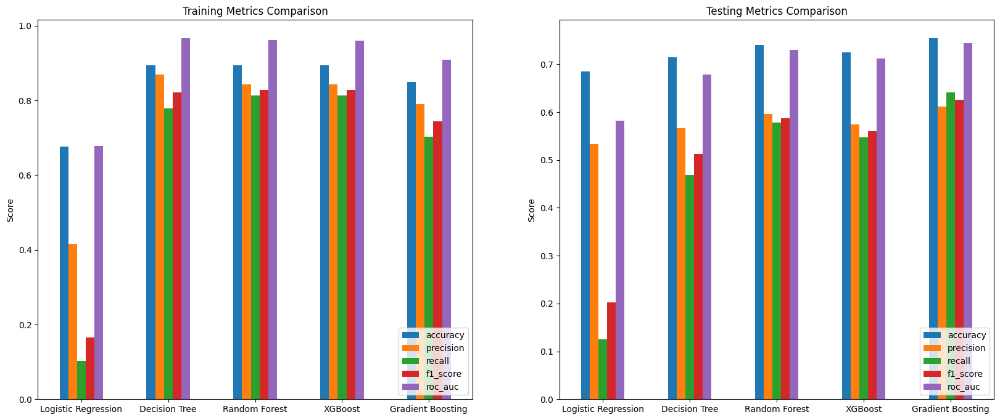

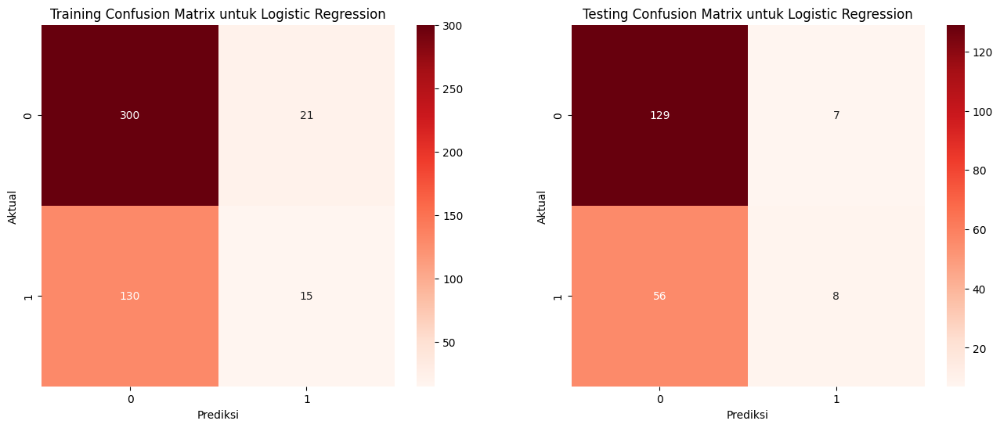

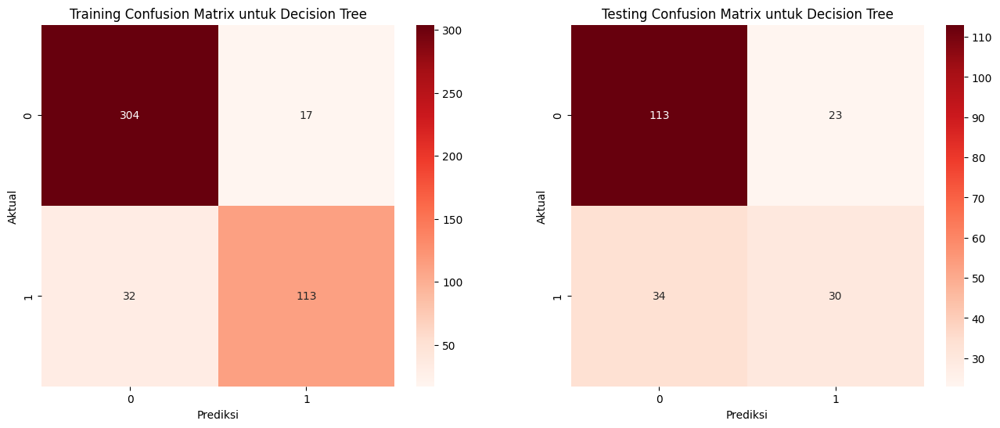

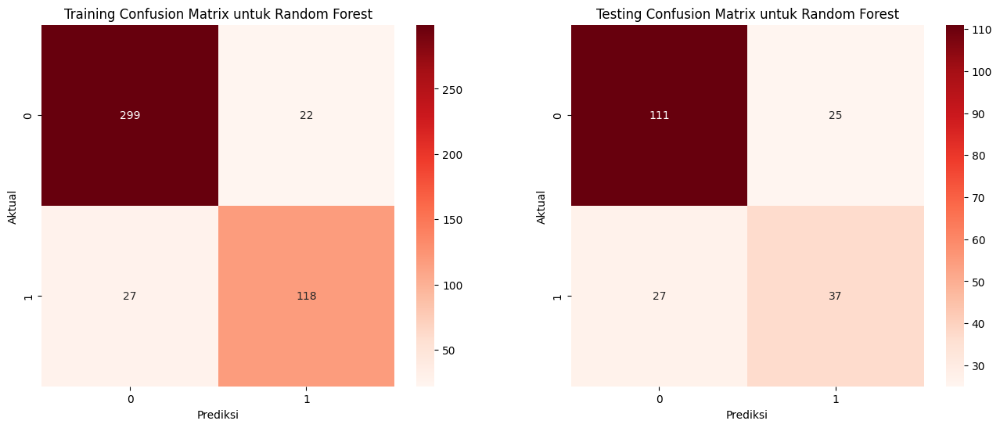

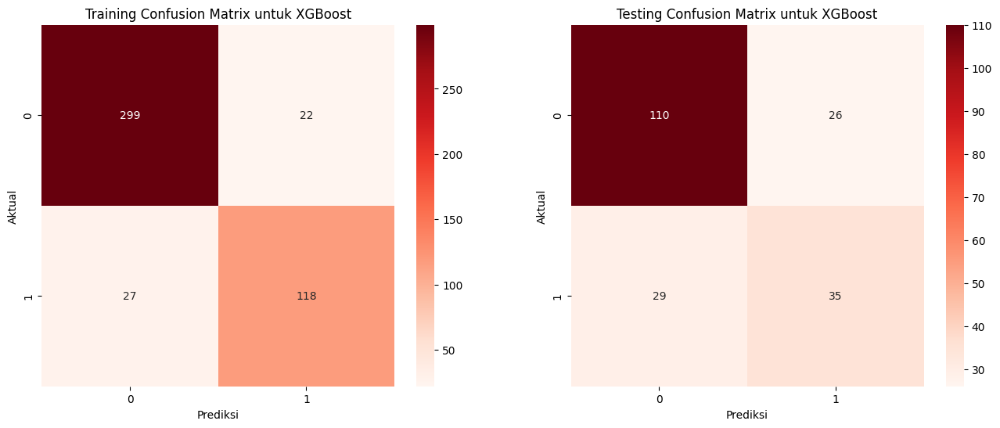

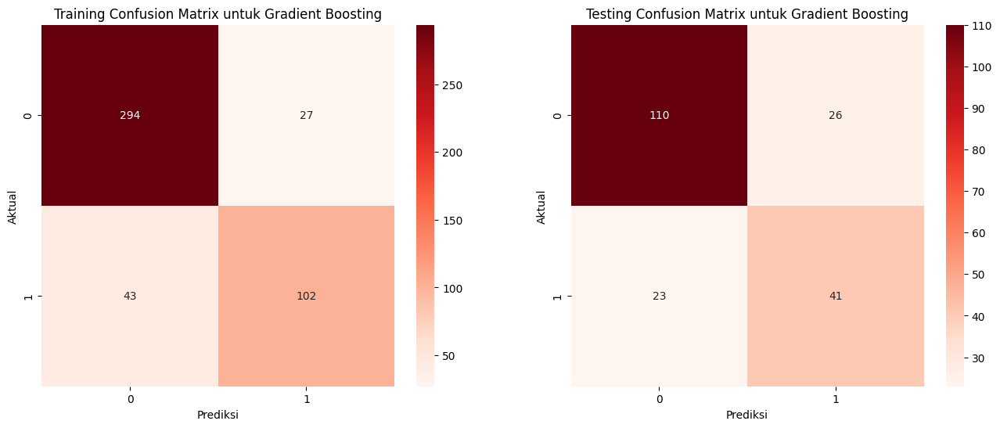

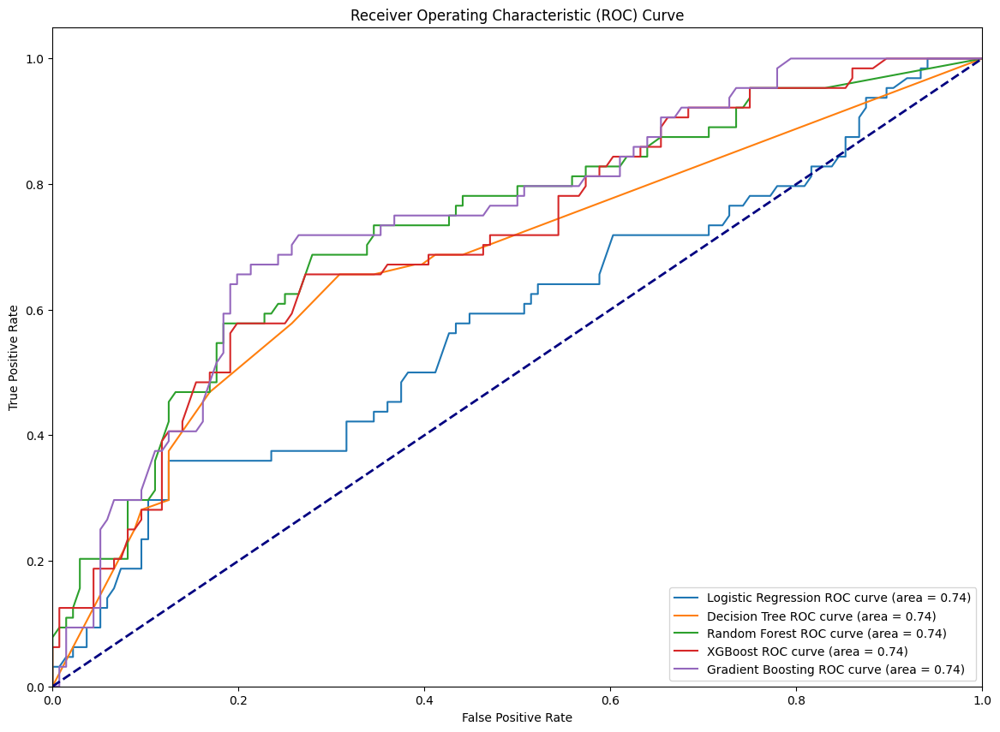

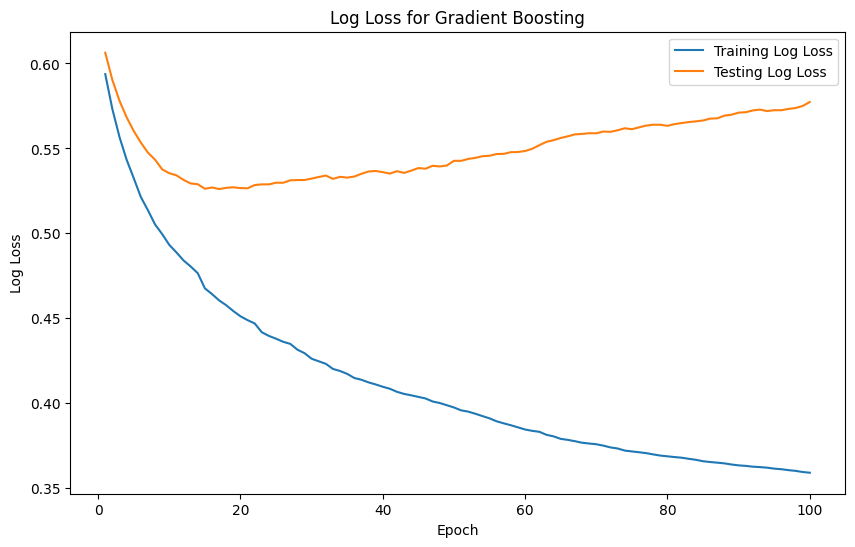

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, learning_curve
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score, roc_curve, log_loss

features = ["Ir_intensity", "Iws_kmh", "PRES", "cbwd", "DEWP", "Ir"]
target = "temp_category"

X = day4[features]
y = day4[target]

# Split data menjadi 70% train dan 30% test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Inisialisasi model
models = {
    "Logistic Regression": LogisticRegression(max_iter=1000),
    "Decision Tree": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier(),
    "XGBoost": XGBClassifier(eval_metric='logloss'),
    "Gradient Boosting": GradientBoostingClassifier()
}

results = {}
metrics = ["accuracy", "precision", "recall", "f1_score", "roc_auc"]

# Train dan evaluasi model
for model_name, model in models.items():
    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    y_proba_train = model.predict_proba(X_train)[:, 1]
    y_proba_test = model.predict_proba(X_test)[:, 1]

    accuracy_train = accuracy_score(y_train, y_pred_train)
    precision_train = precision_score(y_train, y_pred_train)
    recall_train = recall_score(y_train, y_pred_train)
    f1_train = f1_score(y_train, y_pred_train)
    roc_auc_train = roc_auc_score(y_train, y_proba_train)

    accuracy_test = accuracy_score(y_test, y_pred_test)
    precision_test = precision_score(y_test, y_pred_test)
    recall_test = recall_score(y_test, y_pred_test)
    f1_test = f1_score(y_test, y_pred_test)
    roc_auc_test = roc_auc_score(y_test, y_proba_test)

    conf_matrix_train = confusion_matrix(y_train, y_pred_train)
    conf_matrix_test = confusion_matrix(y_test, y_pred_test)

    results[model_name] = {
        "model": model,
        "train": {
            "accuracy": accuracy_train,
            "precision": precision_train,
            "recall": recall_train,
            "f1_score": f1_train,
            "roc_auc": roc_auc_train,
            "confusion_matrix": conf_matrix_train
        },
        "test": {
            "accuracy": accuracy_test,
            "precision": precision_test,
            "recall": recall_test,
            "f1_score": f1_test,
            "roc_auc": roc_auc_test,
            "confusion_matrix": conf_matrix_test
        }
    }

# Membuat DataFrame hasil evaluasi model
metrics_df_train = pd.DataFrame({model_name: [results[model_name]["train"][metric] for metric in metrics] for model_name in models.keys()}, index=metrics)
metrics_df_test = pd.DataFrame({model_name: [results[model_name]["test"][metric] for metric in metrics] for model_name in models.keys()}, index=metrics)

print("Training Metrics:\n", metrics_df_train)
print("Testing Metrics:\n", metrics_df_test)

# Visualisasi metrik untuk semua model
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

metrics_df_train.T.plot(kind='bar', ax=axes[0])
axes[0].set_title('Training Metrics Comparison')
axes[0].set_ylabel('Score')
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=0)
axes[0].legend(loc='lower right')

metrics_df_test.T.plot(kind='bar', ax=axes[1])
axes[1].set_title('Testing Metrics Comparison')
axes[1].set_ylabel('Score')
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=0)
axes[1].legend(loc='lower right')

plt.show()

# Menampilkan Confusion Matrix untuk setiap model
for model_name, result in results.items():
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    sns.heatmap(result["train"]["confusion_matrix"], annot=True, fmt='d', cmap='Reds', xticklabels=[0, 1], yticklabels=[0, 1], ax=axes[0])
    sns.heatmap(result["test"]["confusion_matrix"], annot=True, fmt='d', cmap='Reds', xticklabels=[0, 1], yticklabels=[0, 1], ax=axes[1])
    axes[0].set_xlabel('Prediksi')
    axes[0].set_ylabel('Aktual')
    axes[0].set_title(f'Training Confusion Matrix untuk {model_name}')
    axes[1].set_xlabel('Prediksi')
    axes[1].set_ylabel('Aktual')
    axes[1].set_title(f'Testing Confusion Matrix untuk {model_name}')
    plt.show()

# Menampilkan ROC Curve untuk setiap model
plt.figure(figsize=(14, 10))
for model_name, model in models.items():
    y_proba_test = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_proba_test)
    plt.plot(fpr, tpr, label=f'{model_name} ROC curve (area = {roc_auc_test:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Visualisasi log loss untuk Gradient Boosting
gbr = models["Gradient Boosting"]
n_estimators = gbr.n_estimators
log_loss_train = []
log_loss_test = []

for y_pred_train, y_pred_test in zip(gbr.staged_predict_proba(X_train), gbr.staged_predict_proba(X_test)):
    log_loss_train.append(log_loss(y_train, y_pred_train))
    log_loss_test.append(log_loss(y_test, y_pred_test))

plt.figure(figsize=(10, 6))
plt.plot(range(1, n_estimators + 1), log_loss_train, label='Training Log Loss')
plt.plot(range(1, n_estimators + 1), log_loss_test, label='Testing Log Loss')
plt.xlabel('Epoch')
plt.ylabel('Log Loss')
plt.title('Log Loss for Gradient Boosting')
plt.legend()
plt.show()


### 5 Hari

In [ ]:
day5=pd.read_excel('/content/drive/MyDrive/dataset-4/5Day.xlsx')
day5

,date_day,Iws,Ir,pm2.5,PRES,cbwd,DEWP,Temperature,Iws_change,Ir_intensity,pres_change,humidity,heat_index,Iws_kmh,wind_chill,temp_category,remarks
0,2016-07-01,5.2240,2.6790,2.1320,0.8880,2.0,1.492,21.025677,0.1300,50.2250,0.0400,29.516010,65.435460,19.831500,21.344375,1,temp d6
1,2016-07-02,9.4105,4.2870,6.3255,1.9540,2.0,1.736,22.053792,0.3400,77.3400,0.1400,27.356772,67.966073,37.194299,22.397396,1,temp d7
2,2016-07-03,10.4490,5.0230,7.1070,2.5590,3.0,1.888,26.355917,0.2700,121.4650,0.2975,20.449202,78.025505,39.606299,27.858958,1,temp d8
3,2016-07-04,10.5160,5.4250,6.9825,2.8250,3.0,1.980,27.369385,0.3400,129.9225,0.2100,18.488833,80.072961,40.751999,29.197604,1,temp d9
4,2016-07-05,11.0855,5.3580,7.4620,2.7010,3.0,2.010,30.139260,0.4700,133.5350,0.2500,15.876497,83.950486,42.017399,32.905625,1,temp d10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
660,2018-04-22,7.8705,1.0385,6.3430,0.8350,3.0,1.112,9.219094,0.9400,49.6175,0.2800,56.387554,46.503107,47.140199,6.106562,0,temp d666
661,2018-04-23,8.9080,1.2060,5.8100,0.6575,3.0,1.005,4.762365,0.6700,51.8550,0.2100,76.325218,38.427647,51.361201,-0.600000,0,temp d667
662,2018-04-24,9.5110,2.0425,7.8355,0.9060,2.0,1.066,7.202521,0.9575,62.4900,0.2800,64.775988,42.414249,54.073799,2.782396,0,temp d668
663,2018-04-25,10.4155,2.1430,9.5585,0.8880,2.0,1.157,8.812437,0.7550,64.1350,0.4300,57.939201,45.279570,52.506900,4.792500,0,temp d669


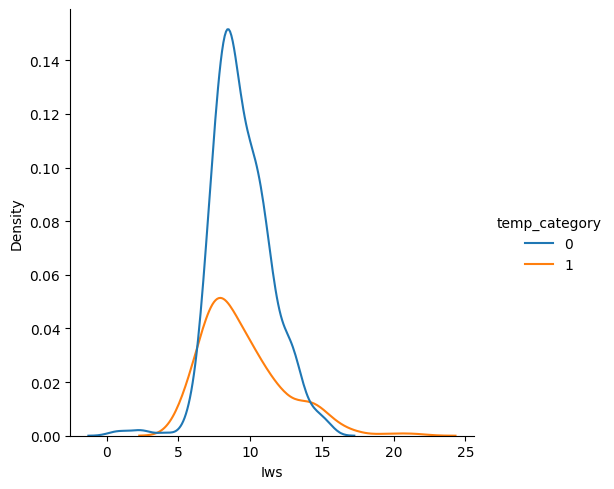

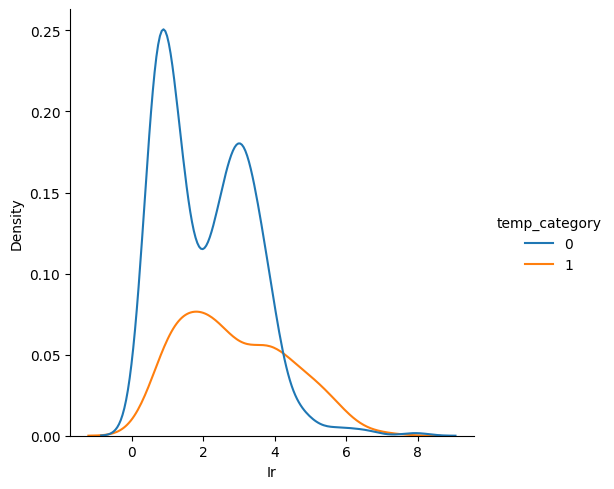

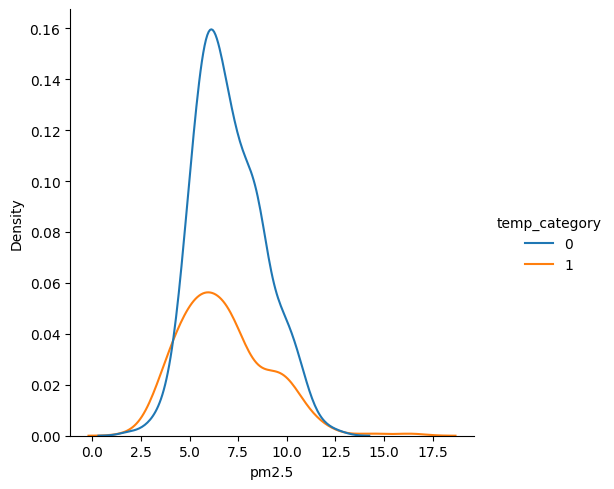

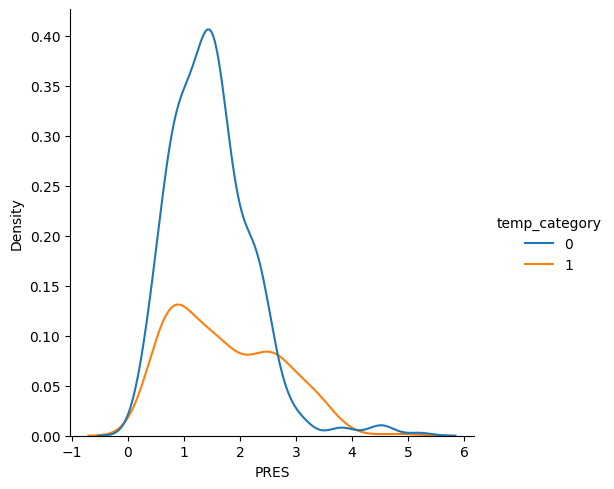

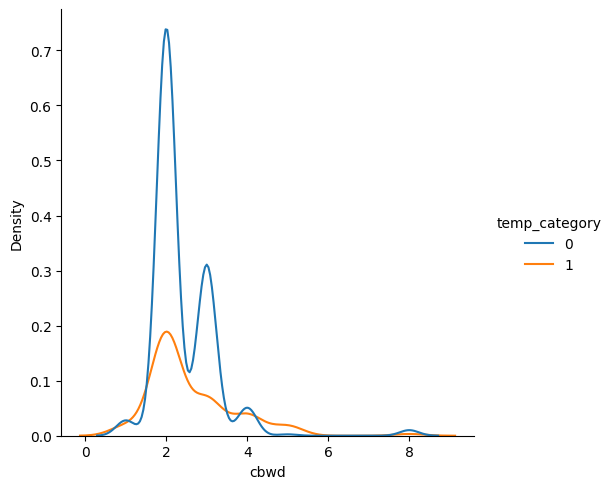

...

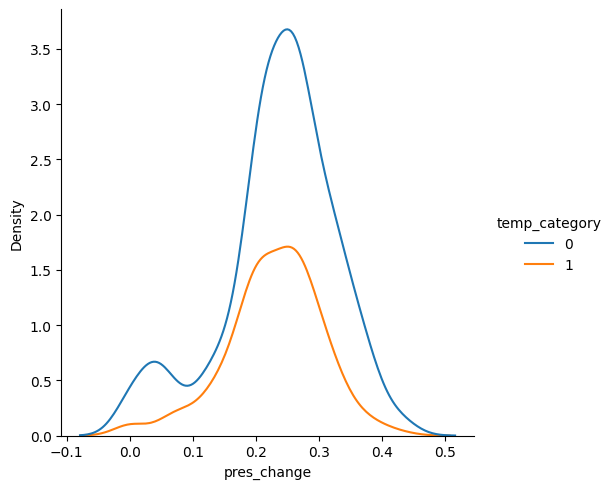

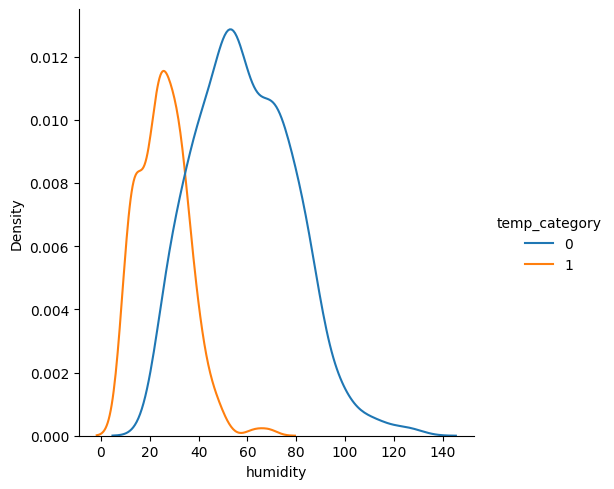

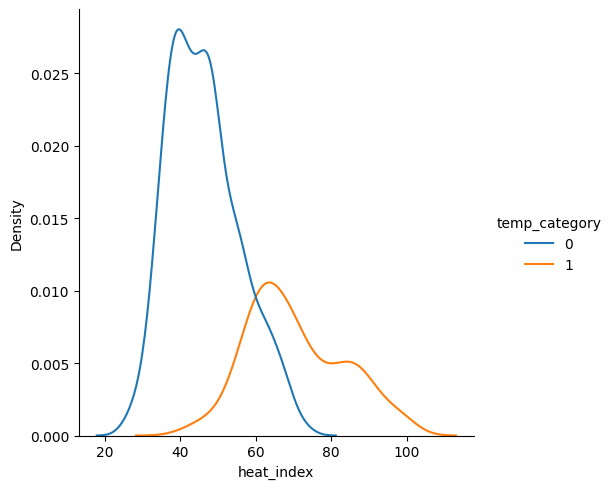

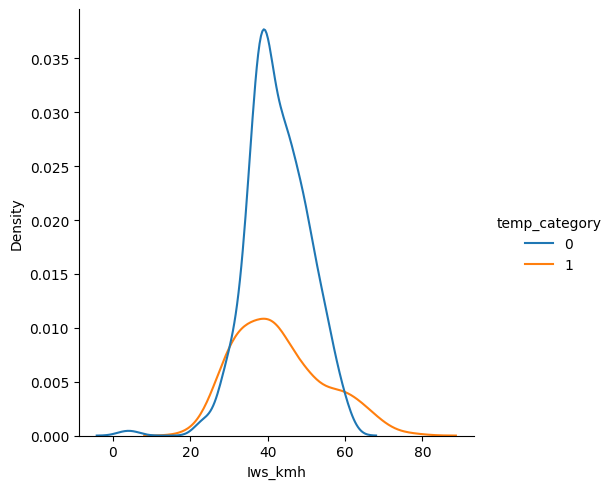

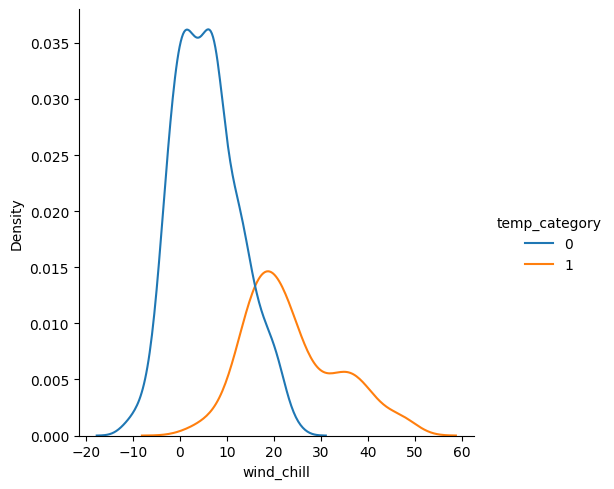

In [ ]:
sns.displot(day5, x= "Iws", hue="temp_category", kind="kde")
sns.displot(day5, x= "Ir", hue="temp_category", kind="kde")
sns.displot(day5, x= "pm2.5", hue="temp_category", kind="kde")
sns.displot(day5, x= "PRES", hue="temp_category", kind="kde")
sns.displot(day5, x= "cbwd", hue="temp_category", kind="kde")
sns.displot(day5, x= "DEWP", hue="temp_category", kind="kde")
sns.displot(day5, x= "Iws_change", hue="temp_category", kind="kde")
sns.displot(day5, x= "Ir_intensity", hue="temp_category", kind="kde")
sns.displot(day5, x= "pres_change", hue="temp_category", kind="kde")
sns.displot(day5, x= "humidity", hue="temp_category", kind="kde")
sns.displot(day5, x= "heat_index", hue="temp_category", kind="kde")
sns.displot(day5, x= "Iws_kmh", hue="temp_category", kind="kde")
sns.displot(day5, x= "wind_chill", hue="temp_category", kind="kde")

#### WoE

##### pm2.5

In [ ]:
def categorize_pm25(value):
    if value < 6:
        return 0  # Excellent
    elif 6 <= value < 8:
        return 1  # Fine
    elif 8 <= value < 20:
        return 2  # Moderate
    else:
        return 2

day5['pm2.5'] = day5['pm2.5'].apply(categorize_pm25)

a = pd.crosstab(day5['pm2.5'], day5['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return ln(df["%nonevent"]/df["%event"])

a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
pm2.5,,,,,,,
0,144,83,227,0.315098,0.399038,-0.236173,0.019824
1,181,69,250,0.396061,0.331731,0.177245,0.011402
2,132,56,188,0.288840,0.269231,0.070305,0.001379
Total,457,208,665,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.03260524527690107

In [ ]:
IV = pd.DataFrame()
IV['pm2.5'] = [a["IV"].sum()]

##### Ir

In [ ]:
def categorize_Ir(value):
    if value <= 1:
        return 0  # Basah ekstrem
    elif 1 < value <= 2:
        return 1  # Basah luar biasa
    elif 2< value <=3 :
        return 2  # Basah luar biasa
    elif 3< value :
        return 3  # Basah luar biasa
    else:
        return 3

day5['Ir'] = day5['Ir'].apply(categorize_Ir)

a = pd.crosstab(day5['Ir'], day5['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return ln(df["%nonevent"]/df["%event"])

a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
Ir,,,,,,,
0,124,16,140,0.271335,0.076923,1.260548,0.245065
1,104,55,159,0.227571,0.264423,-0.150088,0.005531
2,99,46,145,0.216630,0.221154,-0.020667,0.000093
3,130,91,221,0.284464,0.437500,-0.430470,0.065878
Total,457,208,665,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.31656722804476034

In [ ]:
IV['ir'] = [a["IV"].sum()]

##### Ir_intensity

In [ ]:
def categorize_Ir_intensity(value):
    if value < 29.9:
        return 0  # Moderate rain
    elif 30.0 <= value < 59.9:
        return 1  # Heavy rain
    elif 60.0 <= value < 99.9:
        return 2  # Rainstorm
    else:
        return 3  # Heavy rainstorm

day5['Ir_intensity'] = day5['Ir_intensity'].apply(categorize_Ir_intensity)

a = pd.crosstab(day5['Ir_intensity'], day5['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return ln(df["%nonevent"]/df["%event"])

a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
Ir_intensity,,,,,,,
0,126,24,150,0.275711,0.115385,0.871083,0.139658
1,101,59,160,0.221007,0.283654,-0.249562,0.015634
2,123,52,175,0.269147,0.250000,0.073795,0.001413
3,107,73,180,0.234136,0.350962,-0.404776,0.047288
Total,457,208,665,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.20399331482830865

In [ ]:
IV['Ir_intensity'] = [a["IV"].sum()]

##### Iws

In [ ]:
def categorize_Iws(value):
    if value < 8:
        return 0  # Good
    elif 8 <= value < 9:
        return 1  # Bad
    elif 8 <= value < 10:
        return 2  # Bad
    else:
        return 3 #very bad

day5['Iws'] = day5['Iws'].apply(categorize_Iws)

a = pd.crosstab(day5['Iws'], day5['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return ln(df["%nonevent"]/df["%event"])

a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
Iws,,,,,,,
0,107,76,183,0.234136,0.365385,-0.445050,0.058412
1,115,35,150,0.251641,0.168269,0.402439,0.033552
2,76,25,101,0.166302,0.120192,0.324712,0.014972
3,159,72,231,0.347921,0.346154,0.005093,0.000009
Total,457,208,665,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.10694577757002863

In [ ]:
IV['iws'] = [a["IV"].sum()]

##### Iws_kmh

In [ ]:
def categorize_Iws_kmh(value):
    if value <= 35:
        return 0  # Fresh breeze
    elif 35 < value <= 40:
        return 1  # Gale
    elif 41 <= value <= 47:
        return 2  # Strong gale
    elif 48 <= value <= 55:
        return 3  # Storm
    else:
        return 4  # Hurricane

day5['Iws_kmh'] = day5['Iws_kmh'].apply(categorize_Iws_kmh)

a = pd.crosstab(day5['Iws_kmh'], day5['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return np.log(df["%nonevent"]/df["%event"])

a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
Iws_kmh,,,,,,,
0,60,61,121,0.131291,0.293269,-0.803675,0.130178
1,127,34,161,0.277899,0.163462,0.530681,0.060730
2,117,37,154,0.256018,0.177885,0.364111,0.028449
3,89,25,114,0.194748,0.120192,0.482615,0.035982
4,64,51,115,0.140044,0.245192,-0.560088,0.058892
Total,457,208,665,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.3142310978870296

In [ ]:
IV['Iws_kmh'] = [a["IV"].sum()]

##### PRES

In [ ]:
day5['PRES'].unique()

array([0.88800001, 1.954     , 2.55900002, 2.82499993, 2.70099998,
       2.4519999 , 2.29199994, 2.13199997, 1.56400001, 1.66999996,
       1.24399996, 1.4745    , 1.24400002, 0.97750002, 0.81699997,
       0.95899999, 1.01300001, 0.83499998, 0.78200001, 1.77650005,
       1.45700002, 1.61699998, 1.35000002, 0.8705    , 0.426     ,
       0.49700001, 0.53299999, 0.60399997, 0.551     , 1.23214999,
       2.66499996, 3.19799995, 3.23399997, 3.33999991, 3.37599993,
       3.48200011, 3.55299997, 3.44700003, 3.16300011, 3.60699999,
       2.68299997, 2.75400007, 2.5940001 , 2.87800002, 2.91400003,
       2.7895    , 3.21599996, 3.05599999, 2.57650006, 3.12700009,
       3.41100001, 2.71850002, 3.10950005, 2.86049998, 3.19850004,
       2.523     , 2.61200011, 2.48699999, 2.96699989, 1.528     ,
       1.63499999, 2.27399993, 2.505     , 2.38100004, 1.759     ,
       1.74100006, 2.23900008, 2.4339999 , 2.34500003, 1.43900001,
       2.30999994, 0.72850001, 1.49199998, 2.46949995, 2.09699

In [ ]:
def categorize_PRES(value):
    if value <= 1:
        return 0
    elif 1 < value <= 1.5:
        return 1
    elif 1.5 < value <= 2.2:
        return 2
    else:
        return 3

day5['PRES'] = day5['PRES'].apply(categorize_PRES)

a = pd.crosstab(day5['PRES'], day5['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return np.log(df["%nonevent"]/df["%event"])

a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
PRES,,,,,,,
0,126,67,193,0.275711,0.322115,-0.155556,0.007218
1,129,36,165,0.282276,0.173077,0.489148,0.053414
2,128,36,164,0.280088,0.173077,0.481366,0.051511
3,74,69,143,0.161926,0.331731,-0.717187,0.121782
Total,457,208,665,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.23392612199735915

In [ ]:
IV['PRES'] = [a["IV"].sum()]

##### cbwd

In [ ]:
day5['cbwd'].unique()

array([2. , 3. , 3.5, 4. , 5. , 4.5, 1. , 1.5, 2.5, 8. ])

In [ ]:
def categorize_cbwd(value):
    if value <= 1.9:
        return 0
    elif 1.9 < value <= 2:
        return 1
    elif value > 3:
        return 3
    else:
        return 2

day5['cbwd'] = day5['cbwd'].apply(categorize_cbwd)

a = pd.crosstab(day5['cbwd'], day5['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return np.log(df["%nonevent"]/df["%event"])

a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
cbwd,,,,,,,
0,11,12,23,0.024070,0.057692,-0.874157,0.029391
1,292,117,409,0.638950,0.562500,0.127435,0.009742
2,128,41,169,0.280088,0.197115,0.351313,0.029149
3,26,38,64,0.056893,0.182692,-1.166635,0.146762
Total,457,208,665,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.2150447836596485

In [ ]:
IV['cbwd'] = [a["IV"].sum()]

##### DEWP

In [ ]:
day5['DEWP'].unique()

array([ 1.49199998,  1.73599994,  1.88800001,  1.98000002,  2.00999999,
        1.79700005,  1.64499998,  1.67499995,  1.70599997,  1.30999994,
        1.06599998,  1.18799996,  1.03600001,  0.99000001,  1.21800005,
        1.005     ,  1.2335    ,  1.097     ,  1.32499999,  1.15699995,
        1.37100005,  1.29449999,  1.44700003,  1.40100002,  1.477     ,
        1.24899995,  1.27900004,  1.34000003,  0.88300002,  0.91399997,
        1.12699997,  1.53799999,  1.43200004,  1.46200001,  1.61399996,
        1.20300001,  0.94400001,  0.97500002,  0.82200003,  1.0205    ,
        1.051     ,  1.08149999,  0.70099998,  0.85299999,  0.8985    ,
        0.63999999,  0.73100001,  0.95950001,  0.51800001,  0.71599999,
        0.60900003, -0.85299999, -1.03600001, -1.005     , -0.67000002,
       -0.792     , -0.7615    ,  0.579     , -0.73100001, -0.71599999,
       -0.99000001, -0.54799998, -0.97500002, -0.94400001, -0.655     ,
       -0.8985    , -0.59400001, -0.60900003,  0.67000002,  0.53

In [ ]:
def categorize_DEWP(value):
    if value < 0.5:
        return 0
    elif value > 1:
        return 2
    else:
        return 1

day5['DEWP'] = day5['DEWP'].apply(categorize_DEWP)

a = pd.crosstab(day5['DEWP'], day5['temp_category'], margins=True, margins_name='Total')

total_nonevent = a[0]["Total"]
total_event = a[1]["Total"]


def nonevent(df) :
    return (df[0]/total_nonevent)
def event(df) :
    return (df[1]/total_event)
def Woe(df) :
    return np.log(df["%nonevent"]/df["%event"])

a["%nonevent"] = a.apply(nonevent, axis =1 )
a["%event"] = a.apply(event, axis =1 )

a["WoE"] = np.log(a["%nonevent"]/a["%event"])
a["IV"] = (a["%nonevent"] - a["%event"])*a["WoE"]
a

temp_category,0,1,Total,%nonevent,%event,WoE,IV
DEWP,,,,,,,
0,48,40,88,0.105033,0.192308,-0.604824,0.052786
1,235,44,279,0.514223,0.211538,0.888251,0.268860
2,174,124,298,0.380744,0.596154,-0.448372,0.096584
Total,457,208,665,1.000000,1.000000,0.000000,0.000000


In [ ]:
a["IV"].sum()

0.41822946117350746

In [ ]:
IV['DEWP'] = [a["IV"].sum()]

#### Result

In [ ]:
woe = IV.T.sort_values(by=0, ascending=False)
woe

,0
DEWP,0.418229
ir,0.316567
Iws_kmh,0.314231
PRES,0.233926
cbwd,0.215045
Ir_intensity,0.203993
iws,0.106946
pm2.5,0.032605


Training Metrics:
            Logistic Regression  Decision Tree  Random Forest   XGBoost  \
accuracy              0.696774       0.890323       0.890323  0.886022   
precision             0.388889       0.877193       0.841270  0.804348   
recall                0.051095       0.729927       0.773723  0.810219   
f1_score              0.090323       0.796813       0.806084  0.807273   
roc_auc               0.669196       0.965596       0.960811  0.959409   

           Gradient Boosting  
accuracy            0.851613  
precision           0.774194  
recall              0.700730  
f1_score            0.735632  
roc_auc             0.910339  
Testing Metrics:
            Logistic Regression  Decision Tree  Random Forest   XGBoost  \
accuracy              0.625000       0.740000       0.755000  0.770000   
precision             0.333333       0.672727       0.720000  0.711864   
recall                0.056338       0.521127       0.507042  0.591549   
f1_score              0.096386      

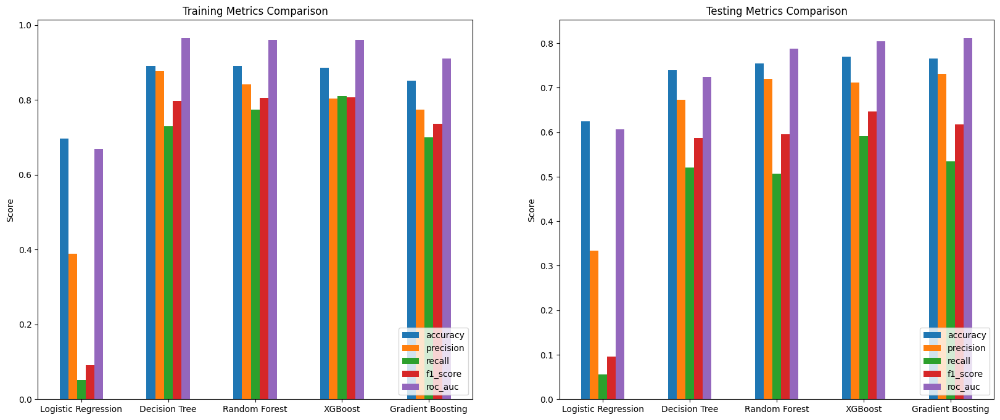

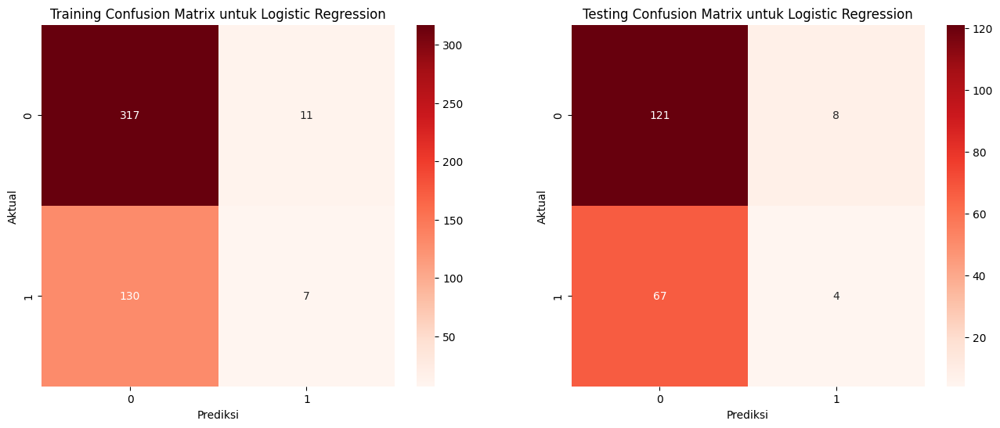

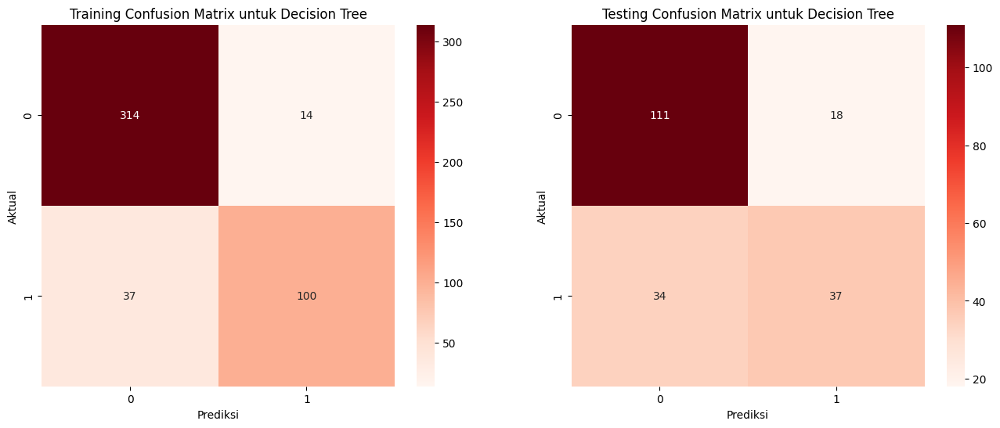

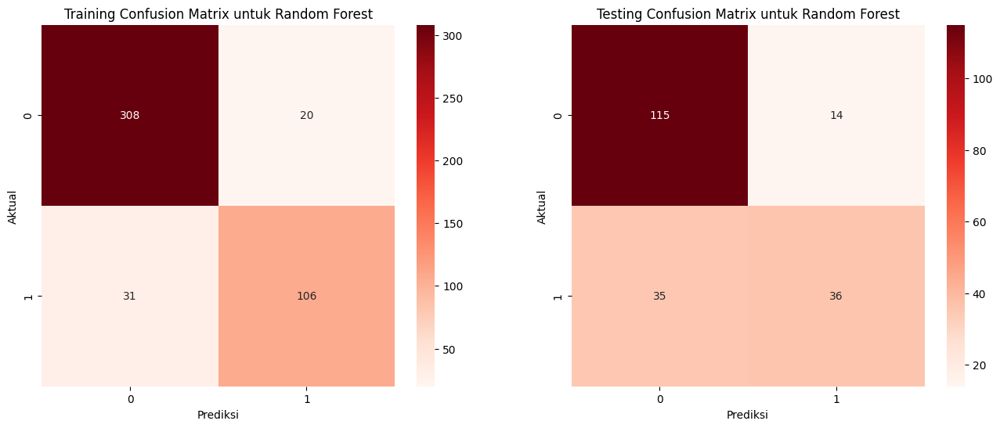

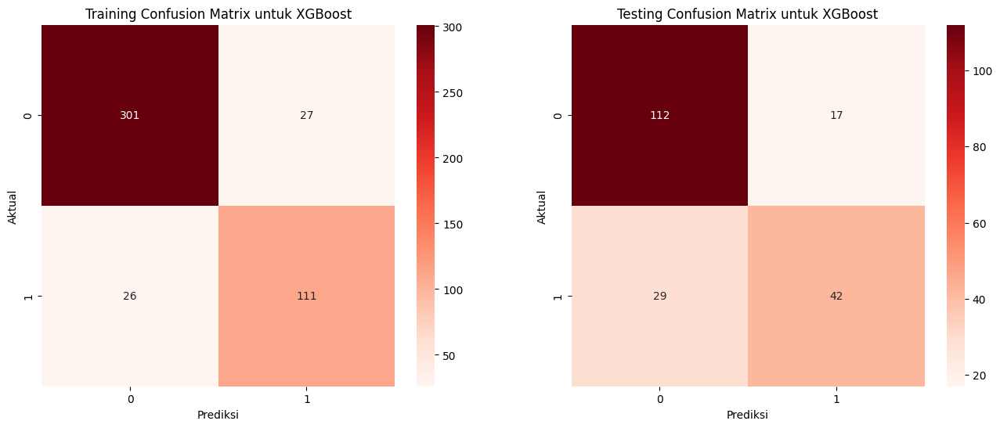

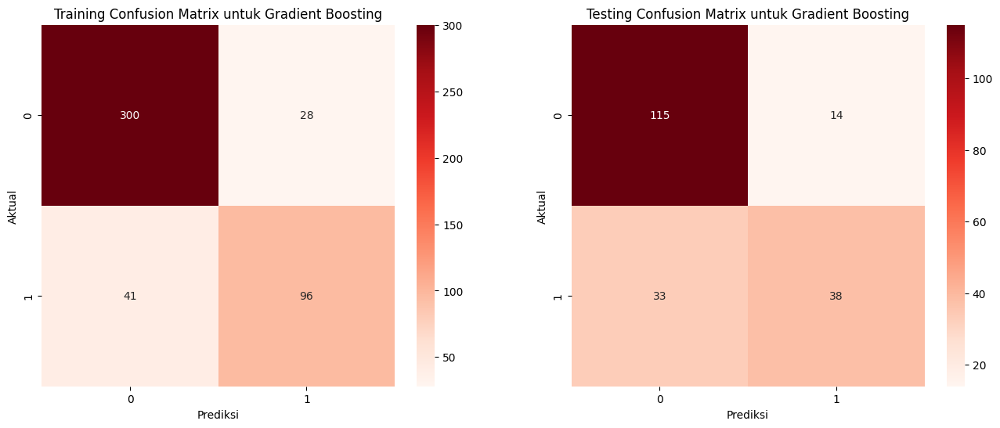

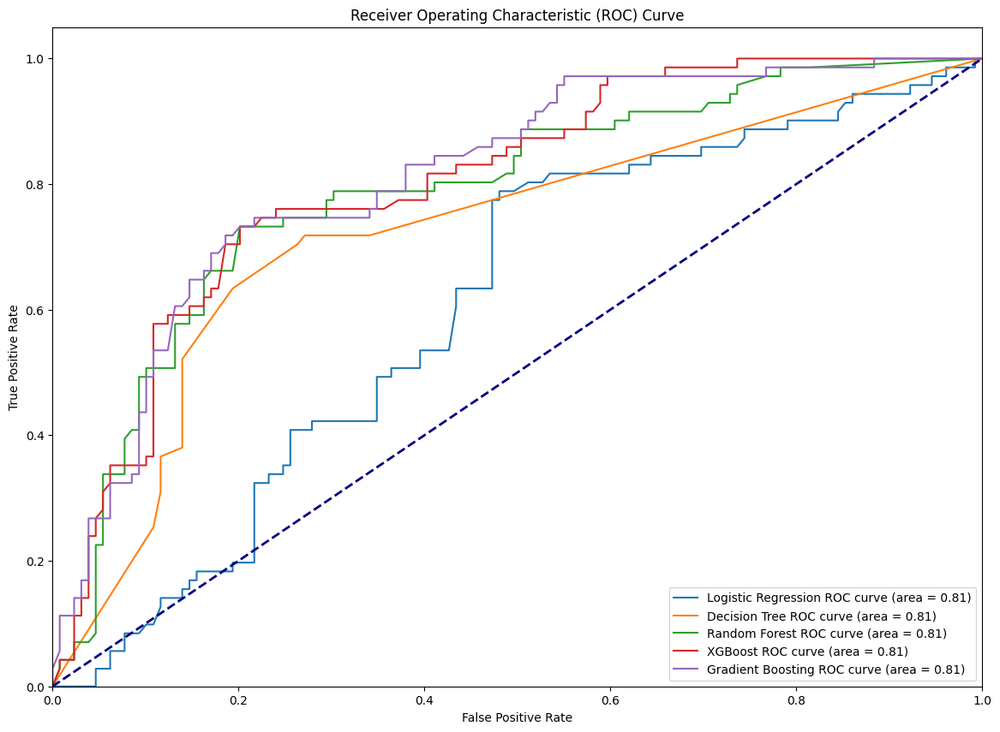

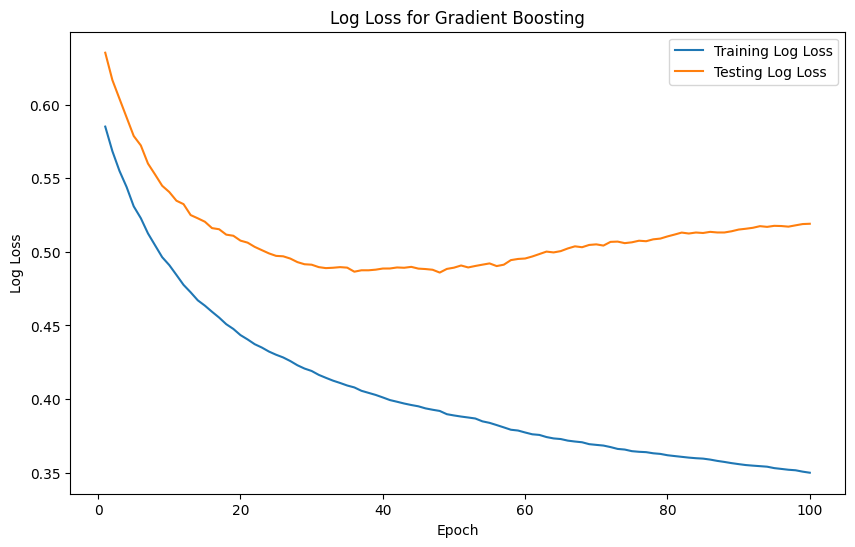

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, learning_curve
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score, roc_curve, log_loss

features = ["Ir_intensity", "Iws_kmh", "PRES", "cbwd", "DEWP", "Ir"]
target = "temp_category"

X = day5[features]
y = day5[target]

# Split data menjadi 70% train dan 30% test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Inisialisasi model
models = {
    "Logistic Regression": LogisticRegression(max_iter=1000),
    "Decision Tree": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier(),
    "XGBoost": XGBClassifier(eval_metric='logloss'),
    "Gradient Boosting": GradientBoostingClassifier()
}

results = {}
metrics = ["accuracy", "precision", "recall", "f1_score", "roc_auc"]

# Train dan evaluasi model
for model_name, model in models.items():
    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    y_proba_train = model.predict_proba(X_train)[:, 1]
    y_proba_test = model.predict_proba(X_test)[:, 1]

    accuracy_train = accuracy_score(y_train, y_pred_train)
    precision_train = precision_score(y_train, y_pred_train)
    recall_train = recall_score(y_train, y_pred_train)
    f1_train = f1_score(y_train, y_pred_train)
    roc_auc_train = roc_auc_score(y_train, y_proba_train)

    accuracy_test = accuracy_score(y_test, y_pred_test)
    precision_test = precision_score(y_test, y_pred_test)
    recall_test = recall_score(y_test, y_pred_test)
    f1_test = f1_score(y_test, y_pred_test)
    roc_auc_test = roc_auc_score(y_test, y_proba_test)

    conf_matrix_train = confusion_matrix(y_train, y_pred_train)
    conf_matrix_test = confusion_matrix(y_test, y_pred_test)

    results[model_name] = {
        "model": model,
        "train": {
            "accuracy": accuracy_train,
            "precision": precision_train,
            "recall": recall_train,
            "f1_score": f1_train,
            "roc_auc": roc_auc_train,
            "confusion_matrix": conf_matrix_train
        },
        "test": {
            "accuracy": accuracy_test,
            "precision": precision_test,
            "recall": recall_test,
            "f1_score": f1_test,
            "roc_auc": roc_auc_test,
            "confusion_matrix": conf_matrix_test
        }
    }

# Membuat DataFrame hasil evaluasi model
metrics_df_train = pd.DataFrame({model_name: [results[model_name]["train"][metric] for metric in metrics] for model_name in models.keys()}, index=metrics)
metrics_df_test = pd.DataFrame({model_name: [results[model_name]["test"][metric] for metric in metrics] for model_name in models.keys()}, index=metrics)

print("Training Metrics:\n", metrics_df_train)
print("Testing Metrics:\n", metrics_df_test)

# Visualisasi metrik untuk semua model
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

metrics_df_train.T.plot(kind='bar', ax=axes[0])
axes[0].set_title('Training Metrics Comparison')
axes[0].set_ylabel('Score')
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=0)
axes[0].legend(loc='lower right')

metrics_df_test.T.plot(kind='bar', ax=axes[1])
axes[1].set_title('Testing Metrics Comparison')
axes[1].set_ylabel('Score')
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=0)
axes[1].legend(loc='lower right')

plt.show()

# Menampilkan Confusion Matrix untuk setiap model
for model_name, result in results.items():
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    sns.heatmap(result["train"]["confusion_matrix"], annot=True, fmt='d', cmap='Reds', xticklabels=[0, 1], yticklabels=[0, 1], ax=axes[0])
    sns.heatmap(result["test"]["confusion_matrix"], annot=True, fmt='d', cmap='Reds', xticklabels=[0, 1], yticklabels=[0, 1], ax=axes[1])
    axes[0].set_xlabel('Prediksi')
    axes[0].set_ylabel('Aktual')
    axes[0].set_title(f'Training Confusion Matrix untuk {model_name}')
    axes[1].set_xlabel('Prediksi')
    axes[1].set_ylabel('Aktual')
    axes[1].set_title(f'Testing Confusion Matrix untuk {model_name}')
    plt.show()

# Menampilkan ROC Curve untuk setiap model
plt.figure(figsize=(14, 10))
for model_name, model in models.items():
    y_proba_test = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_proba_test)
    plt.plot(fpr, tpr, label=f'{model_name} ROC curve (area = {roc_auc_test:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Visualisasi log loss untuk Gradient Boosting
gbr = models["Gradient Boosting"]
n_estimators = gbr.n_estimators
log_loss_train = []
log_loss_test = []

for y_pred_train, y_pred_test in zip(gbr.staged_predict_proba(X_train), gbr.staged_predict_proba(X_test)):
    log_loss_train.append(log_loss(y_train, y_pred_train))
    log_loss_test.append(log_loss(y_test, y_pred_test))

plt.figure(figsize=(10, 6))
plt.plot(range(1, n_estimators + 1), log_loss_train, label='Training Log Loss')
plt.plot(range(1, n_estimators + 1), log_loss_test, label='Testing Log Loss')
plt.xlabel('Epoch')
plt.ylabel('Log Loss')
plt.title('Log Loss for Gradient Boosting')
plt.legend()
plt.show()
